In [ ]:
from __future__ import division
import sys
import os
try:
    from xml.etree import cElementTree as ElementTree
except ImportError:
    from xml.etree import ElementTree

def parse_time_ns(tm):
    if tm.endswith('ns'):
        return int(tm[:-4])
    raise ValueError(tm)



class FiveTuple(object):
    __slots__ = ['sourceAddress', 'destinationAddress', 'protocol', 'sourcePort', 'destinationPort']
    def __init__(self, el):
        self.sourceAddress = el.get('sourceAddress')
        self.destinationAddress = el.get('destinationAddress')
        self.sourcePort = int(el.get('sourcePort'))
        self.destinationPort = int(el.get('destinationPort'))
        self.protocol = int(el.get('protocol'))

class Histogram(object):
    __slots__ = 'bins', 'nbins', 'number_of_flows'
    def __init__(self, el=None):
        self.bins = []
        if el is not None:
            #self.nbins = int(el.get('nBins'))
            for bin in el.findall('bin'):
                self.bins.append( (float(bin.get("start")), float(bin.get("width")), int(bin.get("count"))) )

class Flow(object):
    __slots__ = ['flowId', 'delayMean', 'packetLossRatio', 'rxBitrate', 'txBitrate',
                 'fiveTuple', 'packetSizeMean', 'probe_stats_unsorted',
                 'hopCount', 'flowInterruptionsHistogram', 'rx_duration', 'fct', 'txBytes', 'txPackets', 'lostPackets', 'rxPackets']
    def __init__(self, flow_el):
        self.flowId = int(flow_el.get('flowId'))
        rxPackets = int(flow_el.get('rxPackets'))
        txPackets = int(flow_el.get('txPackets'))
        tx_duration = float(int(flow_el.get('timeLastTxPacket')[:-4]) - int(flow_el.get('timeFirstTxPacket')[:-4]))*1e-9
        rx_duration = float(int(flow_el.get('timeLastRxPacket')[:-4]) - int(flow_el.get('timeFirstRxPacket')[:-4]))*1e-9
        fct = float(int(flow_el.get('timeLastRxPacket')[:-4]) - int(flow_el.get('timeFirstTxPacket')[:-4]))*1e-9
        txBytes = int(flow_el.get('txBytes'))
        self.txBytes = txBytes
        self.txPackets = txPackets
        self.rx_duration = rx_duration
        self.rxPackets = rxPackets
        if fct > 0:
            self.fct = fct
        else:
            self.fct = None
        self.probe_stats_unsorted = []
        if rxPackets:
            self.hopCount = float(flow_el.get('timesForwarded')) / rxPackets + 1
        else:
            self.hopCount = -1000
        if rxPackets:
            self.delayMean = float(flow_el.get('delaySum')[:-4]) / rxPackets * 1e-9
            self.packetSizeMean = float(flow_el.get('rxBytes')) / rxPackets
        else:
            self.delayMean = None
            self.packetSizeMean = None
        if rx_duration > 0:
            self.rxBitrate = int(flow_el.get('rxBytes'))*8 / rx_duration
        else:
            self.rxBitrate = None
        if tx_duration > 0:
            self.txBitrate = int(flow_el.get('txBytes'))*8 / tx_duration
        else:
            self.txBitrate = None
        lost = float(flow_el.get('lostPackets'))
        self.lostPackets = lost
        #print "rxBytes: %s; txPackets: %s; rxPackets: %s; lostPackets: %s" % (flow_el.get('rxBytes'), txPackets, rxPackets, lost)
        if rxPackets == 0:
            self.packetLossRatio = None
        else:
            self.packetLossRatio = (lost / (rxPackets + lost))

        interrupt_hist_elem = flow_el.find("flowInterruptionsHistogram")
        if interrupt_hist_elem is None:
            self.flowInterruptionsHistogram = None
        else:
            self.flowInterruptionsHistogram = Histogram(interrupt_hist_elem)


class ProbeFlowStats(object):
    __slots__ = ['probeId', 'packets', 'bytes', 'delayFromFirstProbe']

class Simulation(object):
    def __init__(self, simulation_el):
        self.flows = []
        FlowClassifier_el, = simulation_el.findall("Ipv4FlowClassifier")
        flow_map = {}
        for flow_el in simulation_el.findall("FlowStats/Flow"):
            flow = Flow(flow_el)
            flow_map[flow.flowId] = flow
            self.flows.append(flow)
        for flow_cls in FlowClassifier_el.findall("Flow"):
            flowId = int(flow_cls.get('flowId'))
            flow_map[flowId].fiveTuple = FiveTuple(flow_cls)

        for probe_elem in simulation_el.findall("FlowProbes/FlowProbe"):
            probeId = int(probe_elem.get('index'))
            for stats in probe_elem.findall("FlowStats"):
                flowId = int(stats.get('flowId'))
                s = ProbeFlowStats()
                s.packets = int(stats.get('packets'))
                s.bytes = int(stats.get('bytes'))
                s.probeId = probeId
                if s.packets > 0:
                    s.delayFromFirstProbe =  parse_time_ns(stats.get('delayFromFirstProbeSum')) / float(s.packets)
                else:
                    s.delayFromFirstProbe = 0
                flow_map[flowId].probe_stats_unsorted.append(s)

class Compromised(object):
    def __init__(self, servers):
        self.hosts = set()
        for host in servers:
            hostIp = host.get('server')
            self.hosts.add(hostIp)

def isSender(sourceAddress):
    return sourceAddress.split('.')[2] == '2'

def computeFct(file):
    file_obj = open(file)
    #print "Reading XML file ",

    sys.stdout.flush()
    level = 0
    sim_list = []
    compromisedHosts = set()

    tree = ElementTree.parse(file_obj)

    compromisedHosts = Compromised(tree.findall("Compromised")).hosts

    
    sim = Simulation(tree.find("FlowMonitor"))
    sim_list.append(sim)
    

    total_fct = 0
    flow_count = 0
    large_flow_total_fct = 0
    large_flow_count = 0
    small_flow_total_fct = 0
    small_flow_count = 0

    worst_fct = 0
    best_fct = 0

    total_flow_tx = 0
    total_lost_packets = 0
    total_packets = 0
    total_rx_packets = 0

    # Keeping track only of the flows generated by the sending servers.
    worst_fct_sender = 0
    total_flow_count_sender = 0
    total_fct_sender = 0
    large_flow_total_fct_sender = 0
    large_flow_count_sender = 0
    small_flow_total_fct_sender = 0
    small_flow_count_sender = 0
    total_flow_tx_sender = 0
    total_lost_packets_sender = 0
    total_packets_sender = 0
    total_rx_packets_sender = 0

    attacker_fct = 0
    attacker_flows = 0
    attacker_large_flow_total_fct = 0
    attacker_large_flow_count = 0
    attacker_small_flow_total_fct = 0
    attacker_small_flow_count = 0
    attacker_total_packets = 0
    attacker_total_rx_packets = 0

    flow_freq = {}
    flow_fct = {}

    for sim in sim_list:
        for flow in sim.flows:
            if flow.fct == None or flow.txBitrate == None or flow.rxBitrate == None:
                continue
            t = flow.fiveTuple
            if t.sourceAddress in compromisedHosts:
                attacker_fct += flow.fct
                attacker_flows += 1
                attacker_total_packets += flow.txPackets
                attacker_total_rx_packets += flow.rxPackets
                if flow.txBytes > 10000000:
                    attacker_large_flow_count += 1
                    attacker_large_flow_total_fct += flow.fct
                if flow.txBytes < 100000:
                    attacker_small_flow_count += 1
                    attacker_small_flow_total_fct += flow.fct
            else:
                flow_count += 1
                total_fct += flow.fct
                total_packets += flow.txPackets
                total_lost_packets += flow.lostPackets
                total_rx_packets += flow.rxPackets
                total_flow_tx += flow.txBytes
                if flow.txBytes > 10000000:
                    large_flow_count += 1
                    large_flow_total_fct += flow.fct
                if flow.txBytes < 100000:
                    small_flow_count += 1
                    small_flow_total_fct += flow.fct
                if flow.fct > worst_fct:
                    worst_fct = flow.fct
                # Logging sender flow details
                if isSender(t.sourceAddress):
                    total_flow_count_sender += 1
                    total_fct_sender += flow.fct
                    total_flow_tx_sender += flow.txBytes
                    total_lost_packets_sender += flow.lostPackets
                    total_packets_sender += flow.txPackets
                    total_rx_packets_sender += flow.rxPackets
                    if flow.txBytes > 10000000:
                        large_flow_count_sender += 1
                        large_flow_total_fct_sender += flow.fct
                    if flow.txBytes < 100000:
                        small_flow_count_sender += 1
                        small_flow_total_fct_sender += flow.fct
                    if flow.fct > worst_fct_sender:
                        worst_fct_sender = flow.fct
            if t.sourceAddress not in flow_freq:
                flow_freq[t.sourceAddress] = 1
            else:
                flow_freq[t.sourceAddress] = (flow_freq[t.sourceAddress] + 1)
            if t.sourceAddress not in flow_fct:
                flow_fct[t.sourceAddress] = [flow.fct]
            else:
                flow_fct[t.sourceAddress].insert(0,flow.fct)


    # print(flow_freq)
    # print(flow_fct)
#    print "---------------\n"
#     print "Sender Worst FCT: %.4f" % worst_fct_sender
    results = {}
    if total_flow_count_sender != 0:
        results.update({'sender_avg_fct': total_fct_sender / total_flow_count_sender})        
#         print ("Sender Avg Flow Size: %.4f" % (total_flow_tx_sender / total_flow_count_sender))
#         print ("Sender Avg FCT: %.4f" % (total_fct_sender / total_flow_count_sender))
    if large_flow_count_sender != 0:
        results.update({'sender_large_avg_fct': large_flow_total_fct_sender / large_flow_count_sender})
#         print ("Large Flow Sender Avg FCT: %.4f" % (large_flow_total_fct_sender / large_flow_count_sender))

    if small_flow_count_sender != 0:
        results.update({'sender_small_avg_fct': small_flow_total_fct_sender / small_flow_count_sender})
    
    results.update({'avg_fct': (total_fct / flow_count)})
#     print ("Avg Flow Size: %.4f" % (total_flow_tx / flow_count))
#     print ("Avg FCT: %.4f\n" % (total_fct / flow_count))
    if large_flow_count != 0:
        results.update({'large_flow_avg_fct':(large_flow_total_fct / large_flow_count)})
   
    if small_flow_count != 0:
        results.update({'large_flow_avg_fct':(small_flow_total_fct / small_flow_count)})

#     print "\nTotal TX Packets: %i" % total_packets
#     print "Total Lost Packets: %i" % total_lost_packets
#     print "Total RX Packets: %i" % total_rx_packets

    if attacker_flows > 0:
        results.update({'attacker_avg_fct':(attacker_fct / attacker_flows)})
        
    return results
#         print ("Attacker Avg FCT: %.4f" % (attacker_fct / attacker_flows))
#         if attacker_large_flow_count == 0:
#             print "No large flows from the attacker"
#         else:    
#             print "Attacker Large Flow Avg FCT: %.4f" % (attacker_large_flow_total_fct / attacker_large_flow_count)
   
#         if attacker_small_flow_count == 0:
#             print "No small flows from the attacker"
#         else:     
#             print "Attacker Small Flow Avg FCT: %.4f" % (attacker_small_flow_total_fct / attacker_small_flow_count)
        
#         print "Total TX Packets Attacker: %i" % attacker_total_packets
#         print "Total RX Packets Atacker: %i" % attacker_total_rx_packets


# if __name__ == '__main__':
#     main(sys.argv)

In [ ]:
%matplotlib inline

In [58]:
# Parsing Flow Information

def parseTime(s):
    return float(s[1:].replace("ms",""))
    
def parseFlowCount(s):
    ls = s.split(":",1)
    return (int(ls[0]), float(ls[1]))

def parseAttackerPort(s):
    return int(s.split("~",1)[1])

def tryParseAttackerPort(s, i):
    try:
        return parseAttackerPort(s[i])
    except IndexError:
        return -1

def tryParseFlowCount(s, i):
    try:
        return parseFlowCount(s[i])
    except IndexError:
        return (0, 0.0)
    
# Remove attacker flows from port->number_of_flows diagram
def normalize(portIdx, portCnt, attackerPorts):
    for i in attackerPorts:
        if i == portIdx:
            portCnt = portCnt-1
    return portCnt

def parseLogLine(s):
    s = s.split(",")
    s = list(map(lambda x: x.strip(), s))
    time = parseTime(s[0])
    ports = {}
    attackerPorts = []
    attackerPort1 = tryParseAttackerPort(s, 1) # attacker flow 1
    attackerPort2 = tryParseAttackerPort(s, 2) # attacker flow 2
    if attackerPort1 == -1:
        s1 = tryParseFlowCount(s, 1)
        s2 = tryParseFlowCount(s, 2)
        ports.update({s1[0]:s1[1]})
        ports.update({s2[0]:s2[1]})
    else:
        if attackerPort2 == -1:
            s1 = tryParseFlowCount(s, 2)
            s2 = tryParseFlowCount(s, 3)
            ports.update({s1[0]:s1[1]})
            ports.update({s2[0]:s2[1]})
            attackerPorts.insert(0, attackerPort1)
        else:
            s1 = tryParseFlowCount(s, 3)
            s2 = tryParseFlowCount(s, 4)
            ports.update({s1[0]:s1[1]})
            ports.update({s2[0]:s2[1]})
            attackerPorts.insert(0, attackerPort2)
            attackerPorts.insert(0, attackerPort1)
        
    normalizedPorts = {k: normalize(k, v, attackerPorts) for k, v in ports.items()}
    return (time, ports, normalizedPorts, attackerPorts)

def parseLog(ls):
    timeAxis = []
    plotOne = []
    plotTwo = []
    normalizedPlotOne = []
    normalizedPlotTwo = []
    attackerPorts = {}
    for s in ls:
        parsedLine = parseLogLine(s)
        timeAxis.append(parsedLine[0])
        plotOne.append(parsedLine[1].get(1,0.0))
        plotTwo.append(parsedLine[1].get(2,0.0))
        normalizedPlotOne.append(parsedLine[2].get(1,0.0))
        normalizedPlotTwo.append(parsedLine[2].get(2,0.0))
        for i in range(len(parsedLine[3])):
            porti = attackerPorts.get(i, [])
            porti.append(parsedLine[3][i])
            attackerPorts.update({i: porti})
    
    #adding missing samples from late-started flows
    samples = len(timeAxis)
    for flow, port in attackerPorts.items():
        if len(port) < samples:
            port = ([0.0] * (samples-len(port))) + port
            attackerPorts.update({flow: port})
    return (timeAxis, plotOne, plotTwo, normalizedPlotOne, normalizedPlotTwo, attackerPorts)

def readLog(f):
    with open(f) as log_file:
        return parseLog(log_file.readlines())
    
# Parsing Queue Information


def buildFlowUtils(flowTxUtil, flowSet):
    result = {}
    for flow in flowSet:
        result.update({flow:[]})

    for flowUtilMap in flowTxUtil:
        for flow in flowSet:
            util = flowUtilMap.get(flow, 0.0)
            fMap = result.get(flow, [])
            fMap.append(util)
    return result

def parseQueueLogLine(s):
    s = s.split(",")
    s = list(map(lambda x: x.strip(), s))
    time = parseTime(s[0])
    txUtil = float(s[1])
    queuePackets = float(s[2])
    flowTxUtil = {}
    flowSet = set()
    for string in s[7:]:
        flow = string.split(":")
        flowTxUtil.update({flow[0]:flow[1]})
        flowSet.add(flow[0])
    return (time, txUtil, queuePackets, flowSet, flowTxUtil)
    
def parseQueueLog(ls):
    ports = {}
    timeAxis = []
    txUtilPlot = []
    queuePlot = []
    flowTxUtilPlot = []
    flowSet = set() # Set of flow ids that have appeared throughout the simulation.
    firstIter = True
    portIdx = 0
    for s in ls:
        if s.strip().startswith('Port'):
            if not(firstIter): # if this is not the first iteration
                ports.update({portIdx: (timeAxis.copy(), txUtilPlot.copy(), queuePlot.copy(), flowTxUtilPlot.copy())}) #store the info
            else:
                firstIter = False
            portIdx = s.strip().split(' ')[1] #get the port id
            # and reset the time/tx/queue info.
            timeAxis = []
            txUtilPlot = []
            queuePlot = []
            flowTxUtilPlot = []
        else:
            # ignore empty lines and lines that declare the leaf 
            # (we only care about 1 leaf for now, needs fix for more involved networks)
            if not(len(s) == 0 or s.isspace() or s.startswith('Leaf')):
                parsedLine = parseQueueLogLine(s)
                timeAxis.append(parsedLine[0])
                txUtilPlot.append(parsedLine[1])
                queuePlot.append(parsedLine[2])
               # flowSet.update(parsedLine[3])
               # flowTxUtilPlot.append(parsedLine[4])
    #ports.update((pi, (v[0], v[1], v[2], buildFlowUtils(v[3], flowSet))) for pi,v in ports.items())
    return ports
        

def readQueueLog(f):
    with open(f) as log_file:
        return parseQueueLog(log_file.readlines())
    
    

In [59]:
# Plotting flows
# flows[0]: time
# flows[1]: number of flows on path 1
# flows[2]: number of flows on path 2
# flows[3]: normalized number of flows on path 1
# flows[4]: normalized number of flows on path 2
# flows[5][0]: attacker first flow path
# flows[5][1]: attacker second flow path (if it exists)
import matplotlib.pyplot as plt
def plotFlows(flows, xrange, plotDetails):
    fig, ax = plt.subplots(figsize=(15, 6))
    ax.set_xlim(xrange[0], xrange[1])
    ax.set_ylim(0, int(plotDetails.get('servers'))+1)
    ax.plot(flows[0], flows[1], 'C1', label='Path1 (' + plotDetails.get('pathOneCap') + 'Gbps)')
    ax.plot(flows[0], flows[2], 'C2', label='Path2 (' + plotDetails.get('pathTwoCap') + 'Gbps)')
    ax.legend()
    ax.set_title(plotDetails.get('title'), color='C0')
    plt.ylabel('Number of flows')
    plt.xlabel('Time (ms)')
    plt.show()
    
def plotNormalizedFlows(flows, xrange, plotDetails):
    fig, ax = plt.subplots(figsize=(15, 6))
    ax.set_xlim(xrange[0], xrange[1])
    ax.set_ylim(0, int(plotDetails.get('servers'))+1)
    ax.plot(flows[0], flows[3], 'C1', label='Path1 (' + plotDetails.get('pathOneCap') + 'Gbps)')
    ax.plot(flows[0], flows[4], 'C2', label='Path2 (' + plotDetails.get('pathTwoCap') + 'Gbps)')
    ax.legend()
    ax.set_title('Normalized Flows: ' + plotDetails.get('title'), color='C0')
    plt.ylabel('Numer of flows')
    plt.xlabel('Time (ms)')
    plt.show()
    
def plotBalance(flows, xrange, plotDetails):
    fig, ax = plt.subplots(figsize=(15, 6))
    ax.set_xlim(xrange[0], xrange[1])
    ax.set_ylim(0, int(plotDetails.get('servers'))+1)
    ax.plot(flows[0], [a-b for a, b in zip(flows[4], flows[3])], 'C6', label='Flow balance')
    ax.legend()
    ax.set_title('Flow Balance: ' + plotDetails.get('title'), color='C0')
    plt.ylabel('Numer of flows')
    plt.xlabel('Time (ms)')
    plt.show()
    
def plotAllFlows(flows, xrange, plotDetails):
    plotFlows(flows, xrange, plotDetails)
    plotNormalizedFlows(flows, xrange, plotDetails)
    
def plotAttacker(flows, xrange, plotDetails):
    if 0 < len(flows[5]):
        fig, ax = plt.subplots(figsize=(15, 6))
        ax.set_xlim(xrange[0], xrange[1])
        ax.set_ylim(0, 3)
        ax.plot(flows[0], flows[5][0], 'C4', label='Attacker 1')
        if 1 < len(flows[5]):
            ax.plot(flows[0], flows[5][1], 'C5', label='Attacker 2')
        ax.legend()
        ax.set_title(plotDetails.get('title'), color='C0')
        plt.ylabel('Selected Port')
        plt.xlabel('Time (ms)')
        plt.show()
    
# Plotting queues
# pi = ports.get(i): info about port i
# pi[0]: time
# pi[1]: txUtilization
# pi[2]: packets in queue
# pi[3]: txUtilization per flow
def plotQueue(ports, xrange, plotDetails):
    fig, ax = plt.subplots(figsize=(15, 6))
    port1 = ports.get('1')
    port2 = ports.get('2')
    ax.set_xlim(xrange[0], xrange[1])
    ax.set_ylim(0, 900)
    ax.plot(port1[0], port1[2], 'C1', label='Path1 (' + plotDetails.get('pathOneCap') + 'Gbps)')
    ax.plot(port2[0], port2[2], 'C2', label='Path2 (' + plotDetails.get('pathTwoCap') + 'Gbps)')
    ax.legend()
    ax.set_title(plotDetails.get('title'), color='C0')
    plt.ylabel('Number of packets on queue')
    plt.xlabel('Time (ms)')
    plt.show()
    
def plotTxUtil(ports, xrange, plotDetails):
    fig, ax = plt.subplots(figsize=(15, 6))
    port1 = ports.get('1')
    port2 = ports.get('2')
    ax.set_xlim(xrange[0], xrange[1])
    ax.set_ylim(0, 2)
    ax.plot(port1[0], port1[1], 'C1', label='Path1 (' + plotDetails.get('pathOneCap') + 'Gbps)')
    ax.plot(port2[0], port2[1], 'C2', label='Path2 (' + plotDetails.get('pathTwoCap') + 'Gbps)')
    ax.legend()
    ax.set_title(plotDetails.get('title'), color='C0')
    plt.ylabel('Link Utilization')
    plt.xlabel('Time (ms)')
    plt.show()

def plotTxFlowUtilAux(port, xrange, plotDetails):
    fig, ax = plt.subplots(figsize=(15, 6))
    ax.set_xlim(xrange[0], xrange[1])
    ax.set_ylim(0, 2)
    for i, (flowId, flow) in enumerate(port[3].items()):
        ax.plot(port[0], flow, 'C' + str(i), label='FlowId:' + flowId)
    ax.legend()
    ax.set_title(plotDetails.get('title'), color='C0')
    plt.ylabel('Per Flow Link Utilization')
    plt.xlabel('Time (ms)')
    plt.show()
    
def plotTxFlowUtil(ports, xrange, plotDetails):
    plotTxFlowUtilAux(ports.get('1'), xrange, plotDetails)
    plotTxFlowUtilAux(ports.get('2'), xrange, plotDetails)
    

def getPlotDetails(filename):
    components    = filename.split('-')
    pathOneCap    = components[2]
    pathTwoCap    = components[3]
    buffer        = components[4]
    servers       = components[5]
    time          = components[6]
    flowLetGap    = components[8]
    flowSize      = components[9]
    attacker      = "No attacker" if components[10] == "no_attacker" else "Attacker"
    rate          = components[11]
    startTime     = components[12]
    offTime       = components[13]
    onTime        = components[14]
    packetSize    = components[15]
    protocol      = components[16]
    app           = components[17]
    attackerFlows = components[19].split('.')[0]
    attackerStr   = "No attacker" if attacker == "No attacker" else  app + " attacker with offTime = " + offTime + ", onTime = " + onTime + ", startTime: " + startTime + ", flows: " + attackerFlows + ", rate: " + rate 
    
    title = "Flowlet gap = " + flowLetGap + ", Flow size = " + flowSize + ", " + attackerStr + ", buffer=" + buffer
    return {'title':title, 'pathOneCap':pathOneCap, 'pathTwoCap':pathTwoCap, 'servers':servers}

def printFctStats(res):
    print ("Sender Avg FCT: %.4f" % res.get('sender_avg_fct'))
    print ("Avg FCT: %.4f" % res.get('avg_fct'))
    print ("Large Flows Avg FCT: %.4f" % res.get('large_flow_avg_fct', -1.0))
    print ("Small Flows Avg FCT: %.4f" % res.get('small_flow_avg_fct', -1.0))
    print ("Attacker Avg FCT: %.4f" % res.get('attacker_avg_fct', -1.0))
    

def parseSimulationFiles(name):
    flows_file = name + ".flow"
    link_file = name + ".out"
    xml_file = name + ".xml"
    parse_flows = readLog(flows_file)
    parse_queues = readQueueLog(link_file)
    parse_xml = computeFct(xml_file)
    return (parse_flows, parse_queues, getPlotDetails(name), parse_xml)

def plotSimulationRange(log, xrange):
    printFctStats(log[3])
    plotAllFlows(log[0], xrange, log[2])
    plotQueue(log[1], xrange, log[2])
    plotTxUtil(log[1], xrange, log[2])
  #  plotTxFlowUtil(log[1], xrange, log[2])
    plotAttacker(log[0], xrange, log[2])


def plotSimulation(log):
    plotSimulationRange(log, (0, 4200))
    
def bestAvgFct(log):
    return log[3].get('avg_fct')

def worstSenderAvgFct(log):
    return -log[3].get('sender_avg_fct')

In [96]:
#Increased initial cwnd for attacker
# 6 servers, 2 paths.
import os 

directory = "/Users/gian/Documents/Madison/simulations/sim27"
os.chdir(directory)
sim27 = []
for filename in os.listdir(directory):
    if filename.endswith(".flow"):
        sim27.append(parseSimulationFiles(filename.split('.')[0]))
sim27.sort(key=worstSenderAvgFct)

Sender Avg FCT: 2.8455
Avg FCT: 3.0511
Large Flows Avg FCT: 2.8452
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 4.0808


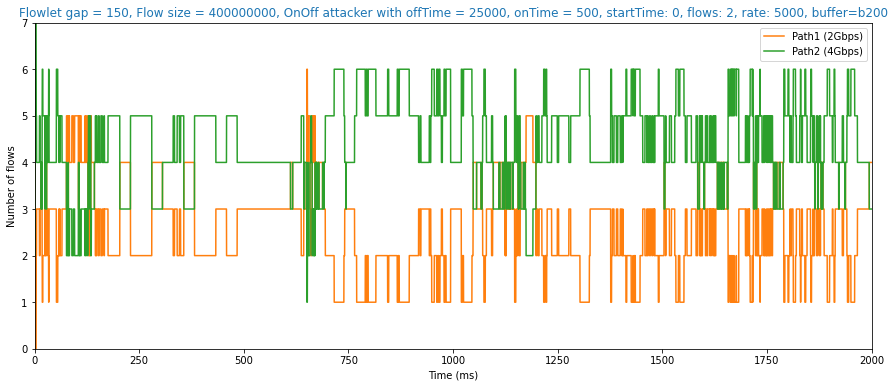

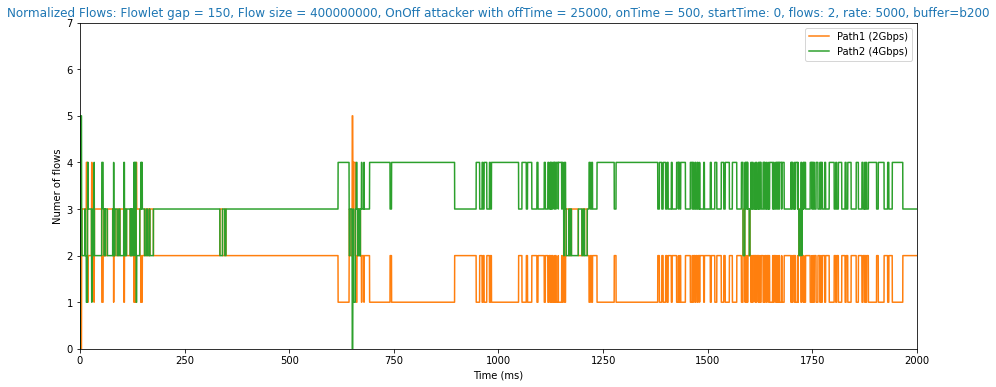

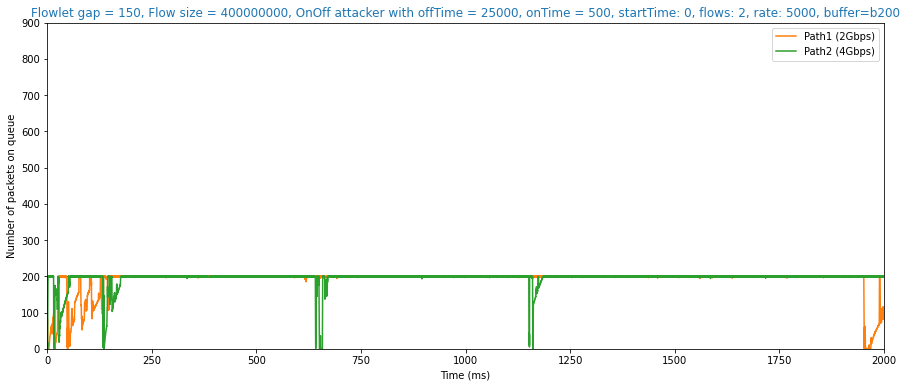

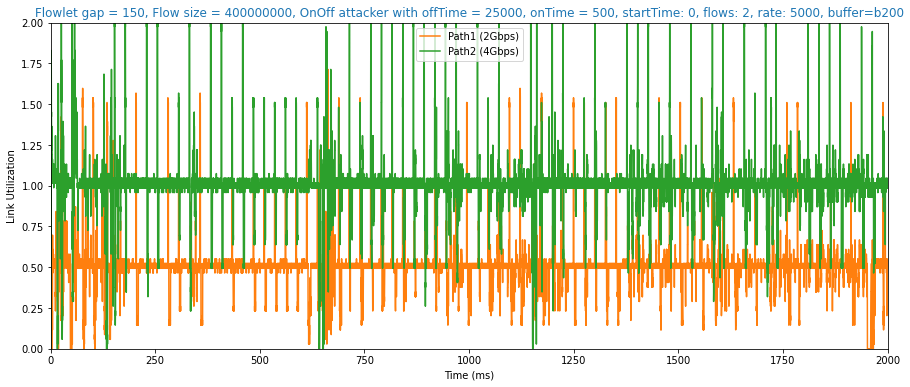

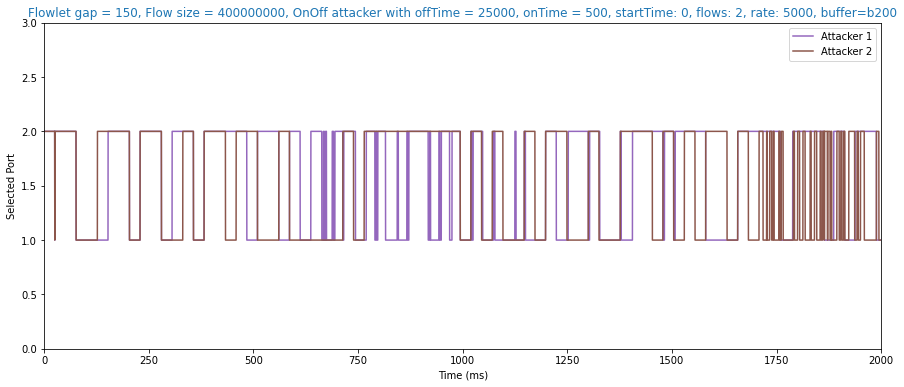

Sender Avg FCT: 2.7847
Avg FCT: 2.5863
Large Flows Avg FCT: 2.7842
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 0.6110


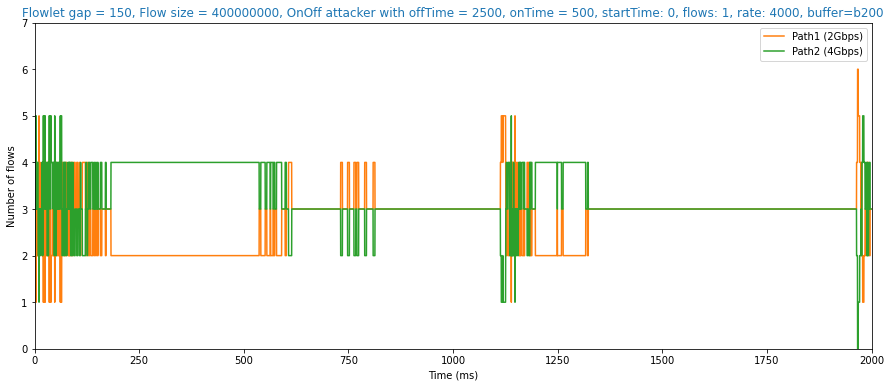

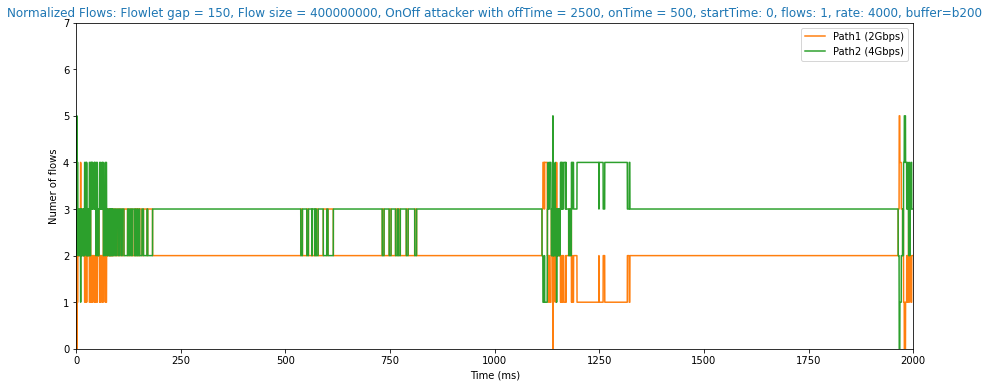

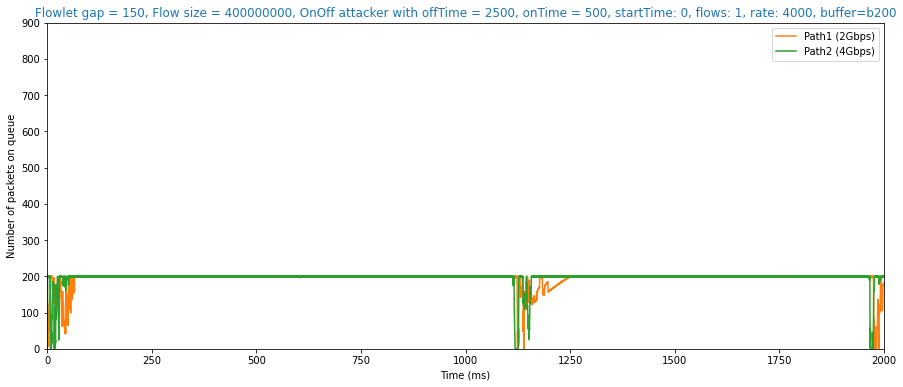

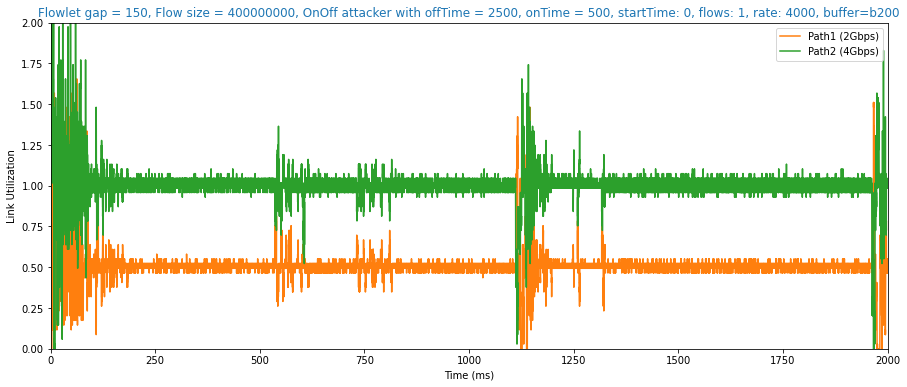

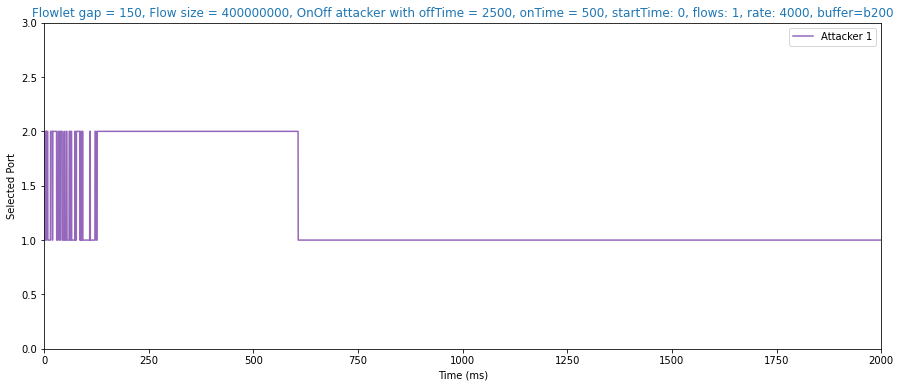

Sender Avg FCT: 2.7540
Avg FCT: 2.6362
Large Flows Avg FCT: 2.7537
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 2.0513


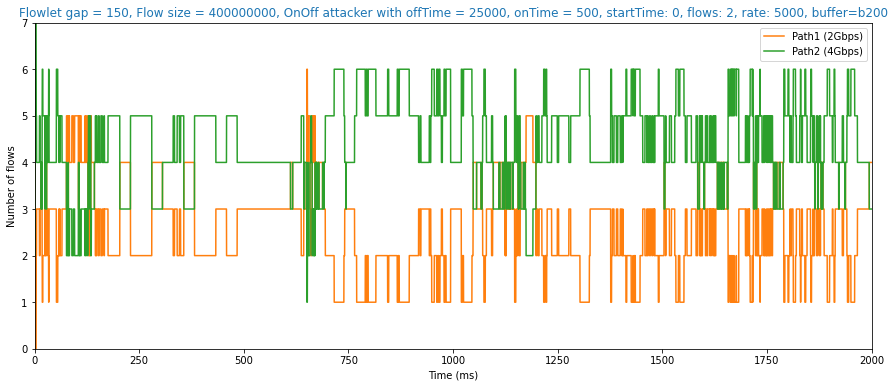

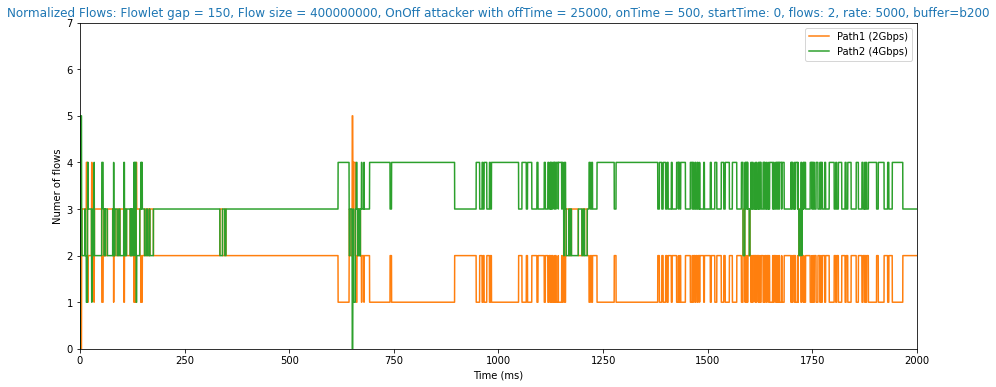

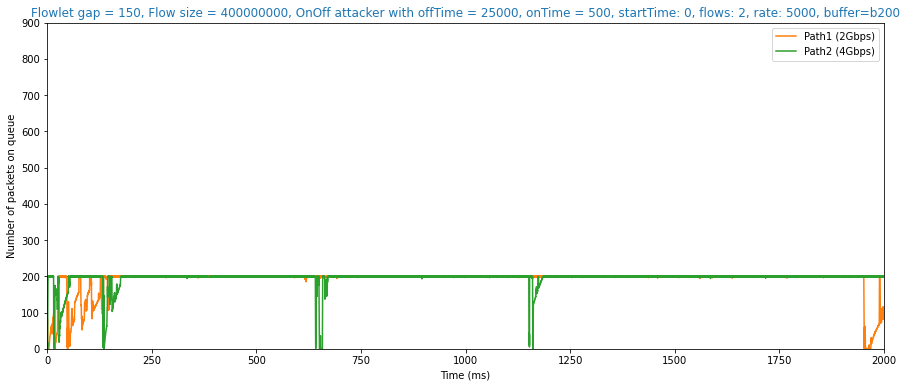

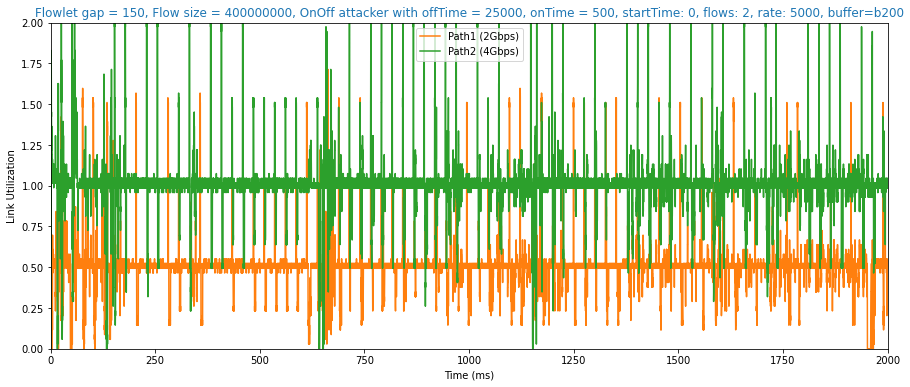

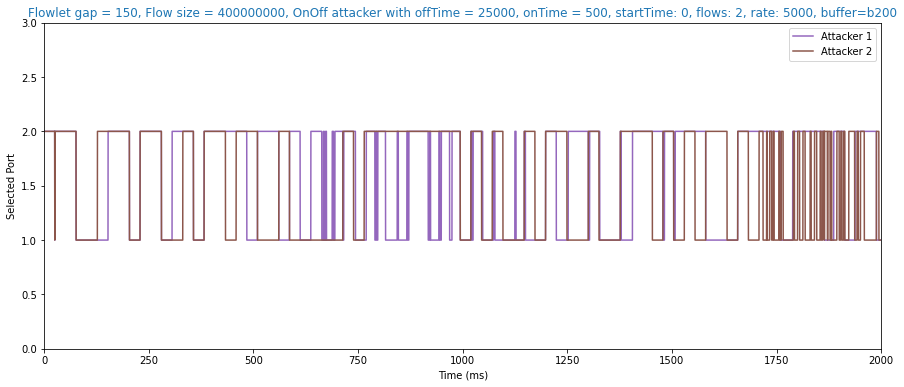

Sender Avg FCT: 2.6702
Avg FCT: 2.5816
Large Flows Avg FCT: 2.6695
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 1.7068


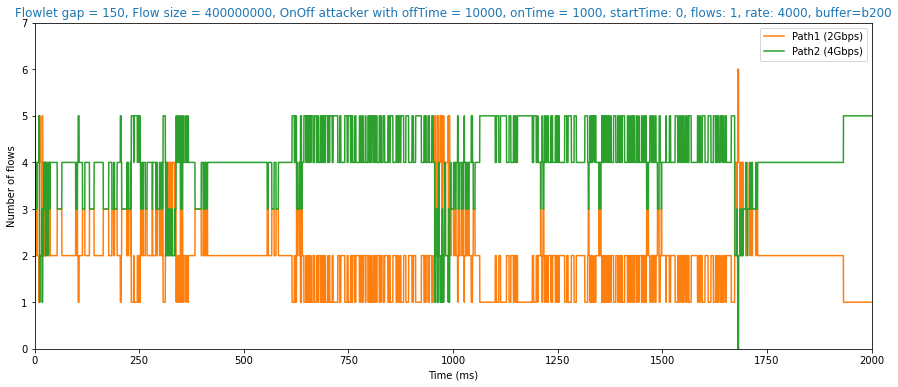

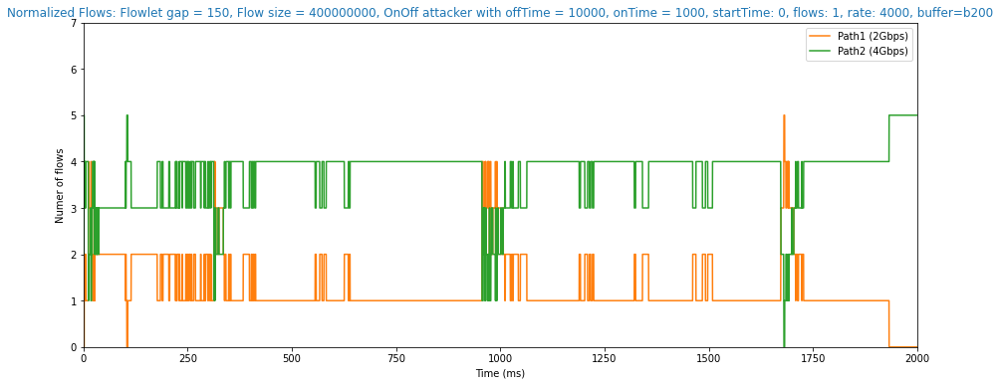

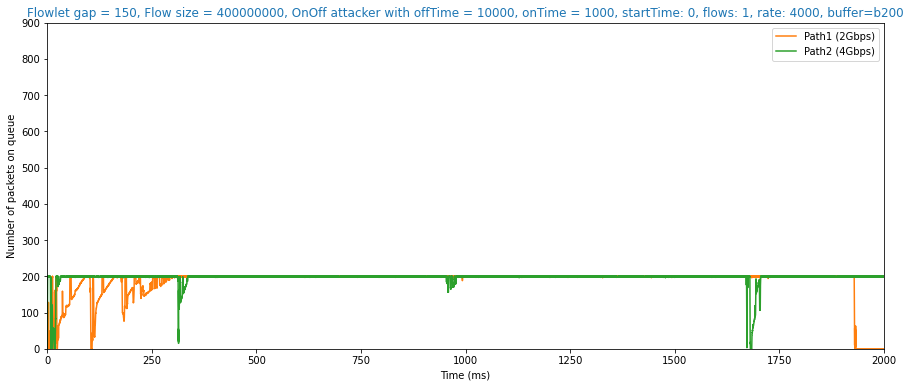

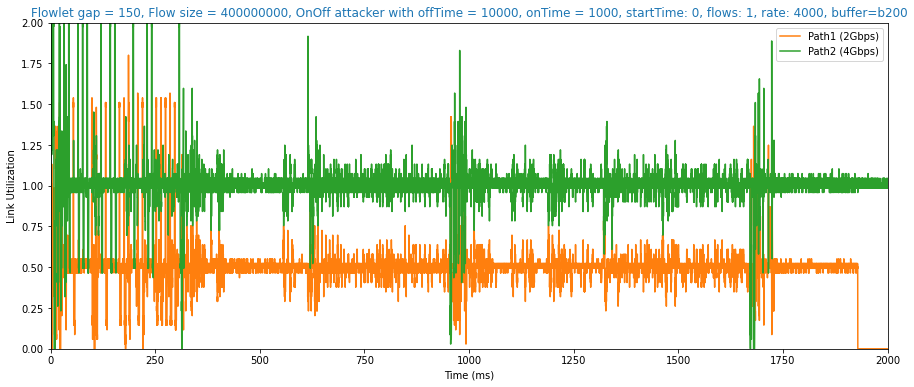

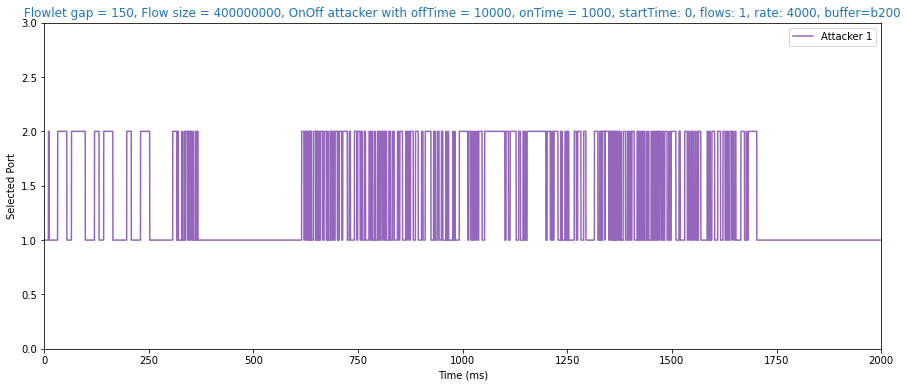

Sender Avg FCT: 2.6460
Avg FCT: 2.5847
Large Flows Avg FCT: 2.6456
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 1.9763


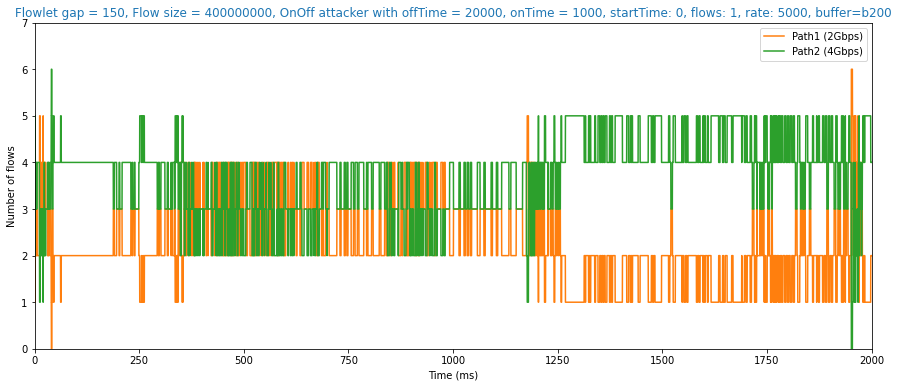

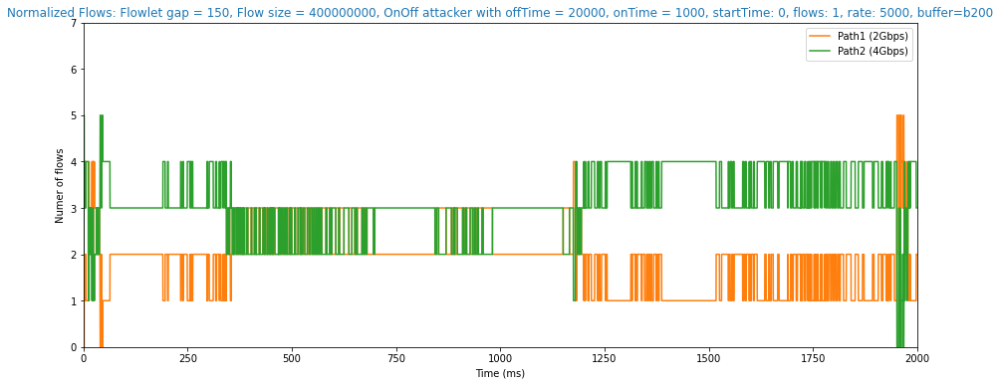

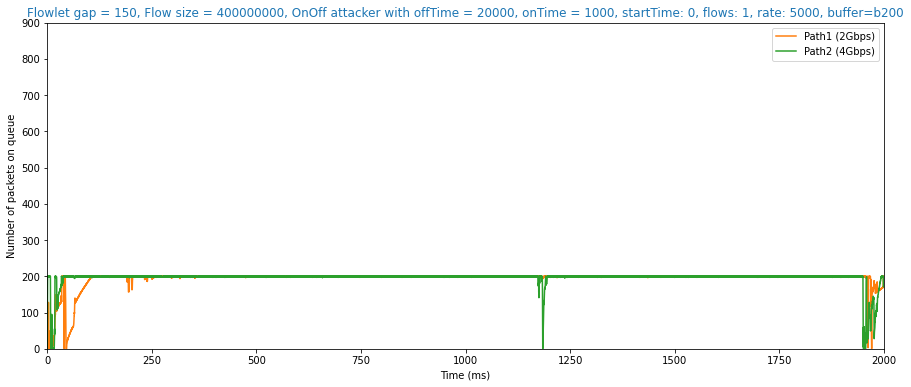

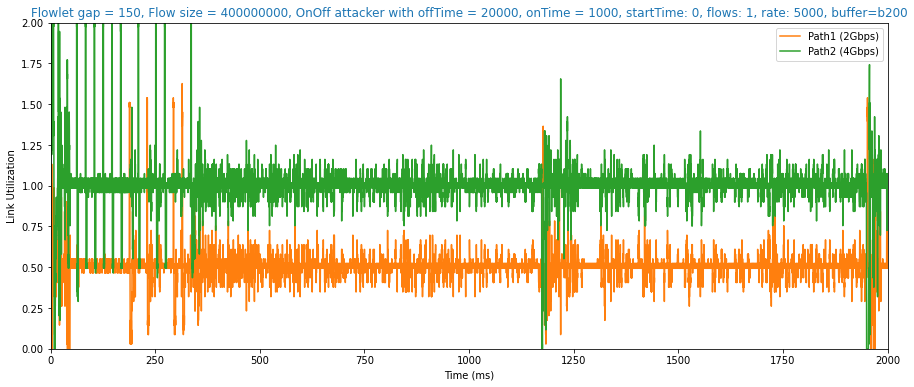

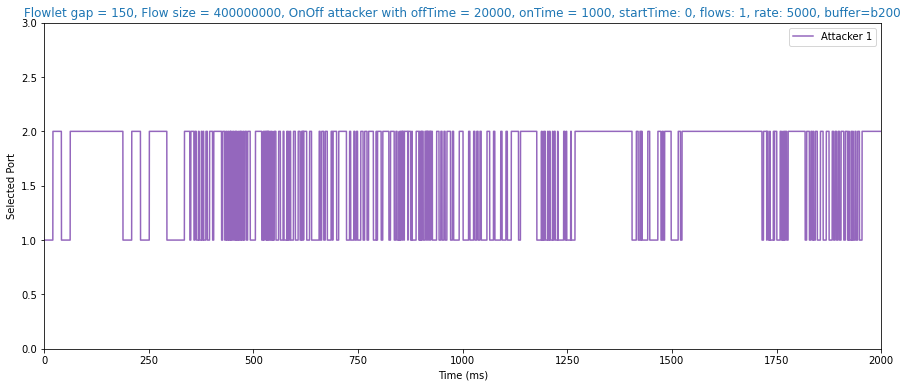

Sender Avg FCT: 2.5959
Avg FCT: 2.4598
Large Flows Avg FCT: 2.5949
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 1.1123


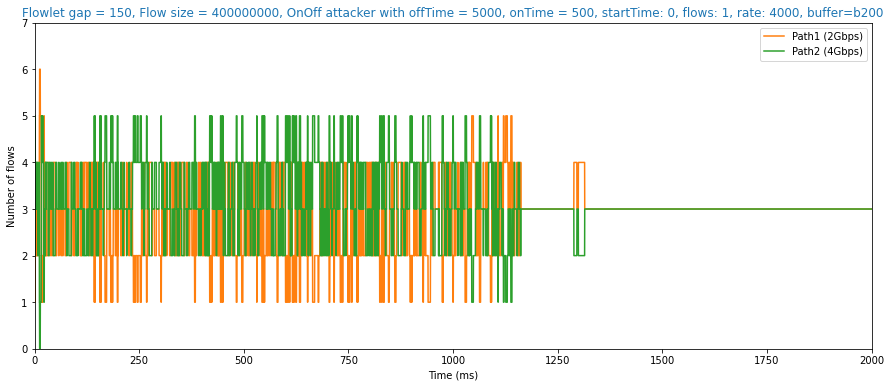

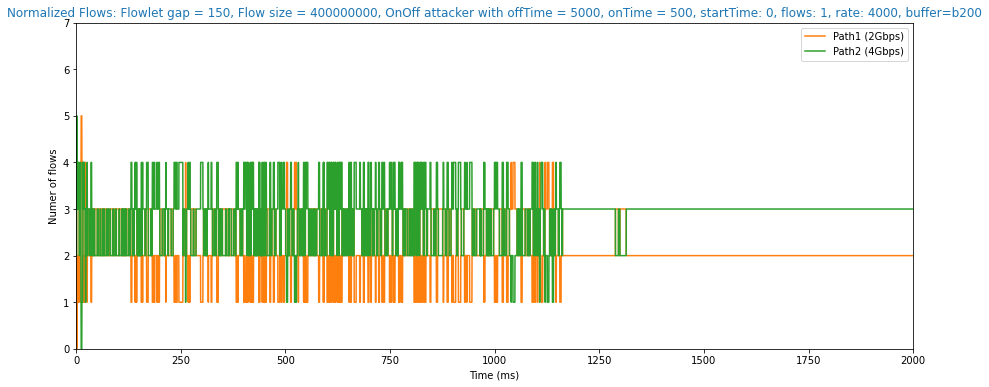

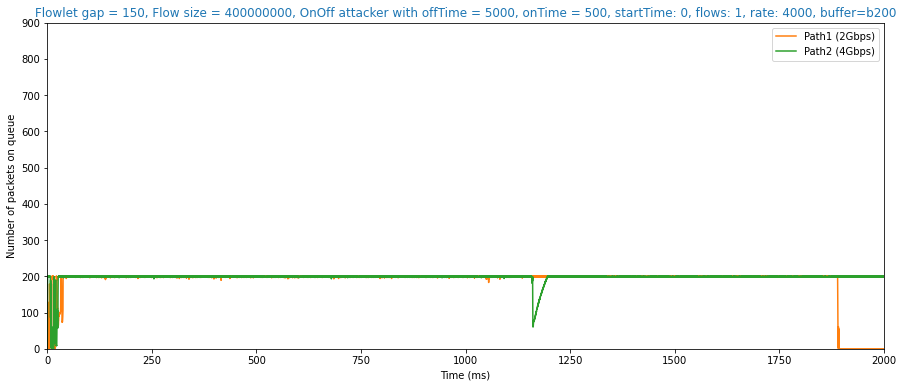

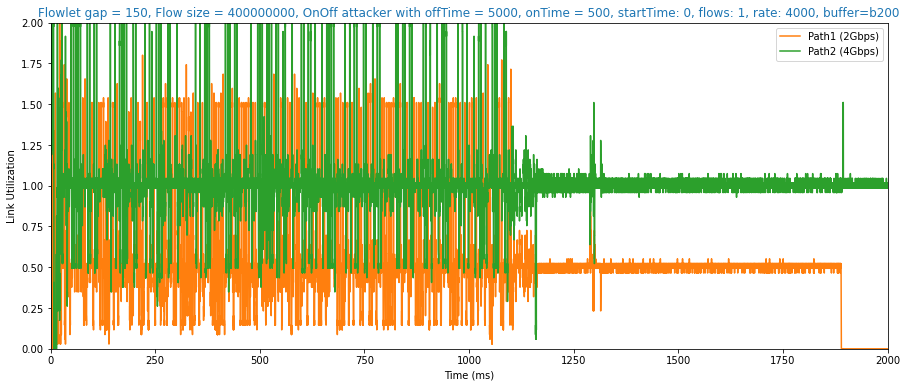

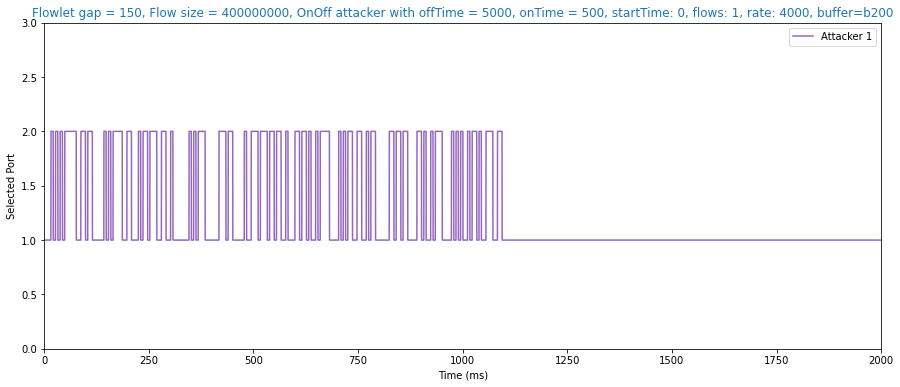

Sender Avg FCT: 2.5921
Avg FCT: 2.6393
Large Flows Avg FCT: 2.5916
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 3.1174


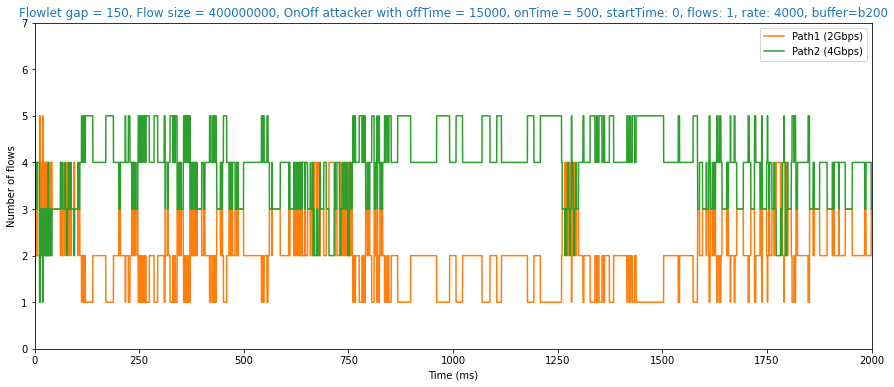

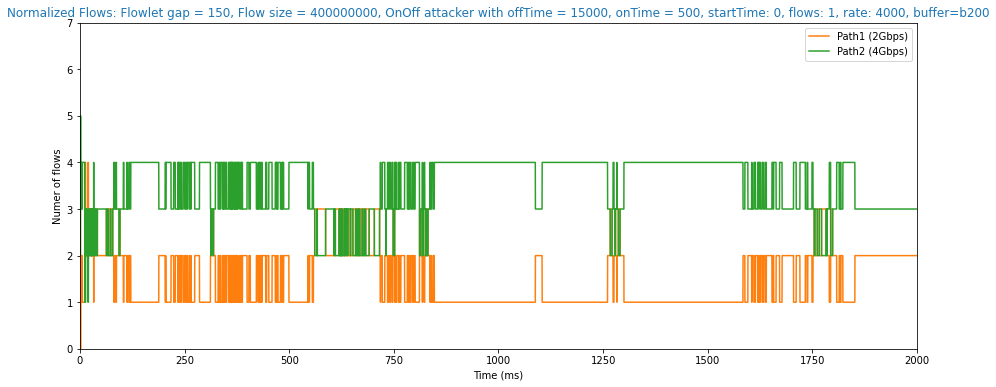

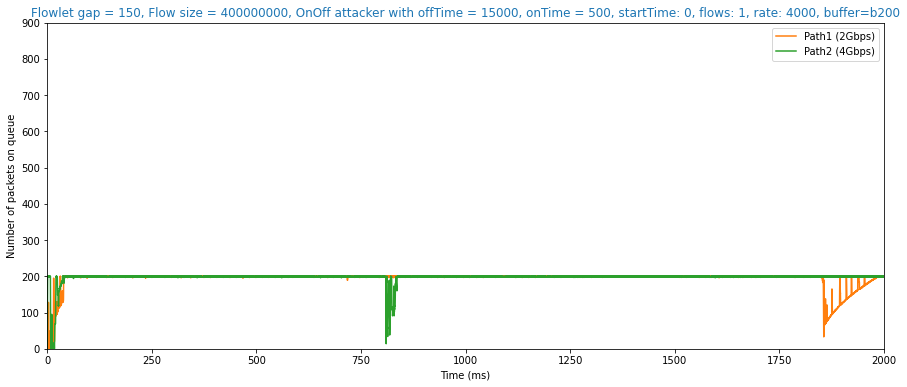

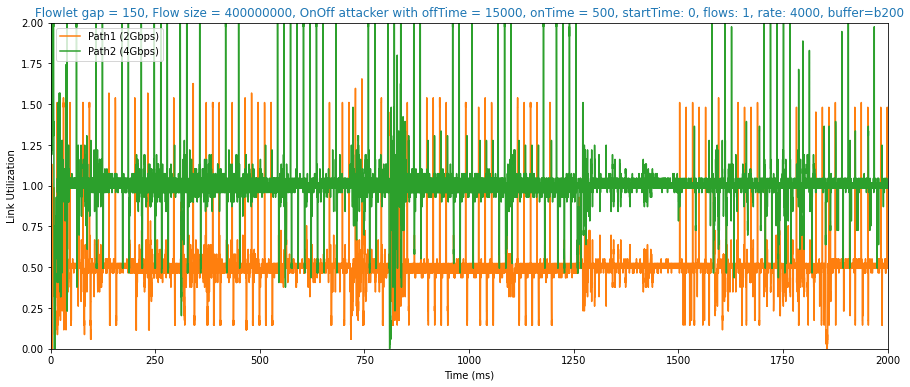

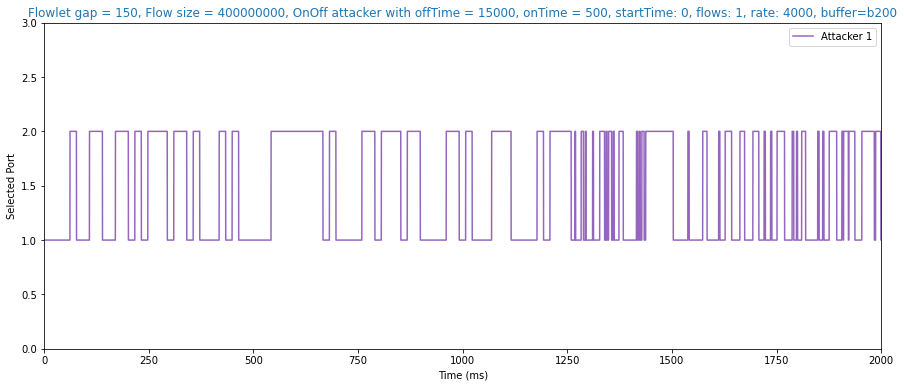

Sender Avg FCT: 2.5731
Avg FCT: 2.5337
Large Flows Avg FCT: 2.5721
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 2.1499


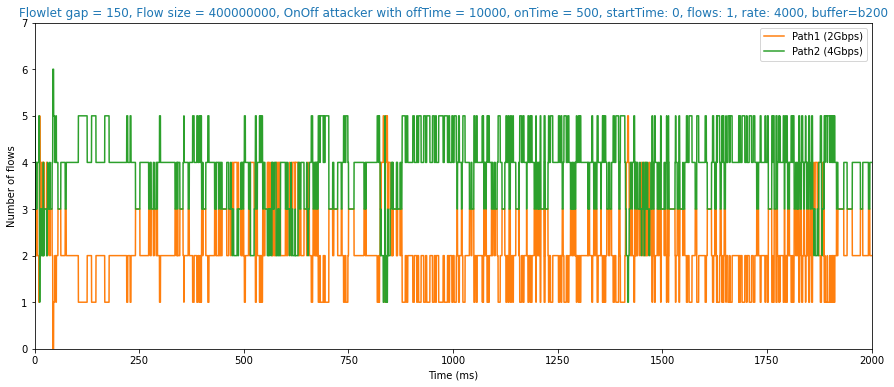

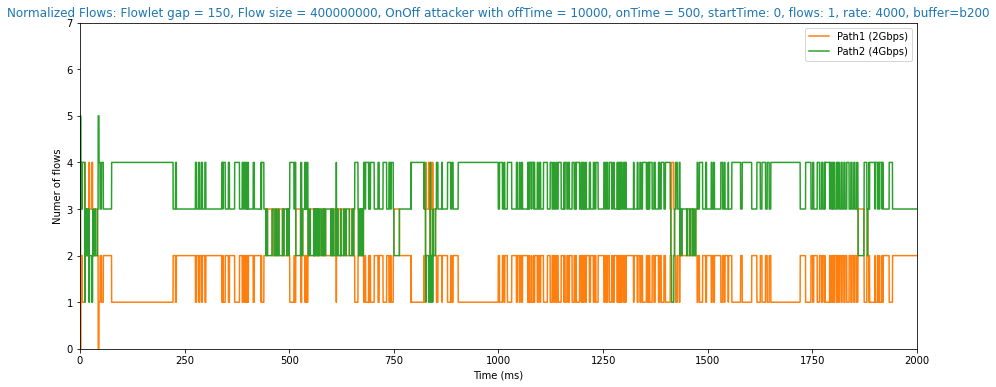

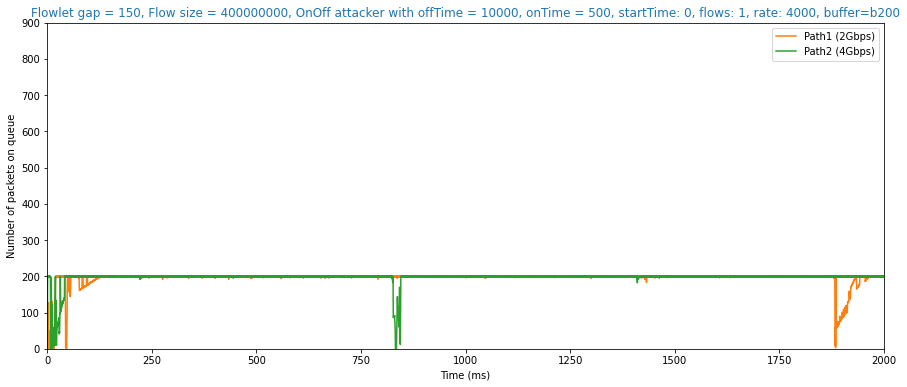

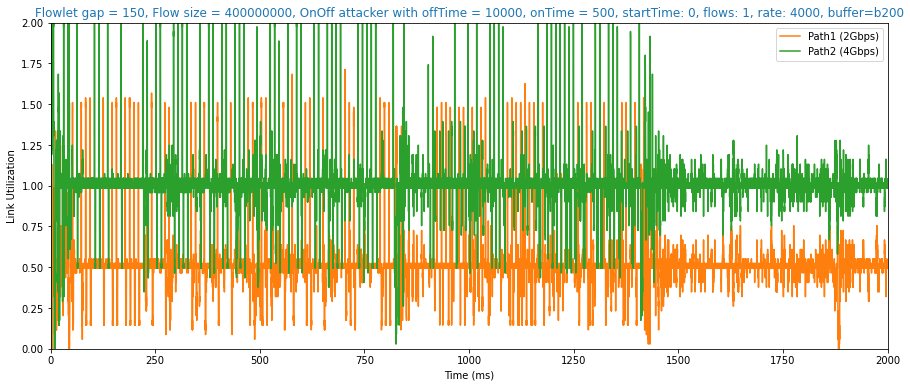

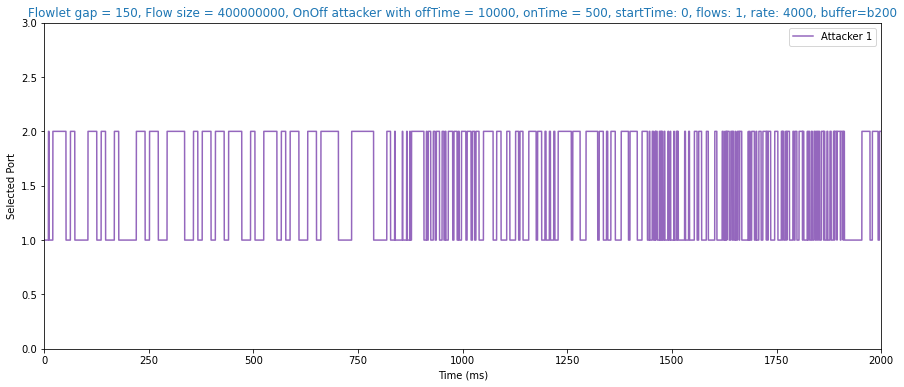

Sender Avg FCT: 2.5666
Avg FCT: 2.3653
Large Flows Avg FCT: 2.5663
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 0.3591


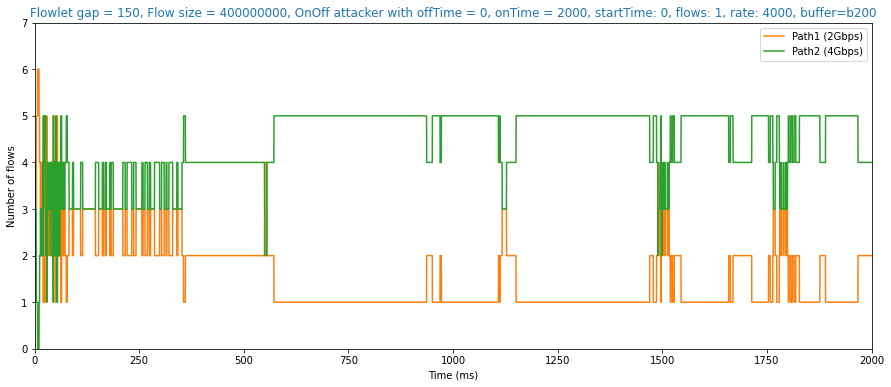

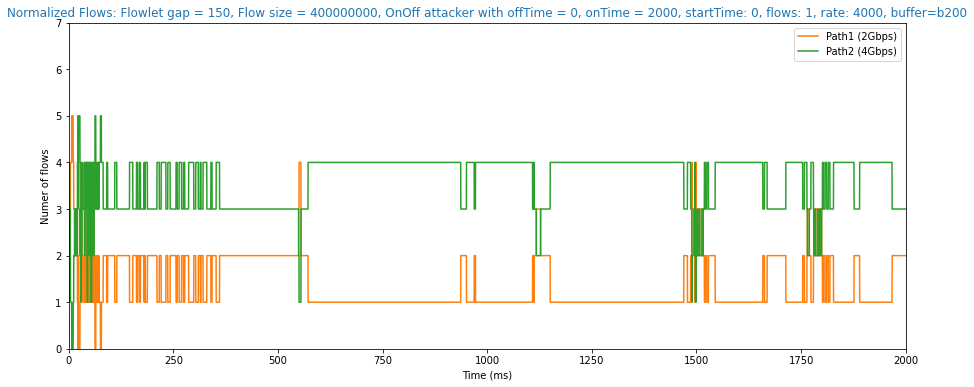

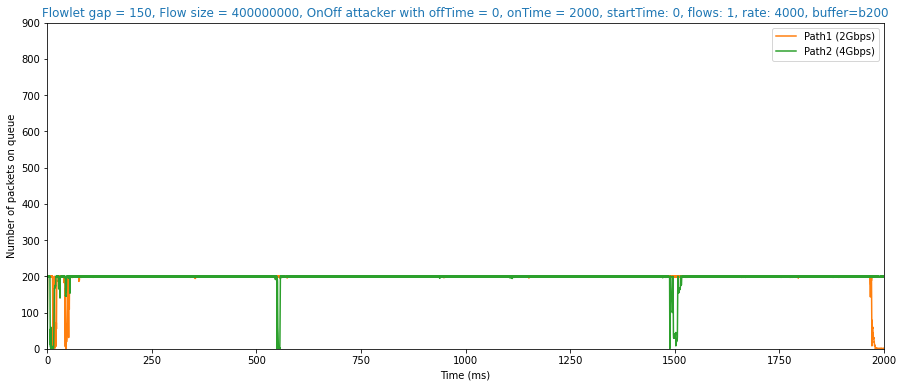

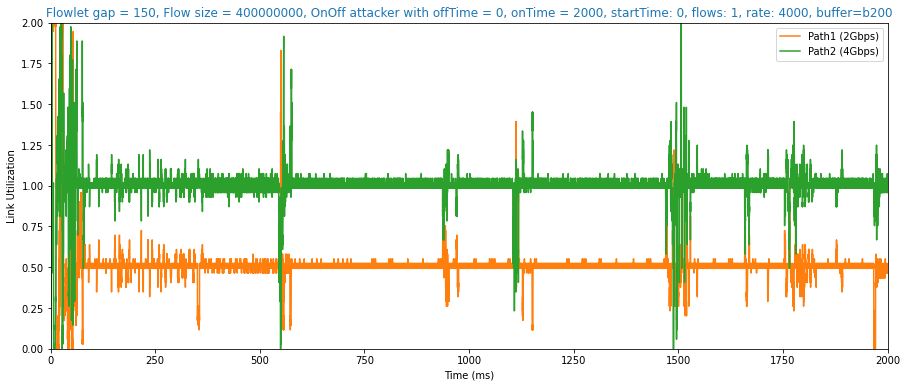

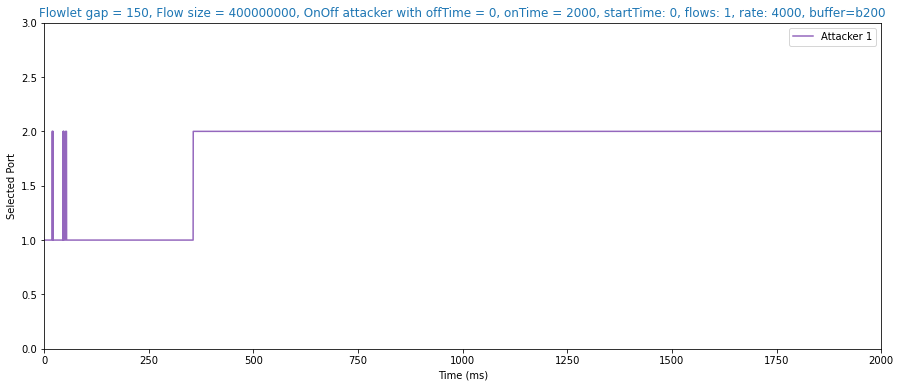

Sender Avg FCT: 2.5297
Avg FCT: 2.5362
Large Flows Avg FCT: 2.5290
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 2.6107


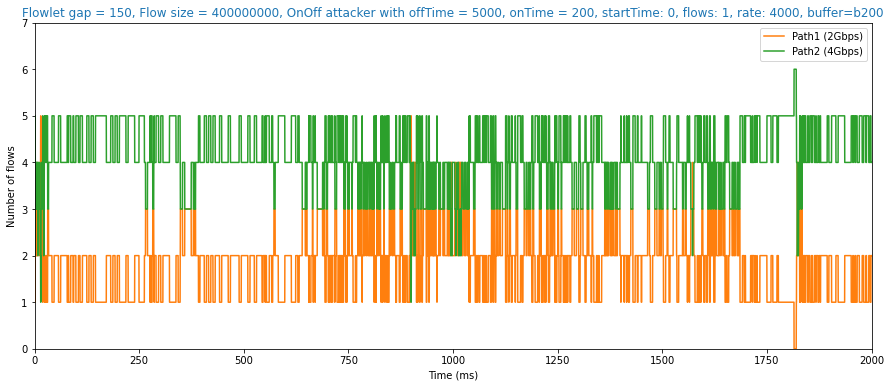

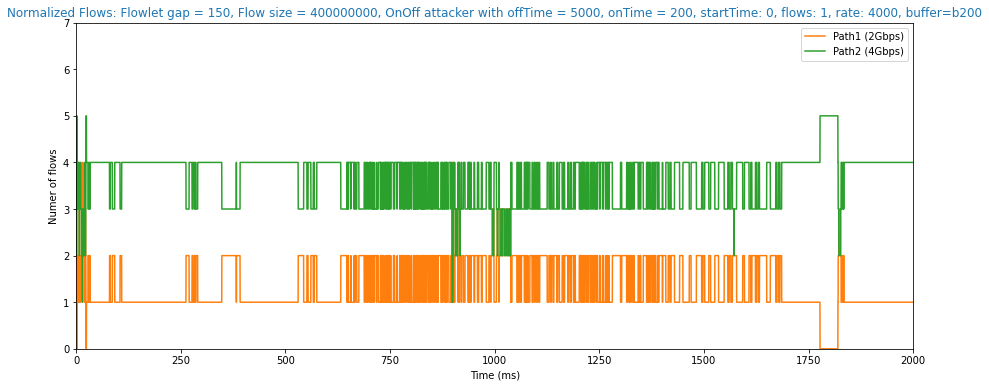

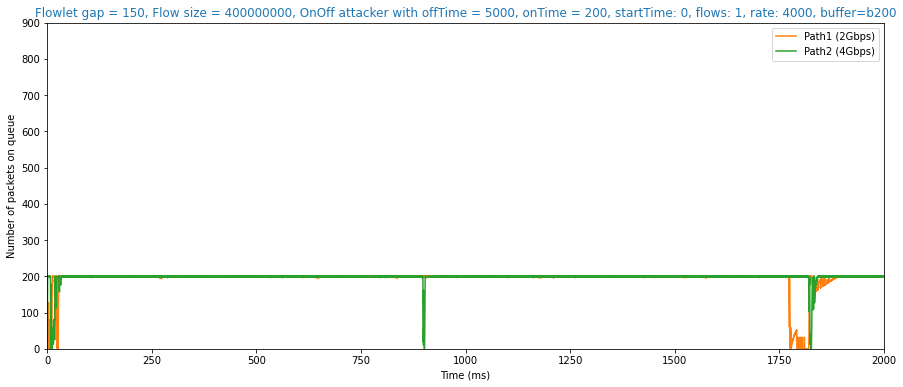

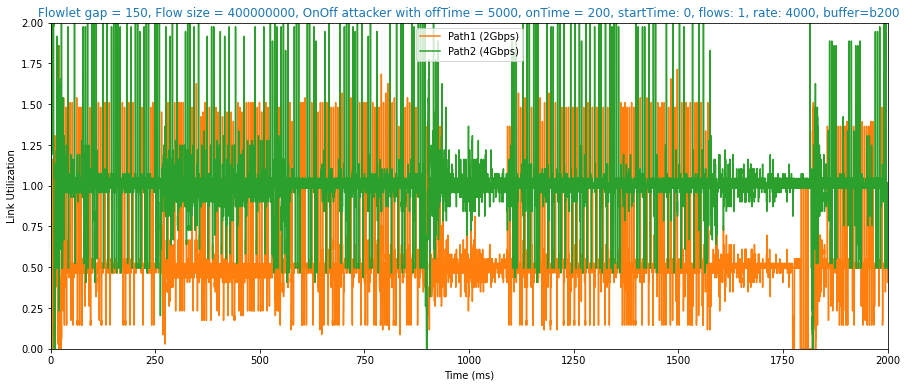

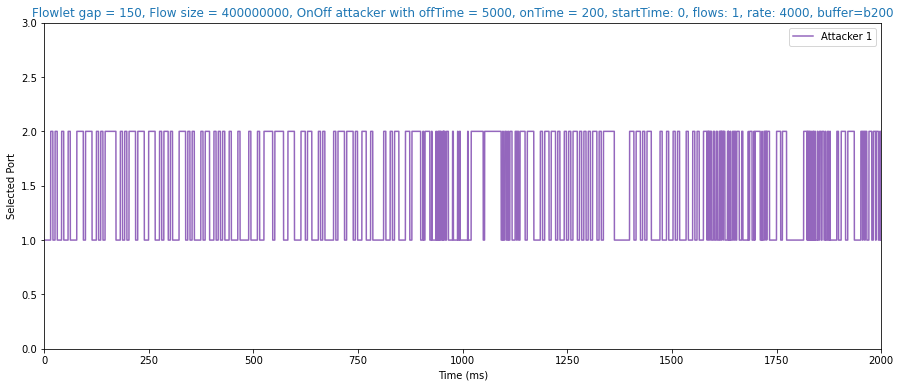

Sender Avg FCT: 2.4280
Avg FCT: 2.3981
Large Flows Avg FCT: 2.4274
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 2.1052


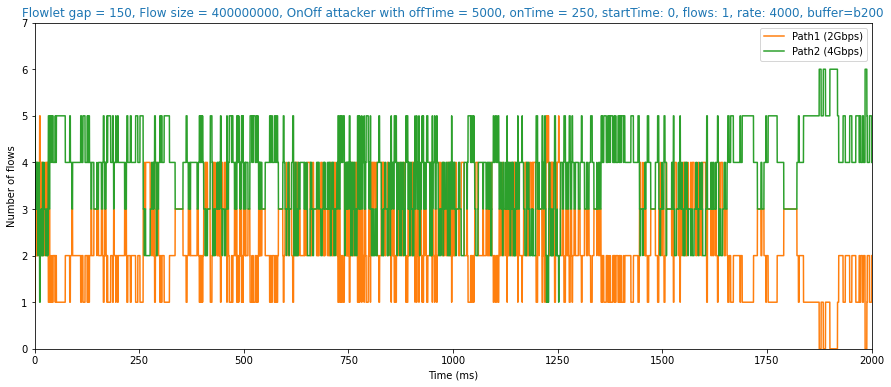

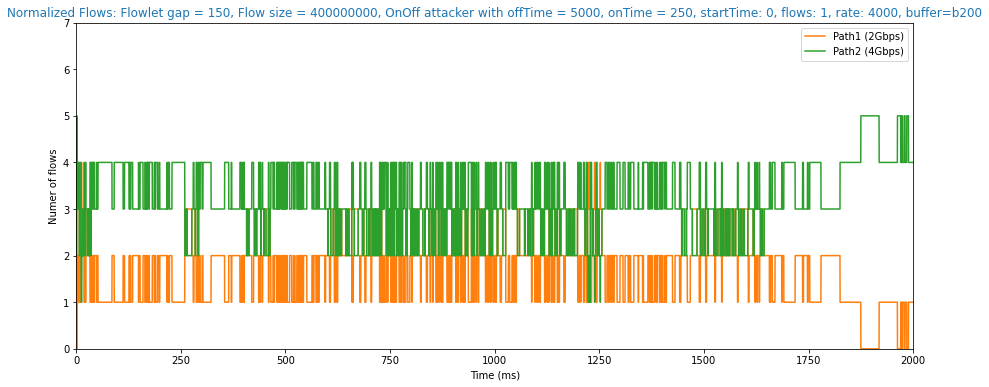

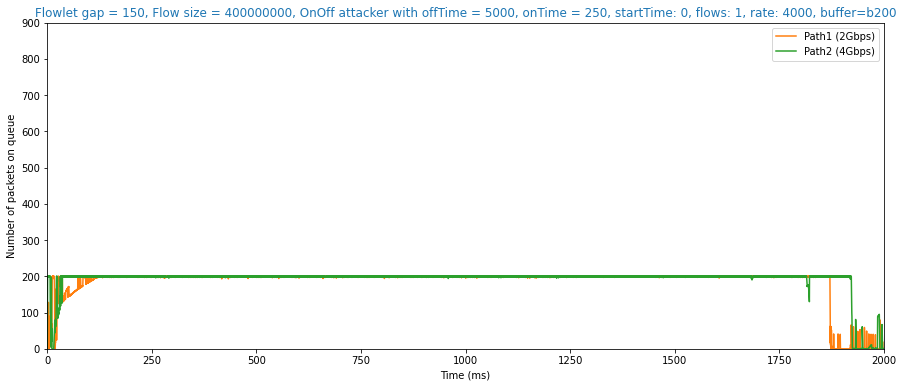

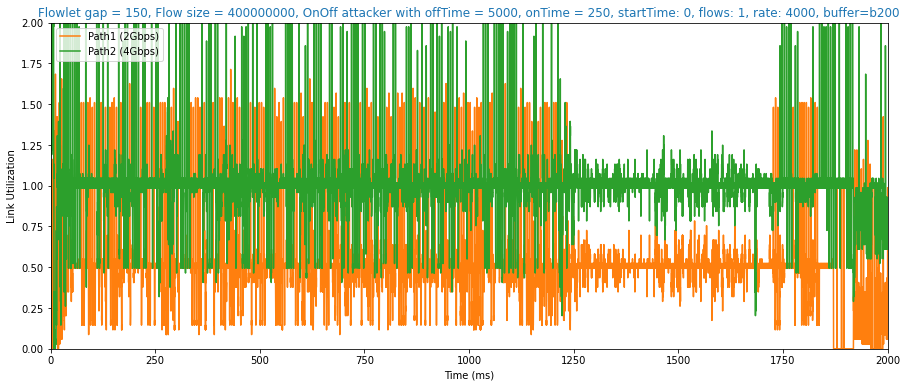

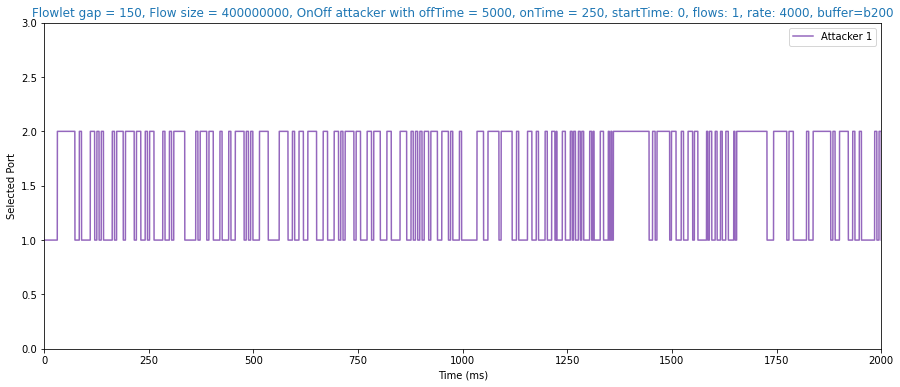

Sender Avg FCT: 2.4193
Avg FCT: 2.3457
Large Flows Avg FCT: 2.4185
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 1.6208


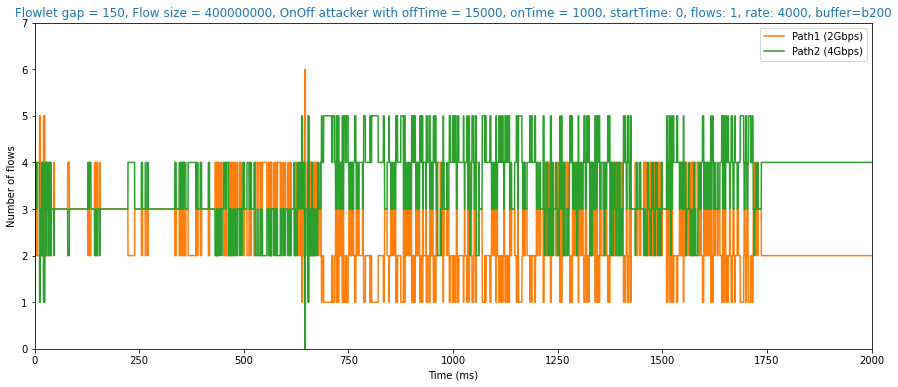

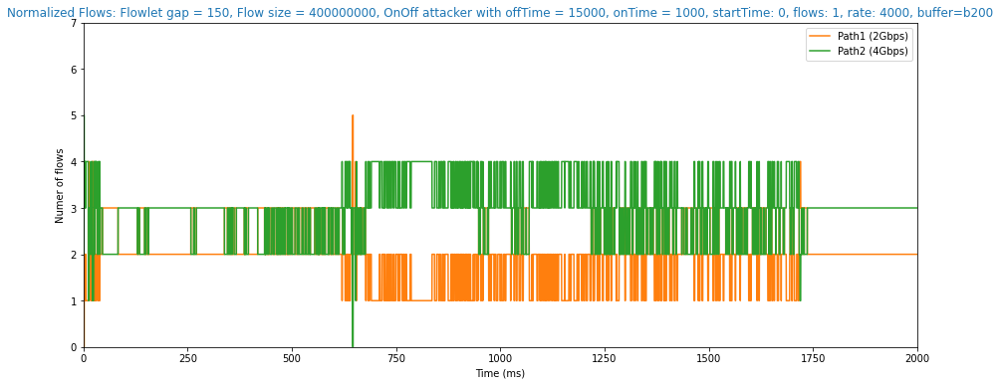

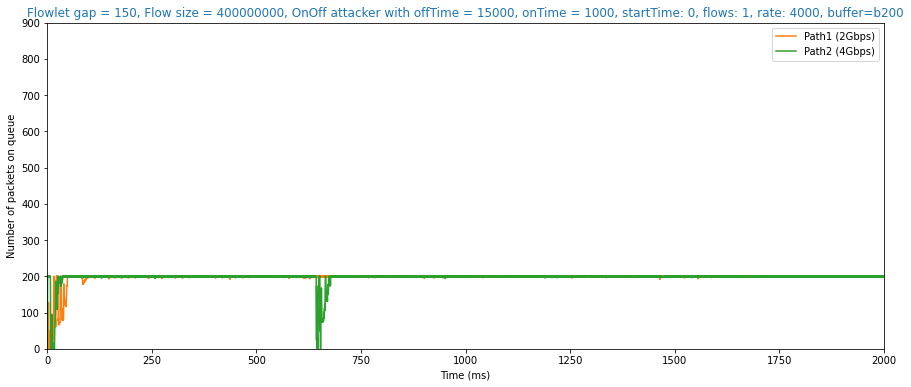

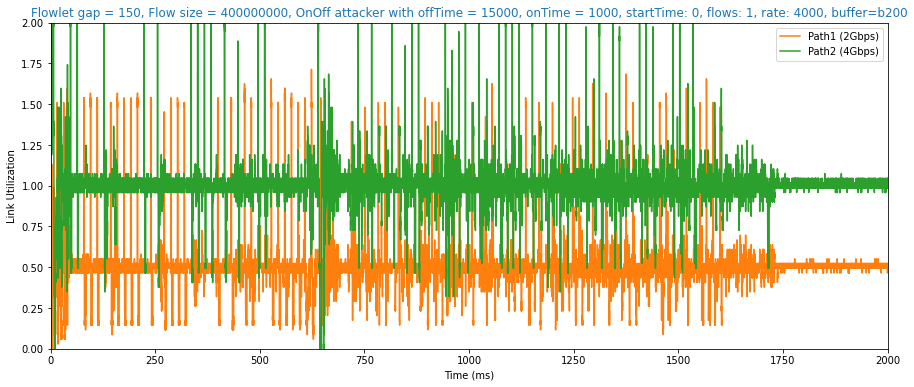

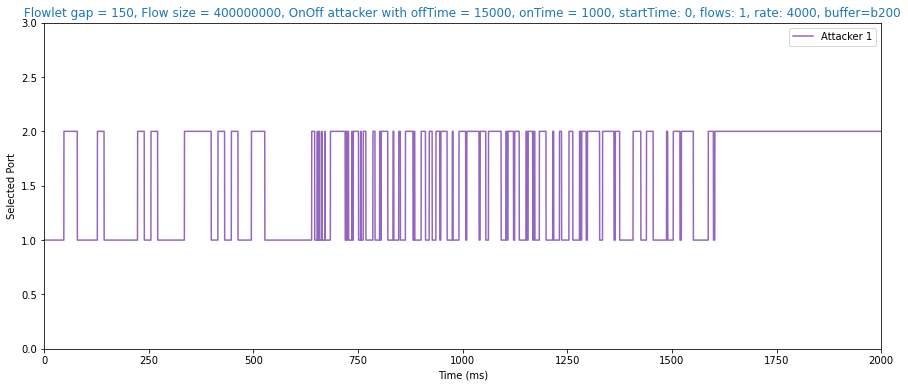

In [109]:
for i in sim27:
    plotSimulationRange(i,(0,2000))

In [84]:
#Increased initial cwnd for attacker
# 6 servers, flowlet gap 250
import os 

directory = "/Users/gian/Documents/Madison/simulations/sim26"
os.chdir(directory)
sim26 = []
for filename in os.listdir(directory):
    if filename.endswith(".flow"):
        sim26.append(parseSimulationFiles(filename.split('.')[0]))
sim26.sort(key=worstSenderAvgFct)

Sender Avg FCT: 2.8256
Avg FCT: 2.6912
Large Flows Avg FCT: 2.8246
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 1.3584


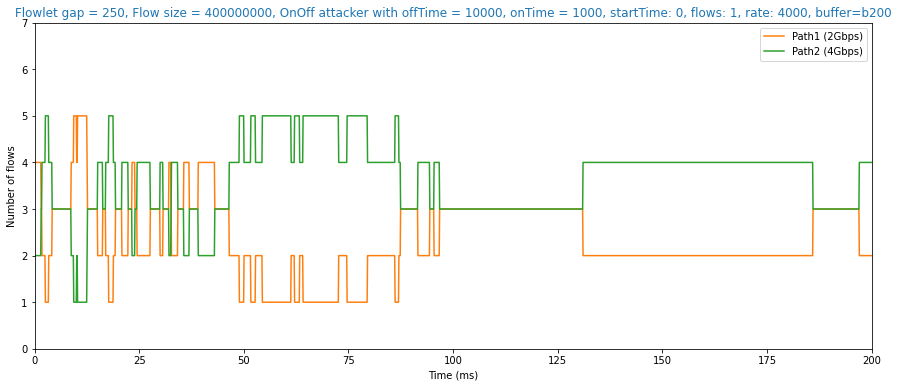

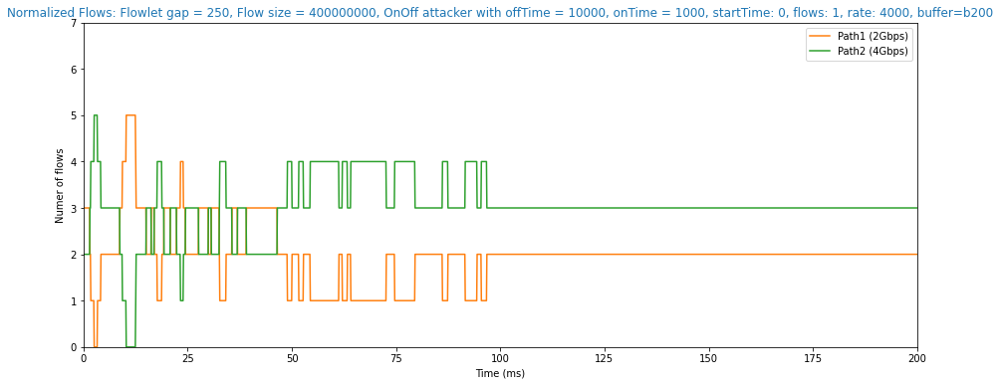

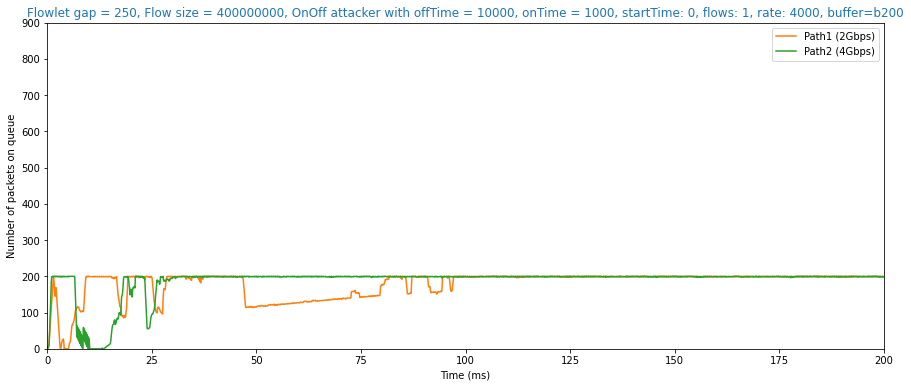

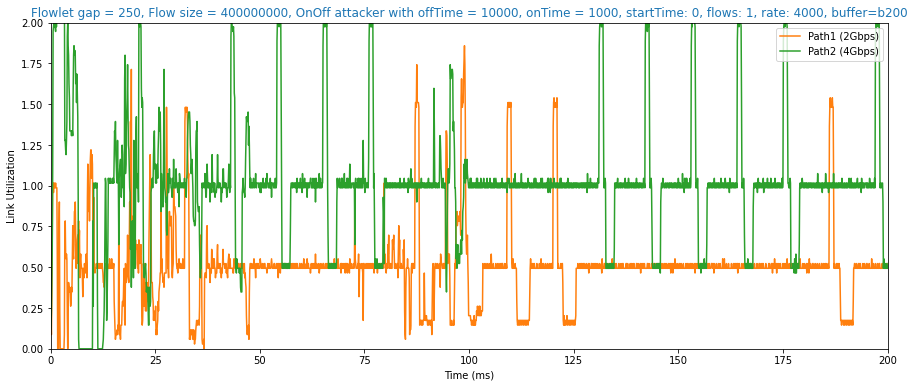

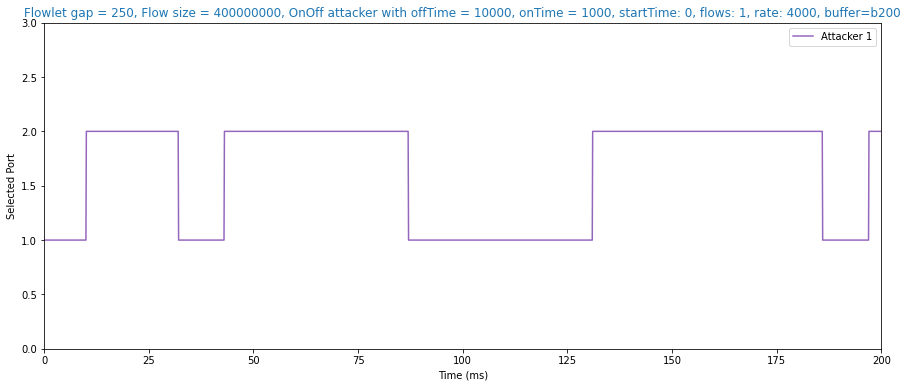

Sender Avg FCT: 2.7787
Avg FCT: 2.6761
Large Flows Avg FCT: 2.7773
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 1.6676


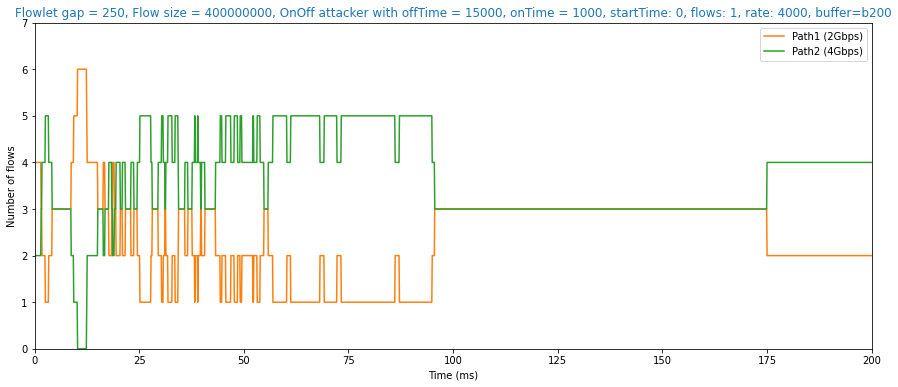

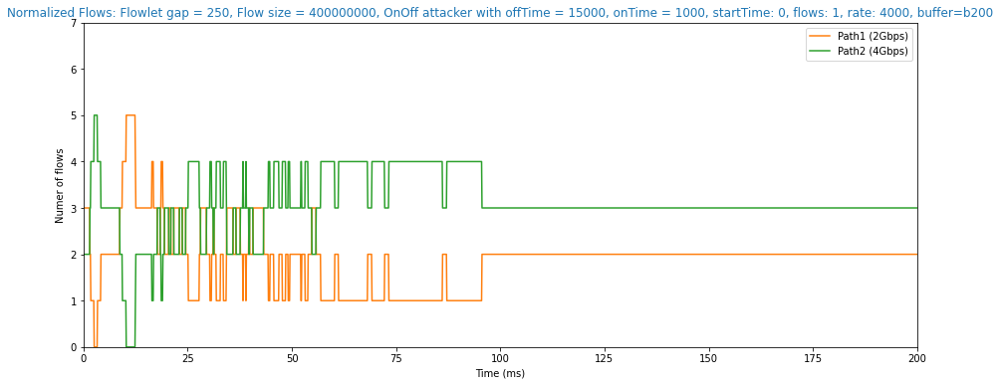

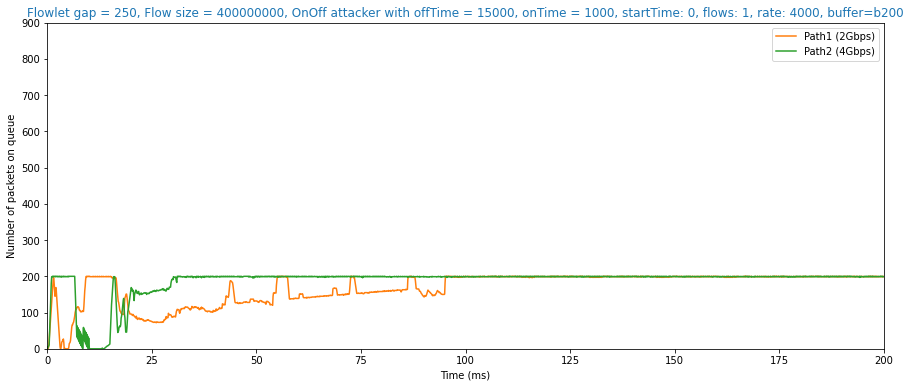

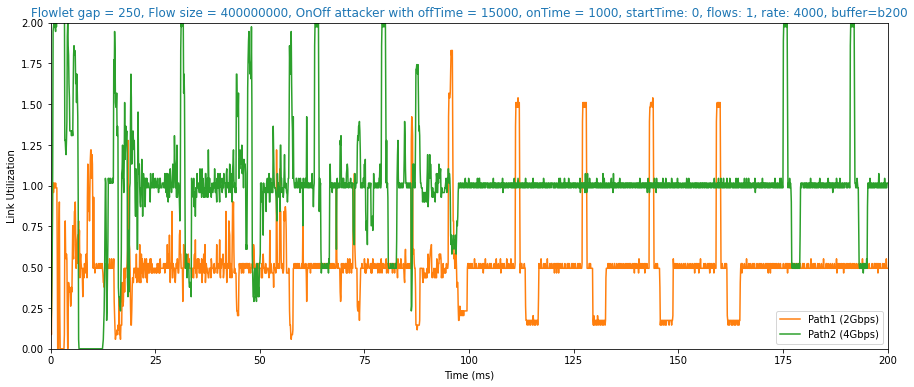

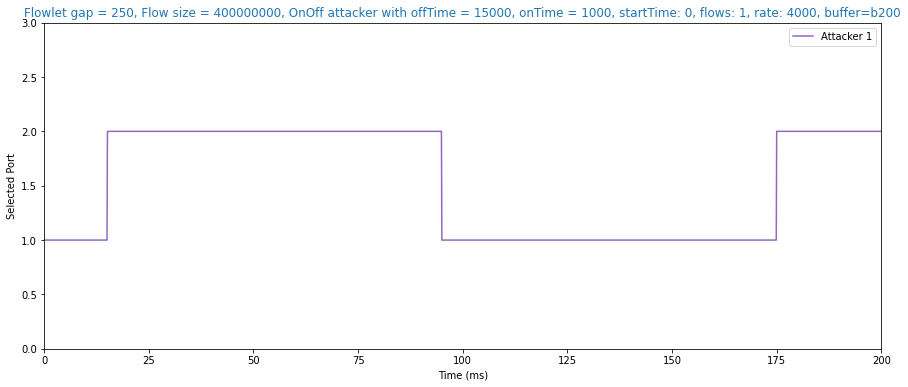

Sender Avg FCT: 2.6869
Avg FCT: 2.6791
Large Flows Avg FCT: 2.6863
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 2.6083


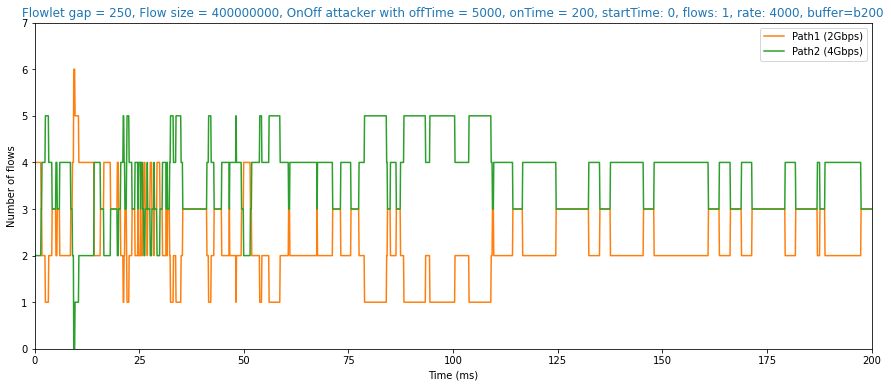

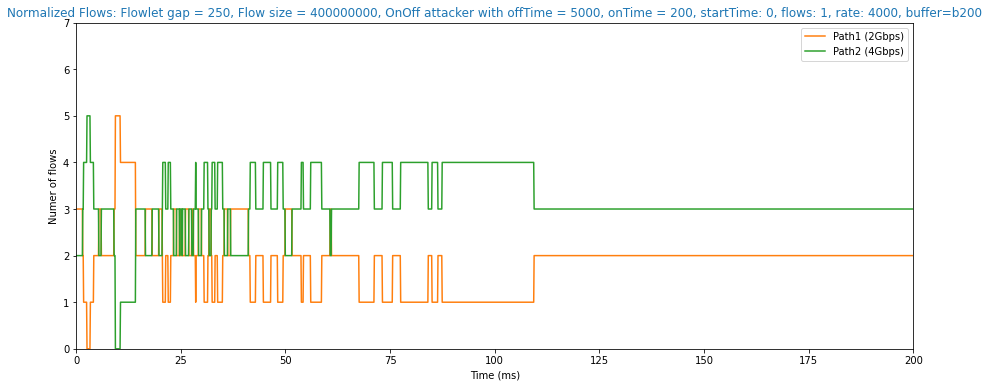

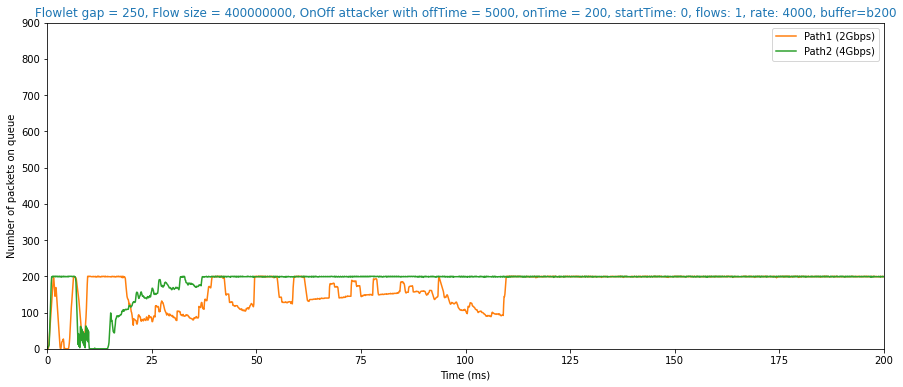

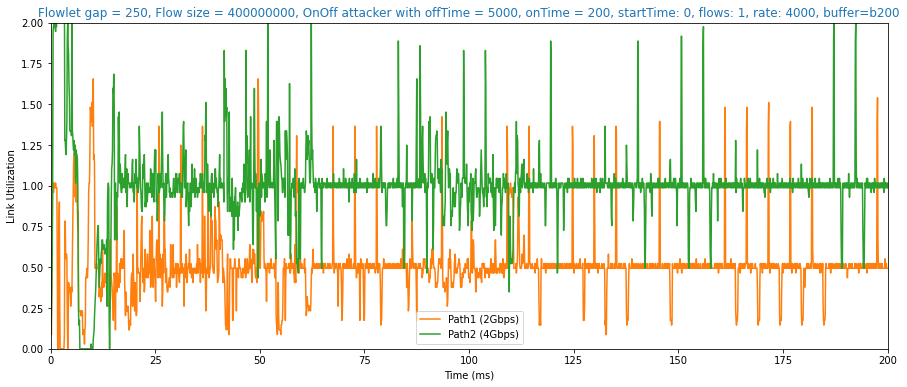

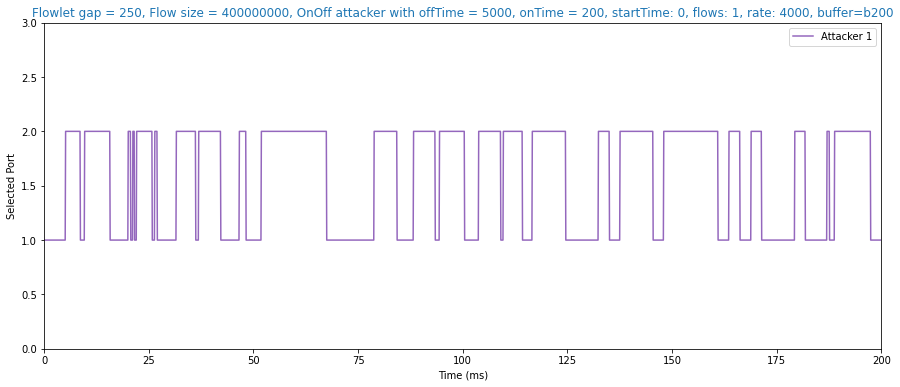

Sender Avg FCT: 2.6299
Avg FCT: 2.4203
Large Flows Avg FCT: 2.6292
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 0.3338


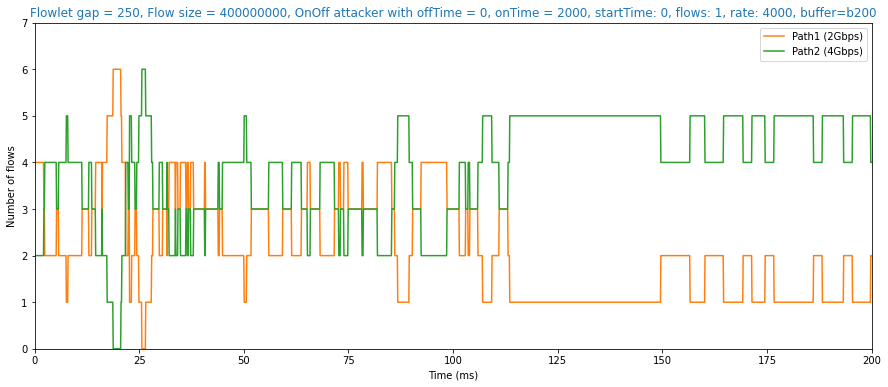

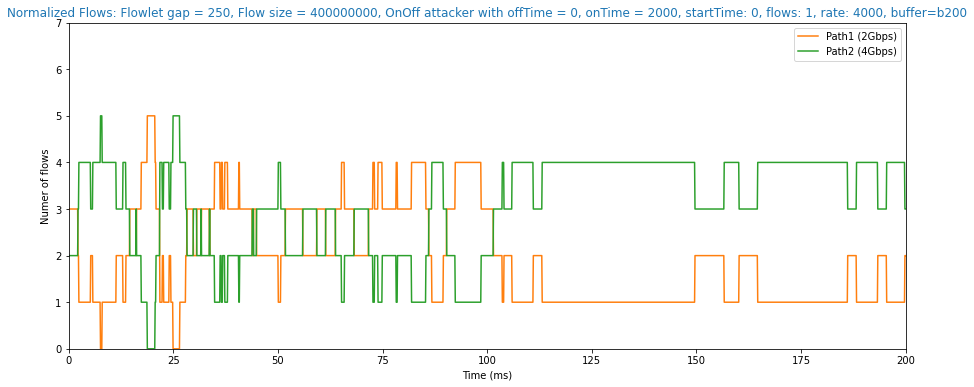

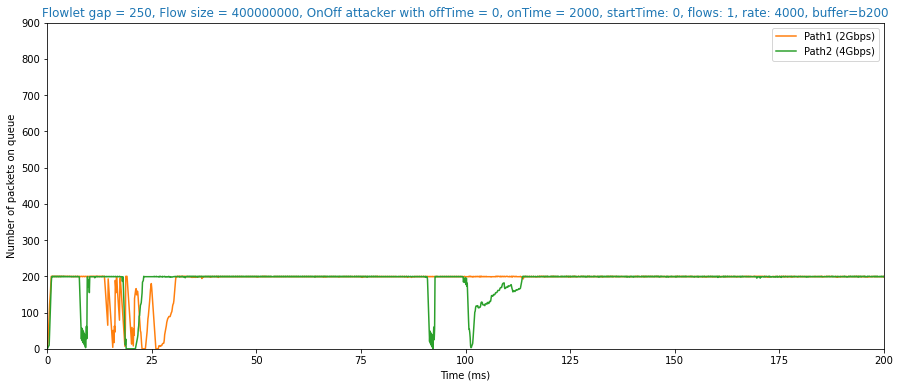

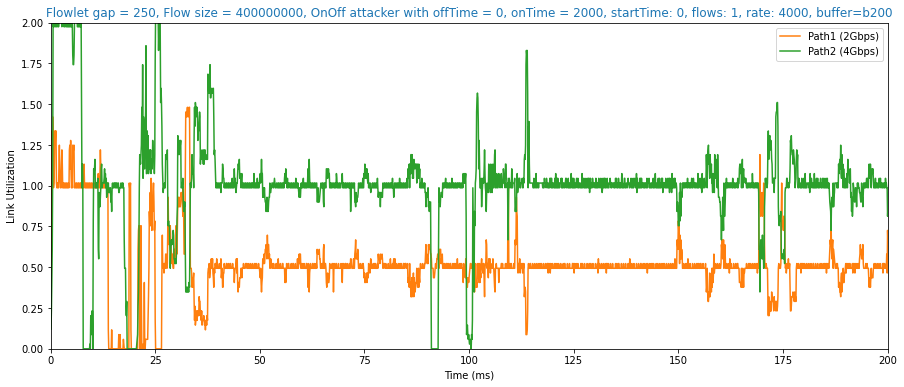

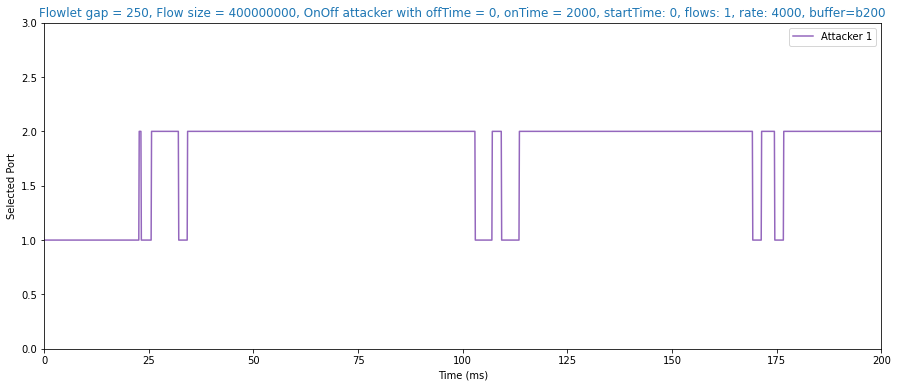

Sender Avg FCT: 2.6259
Avg FCT: 2.6695
Large Flows Avg FCT: 2.6249
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 3.1151


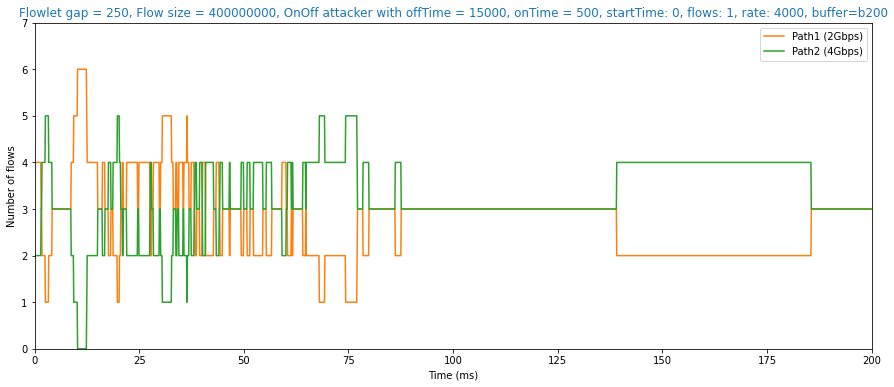

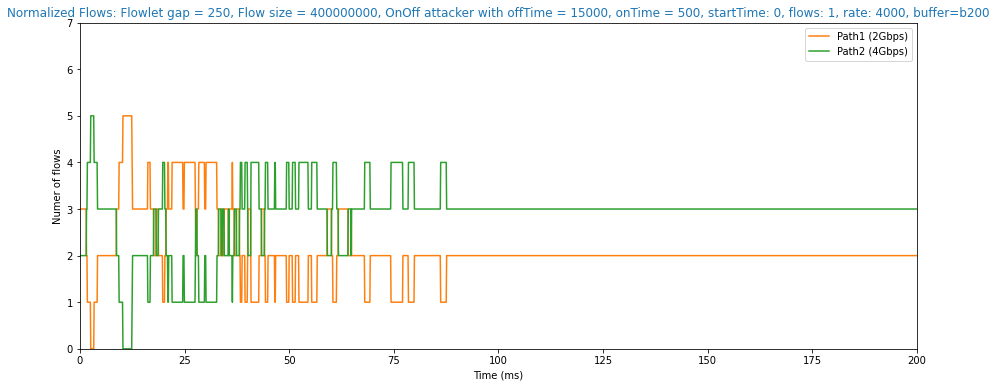

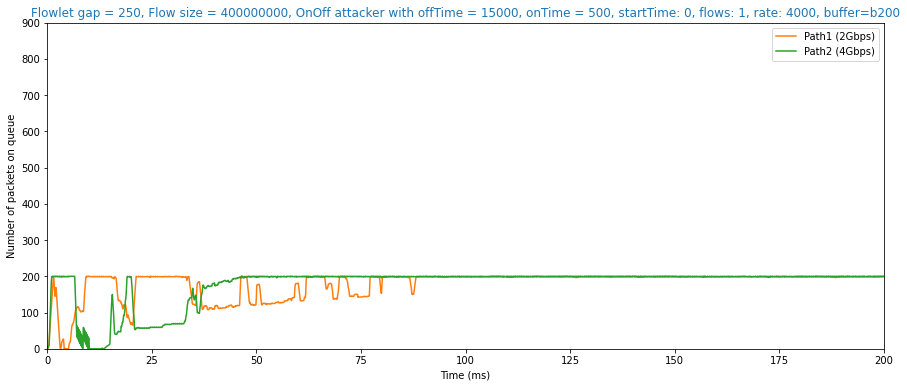

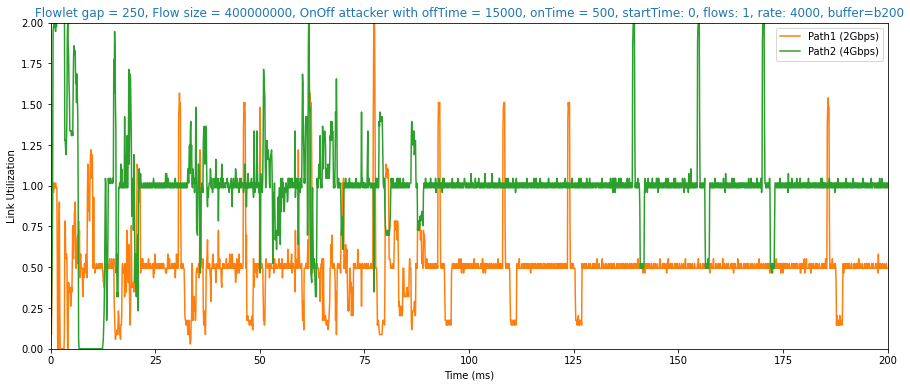

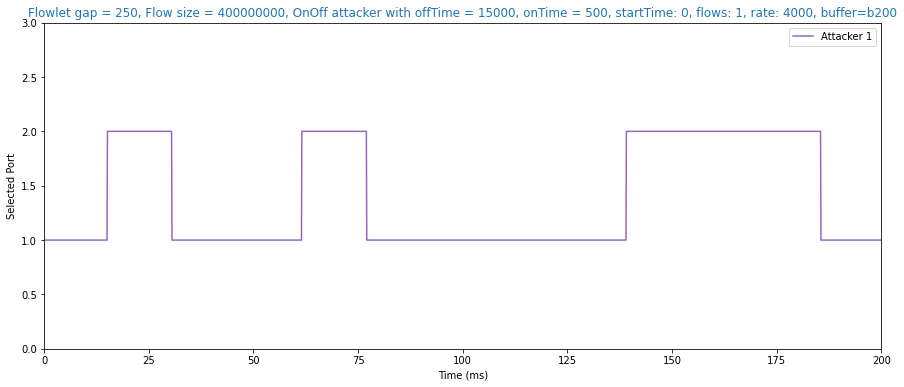

Sender Avg FCT: 2.6096
Avg FCT: 2.4364
Large Flows Avg FCT: 2.6087
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 0.7161


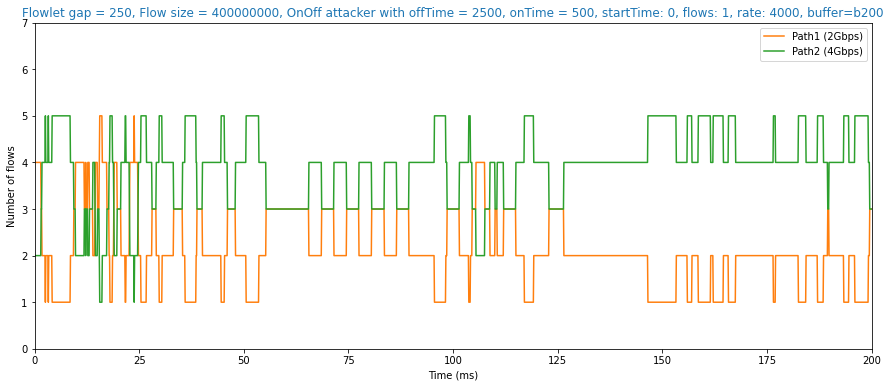

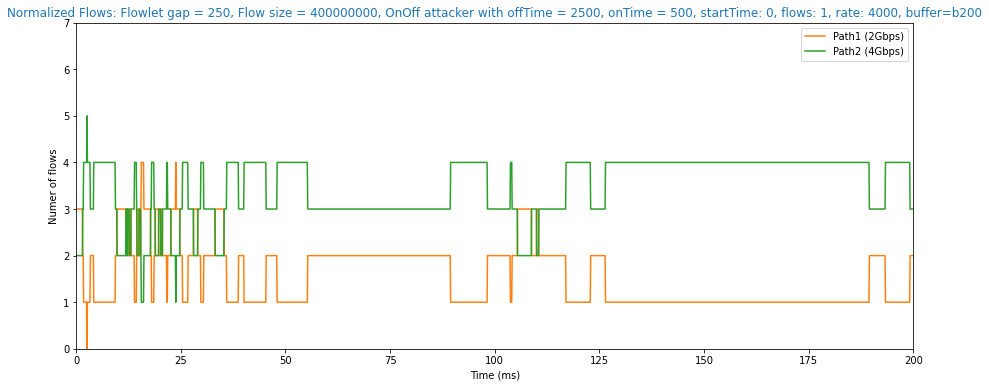

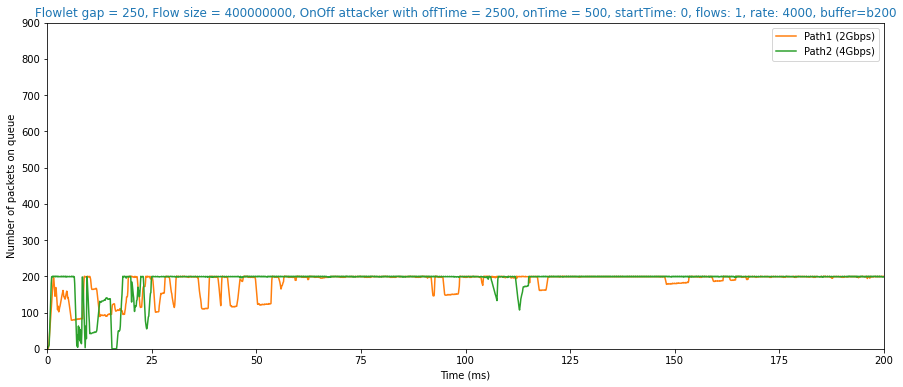

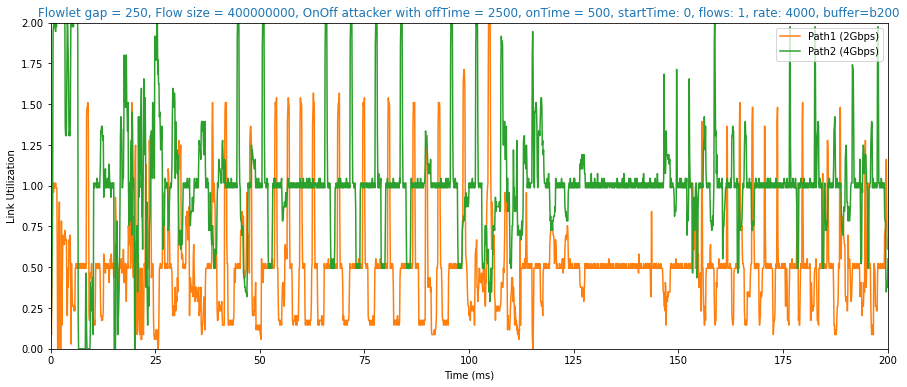

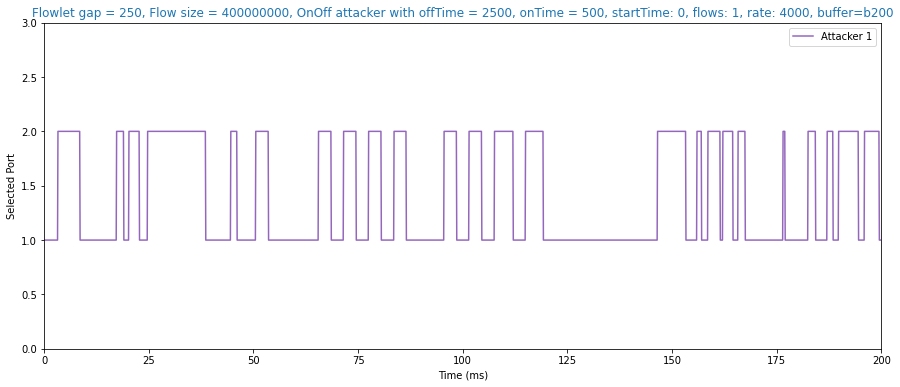

Sender Avg FCT: 2.4930
Avg FCT: 2.3691
Large Flows Avg FCT: 2.4928
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 1.1341


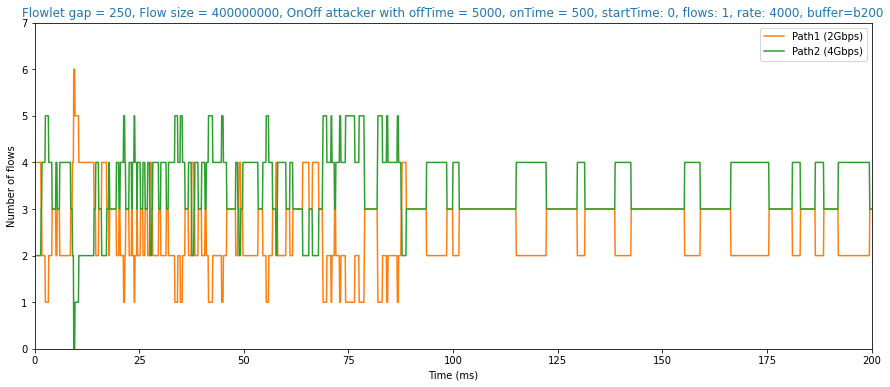

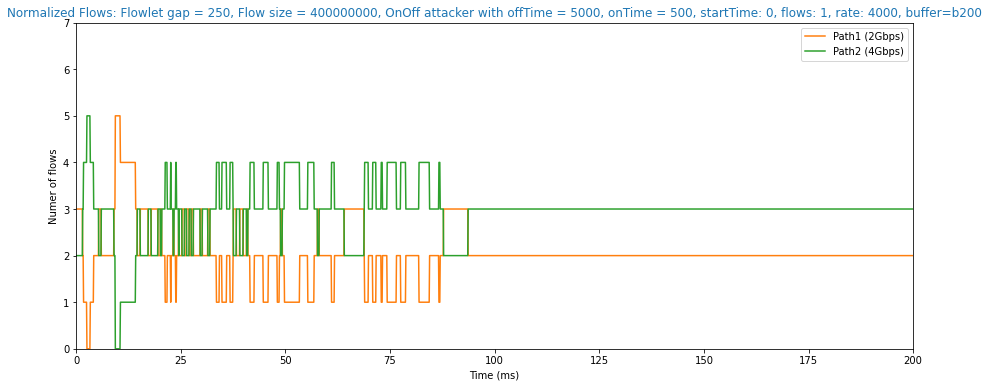

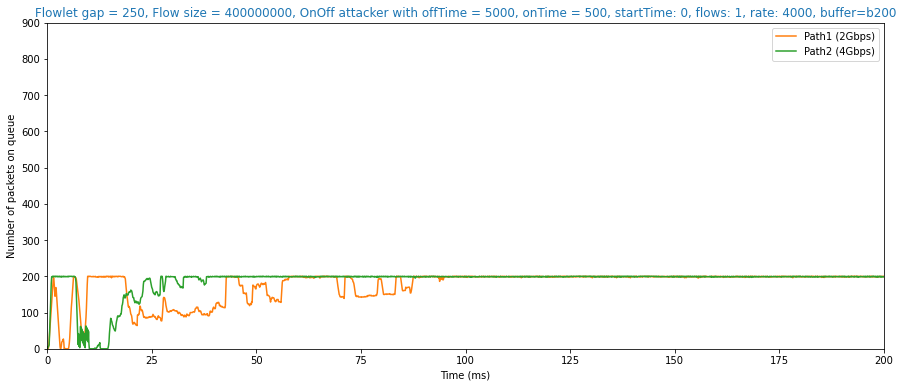

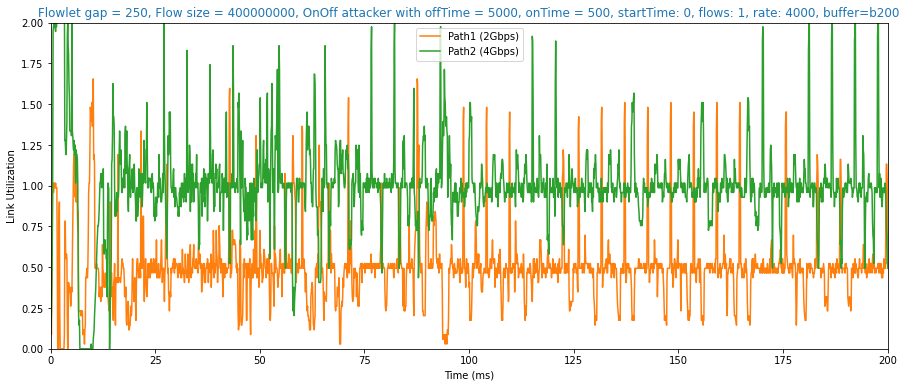

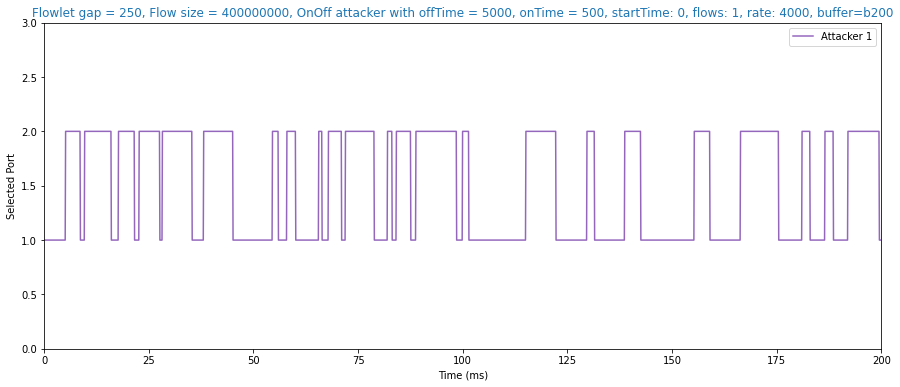

Sender Avg FCT: 2.4733
Avg FCT: 2.4395
Large Flows Avg FCT: 2.4729
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 2.1075


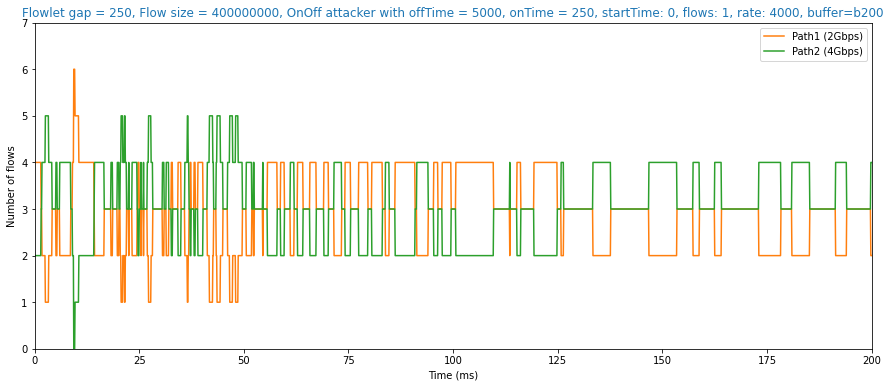

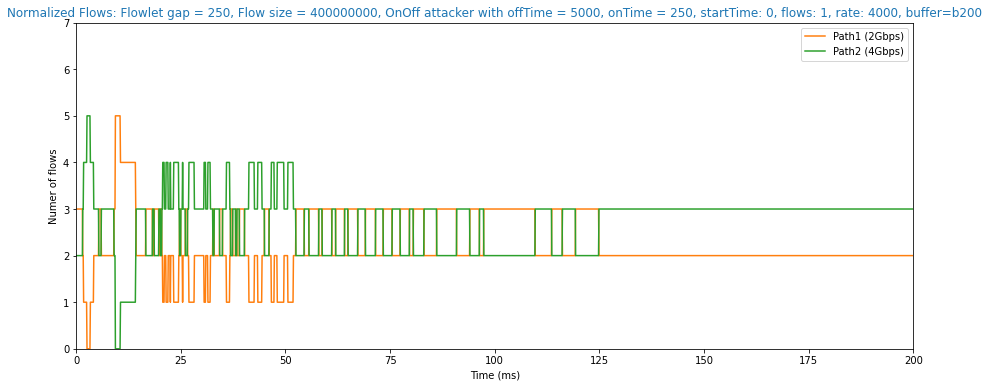

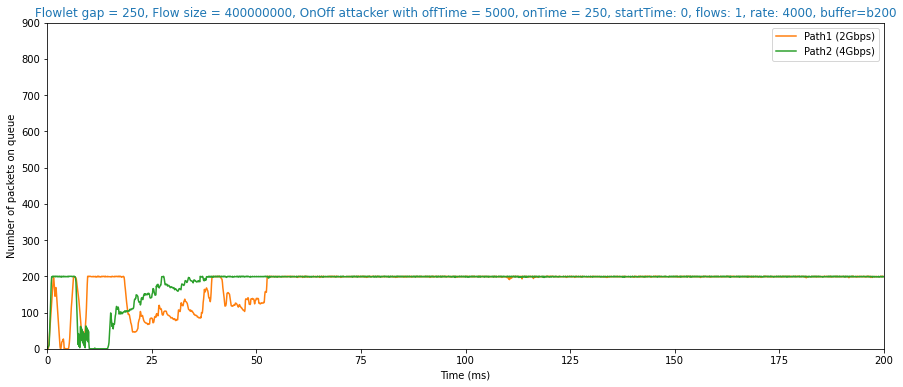

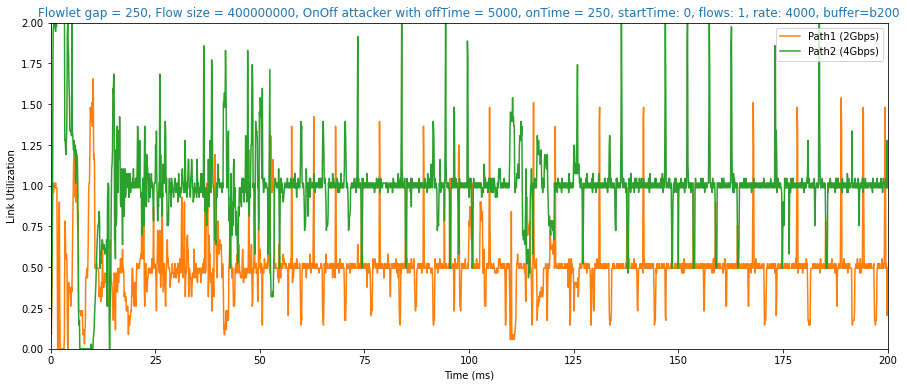

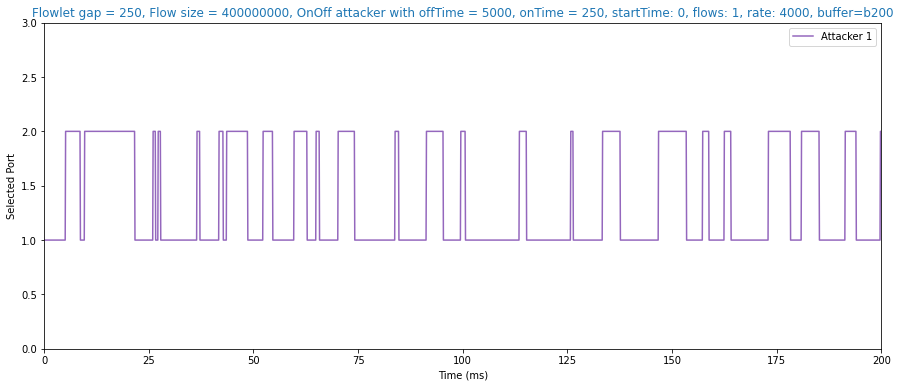

In [112]:
for i in sim26:
    plotSimulationRange(i,(0,200))

In [79]:
#Increased initial cwnd for attacker
# 2 servers, 250 flowlet gap, reduced link capacity.
import os 

directory = "/Users/gian/Documents/Madison/simulations/sim25"
os.chdir(directory)
sim25 = []
for filename in os.listdir(directory):
    if filename.endswith(".flow"):
        sim25.append(parseSimulationFiles(filename.split('.')[0]))
sim25.sort(key=worstSenderAvgFct)

Sender Avg FCT: 6.6793
Avg FCT: 5.4925
Large Flows Avg FCT: 6.6793
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 3.1189


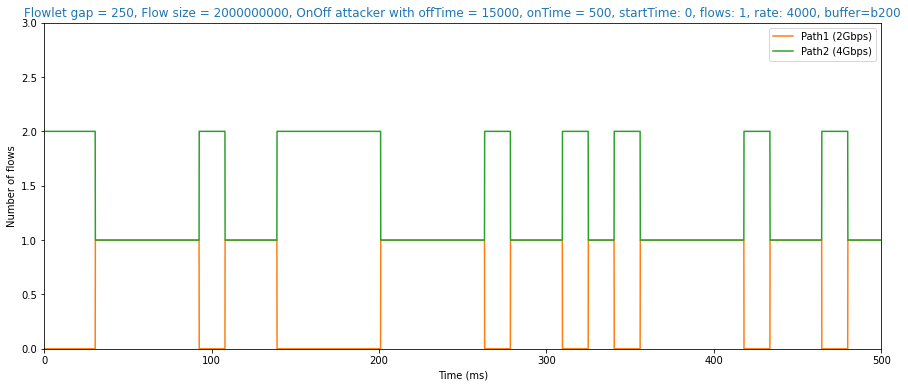

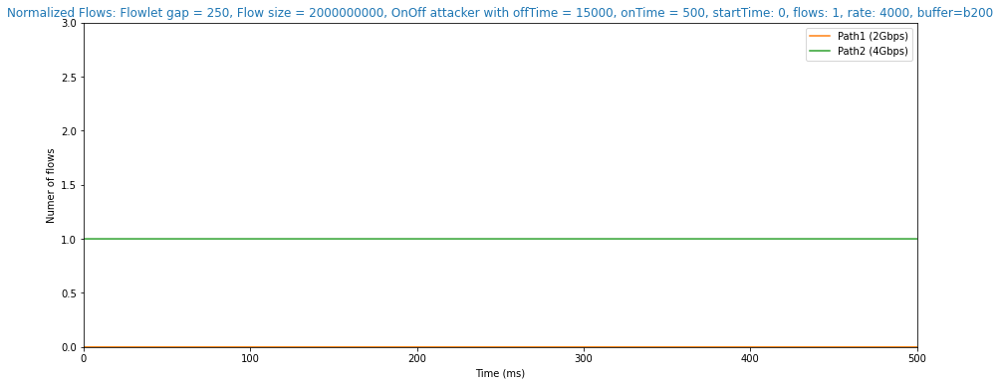

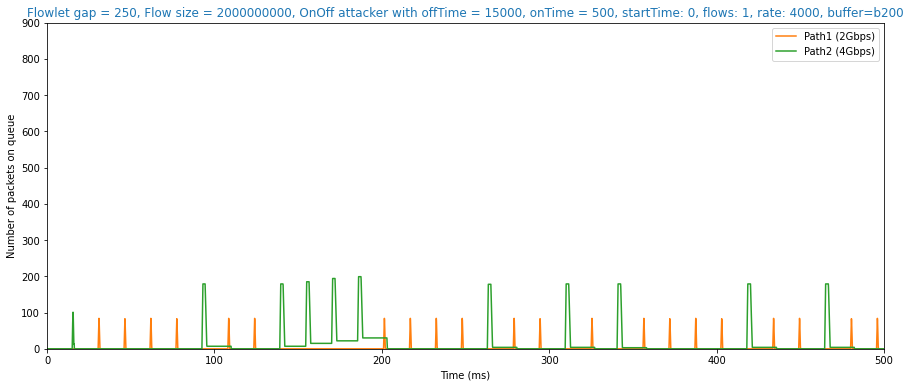

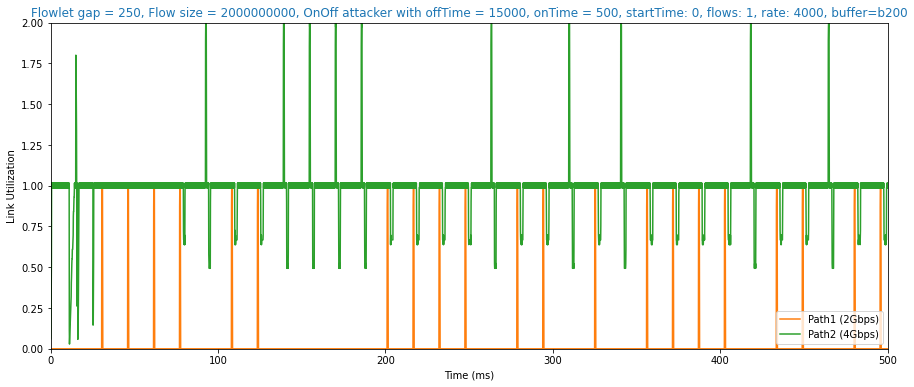

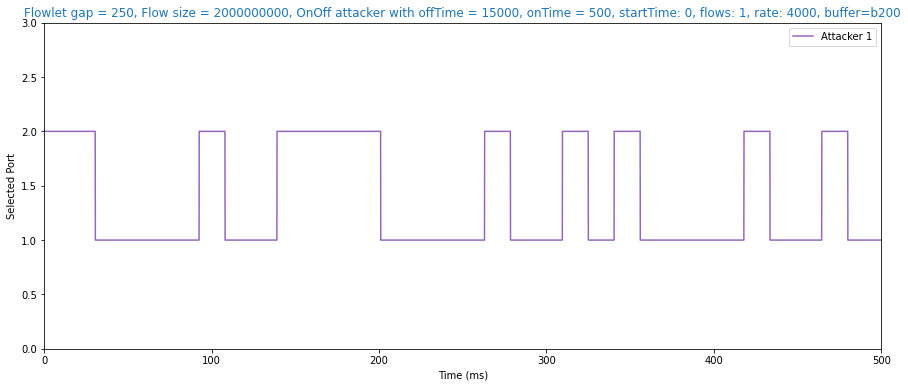

Sender Avg FCT: 4.2746
Avg FCT: 3.5524
Large Flows Avg FCT: 4.2745
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 2.1116


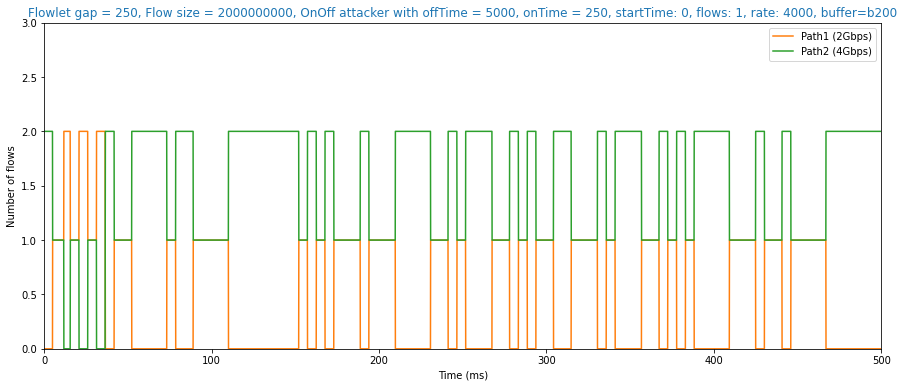

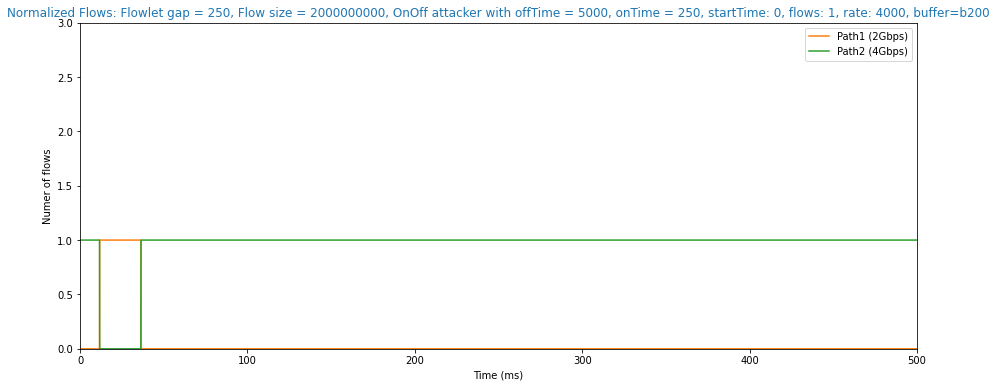

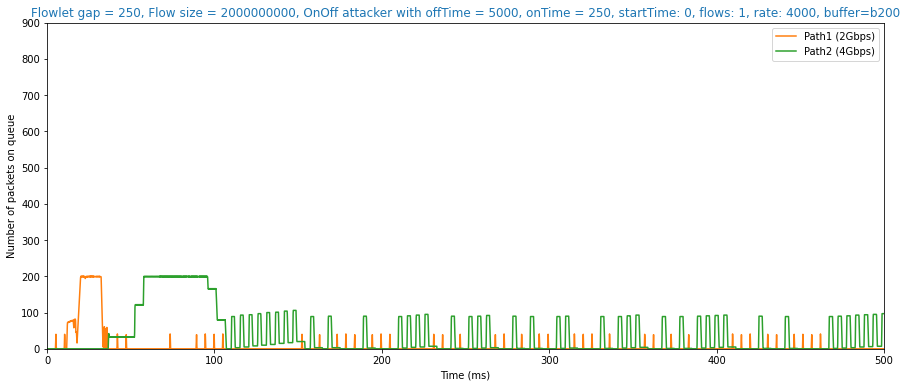

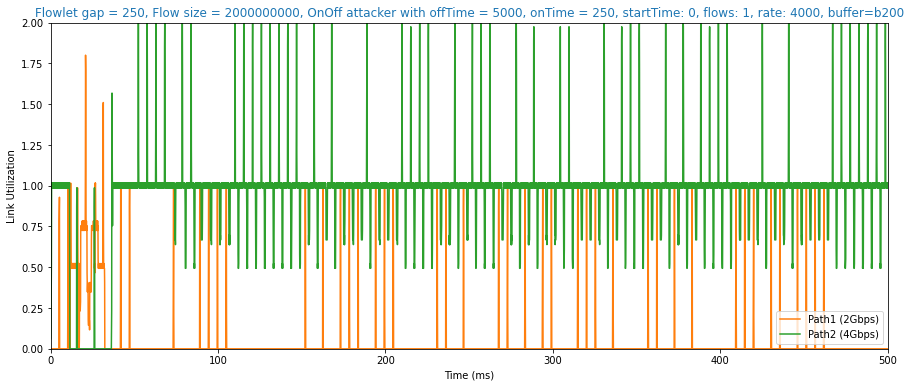

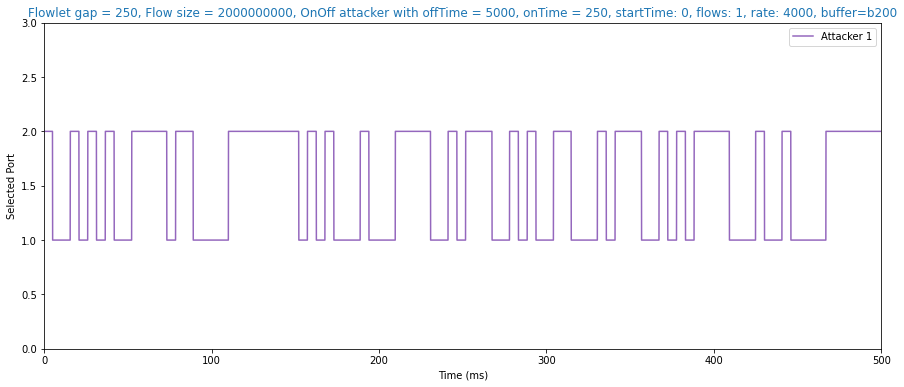

Sender Avg FCT: 4.2746
Avg FCT: 3.7187
Large Flows Avg FCT: 4.2745
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 2.6093


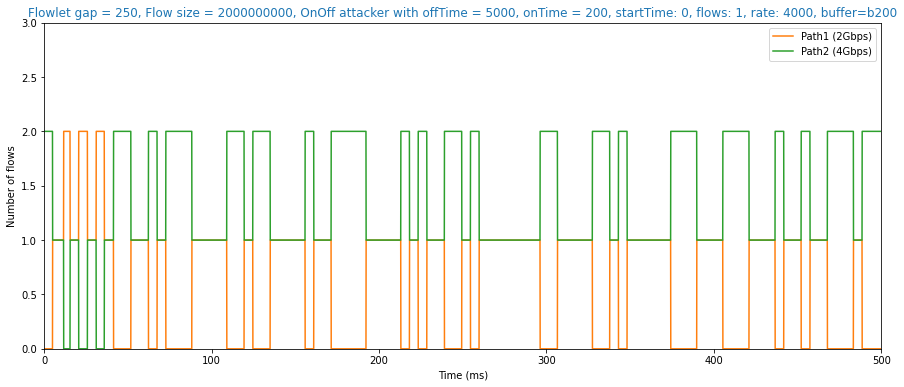

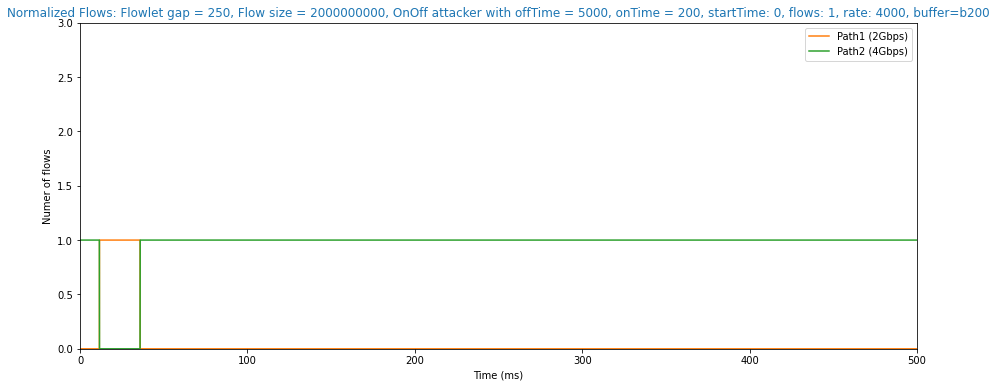

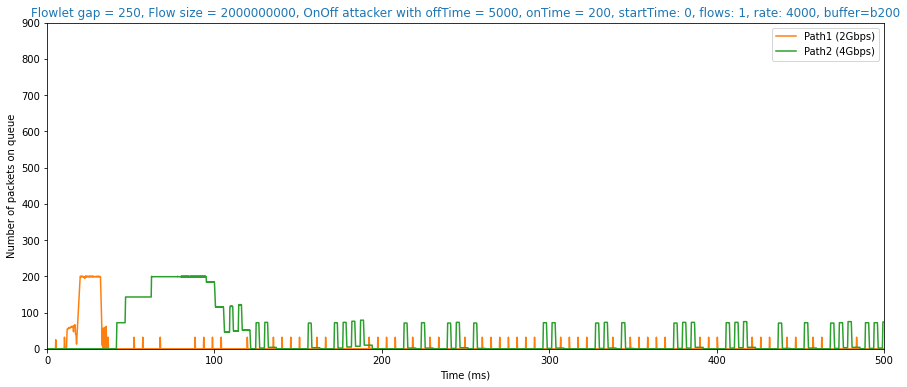

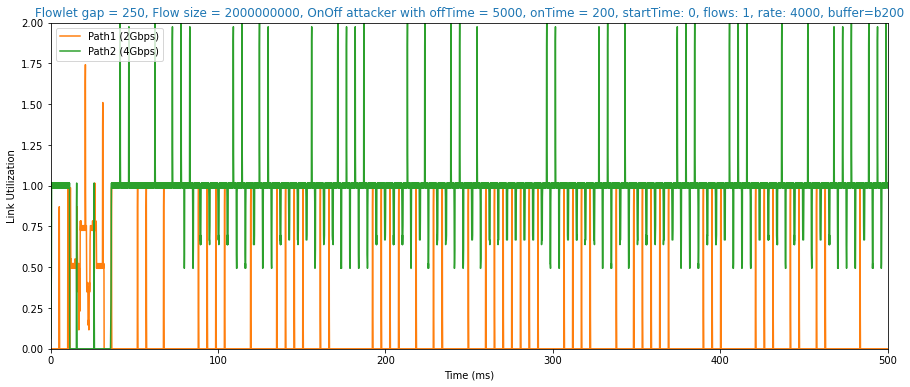

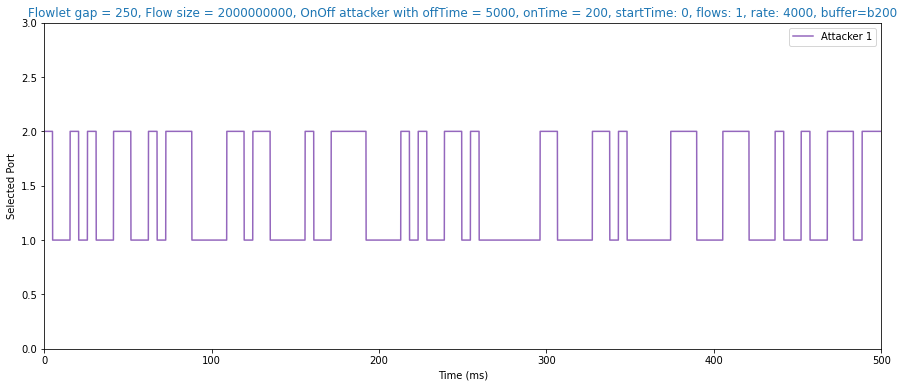

Sender Avg FCT: 4.2633
Avg FCT: 2.9315
Large Flows Avg FCT: 4.2632
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 0.2701


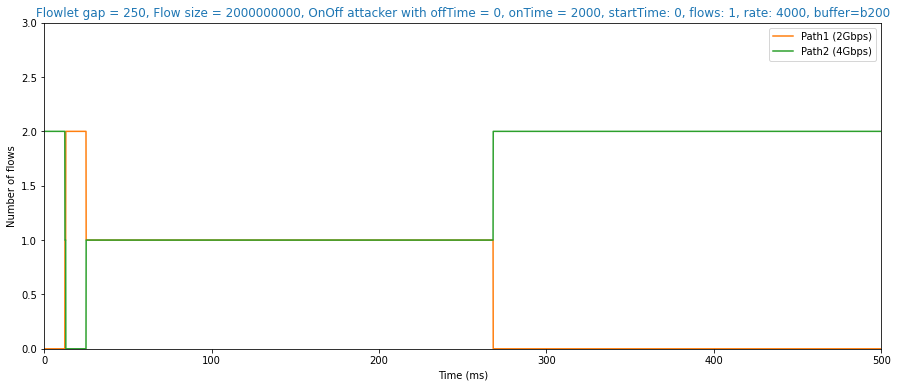

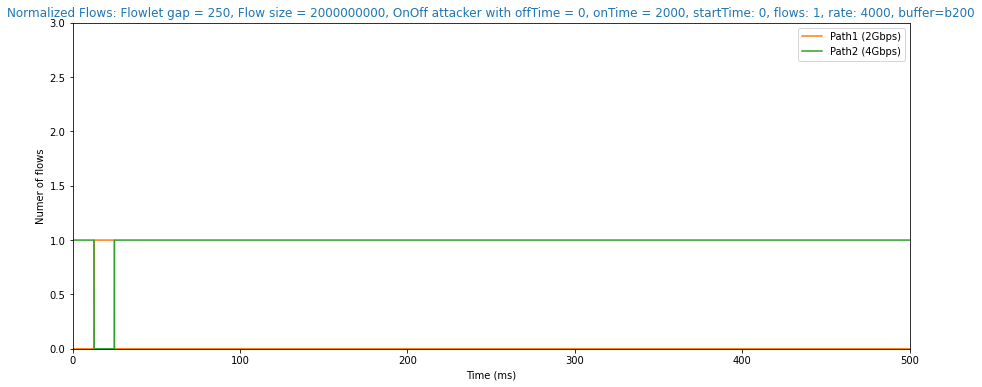

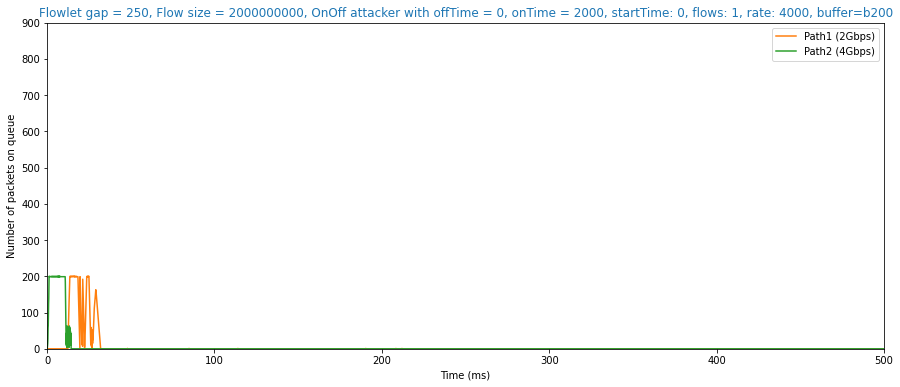

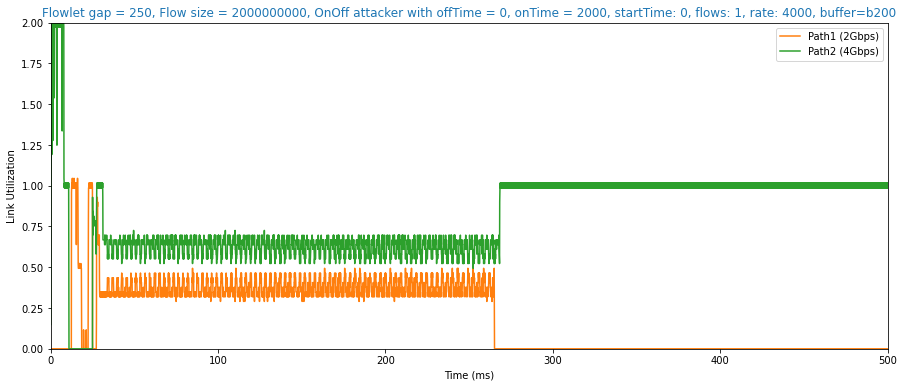

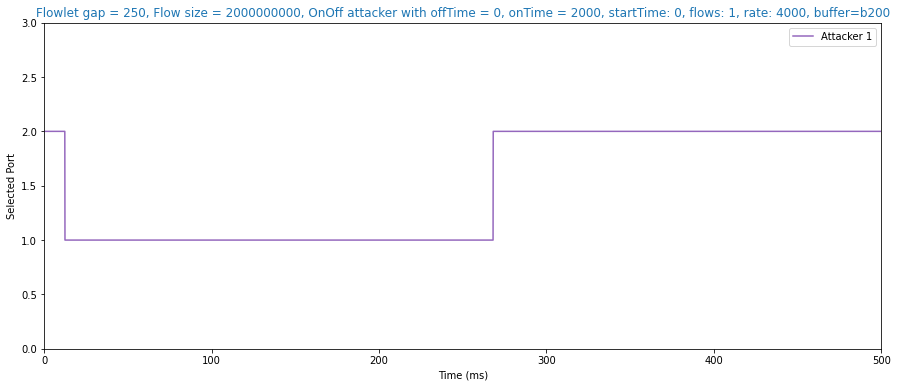

In [111]:
for i in sim25:
    plotSimulationRange(i,(0,500))

In [317]:
#Increased initial cwnd for attacker
import os 

directory = "/Users/gian/Documents/Madison/simulations/sim24"
os.chdir(directory)
files = []
for filename in os.listdir(directory):
    if filename.endswith(".flow"):
        files.append(parseSimulationFiles(filename.split('.')[0]))
files.sort(key=worstSenderAvgFct)

Sender Avg FCT: 7.3961
Avg FCT: 7.2792
Large Flows Avg FCT: 7.2792
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 6.3525


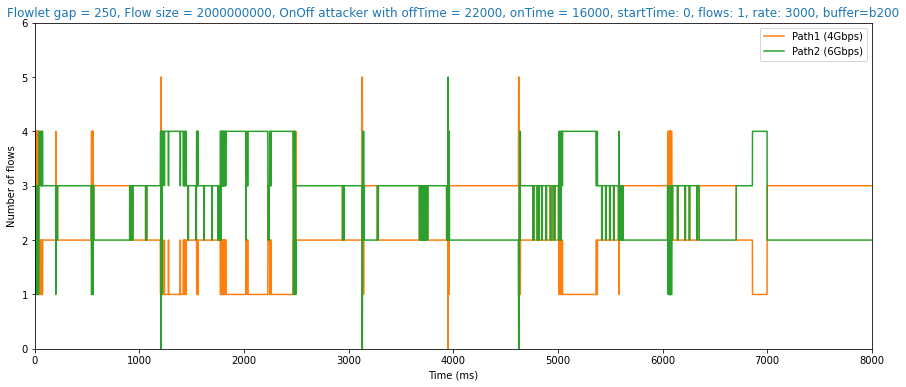

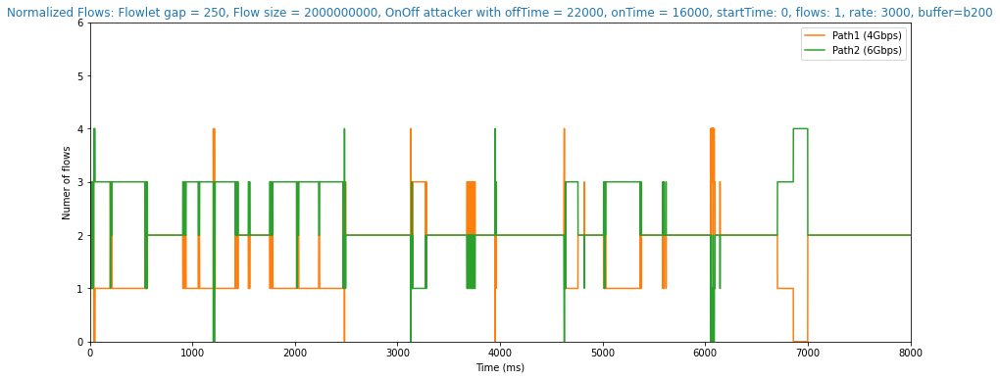

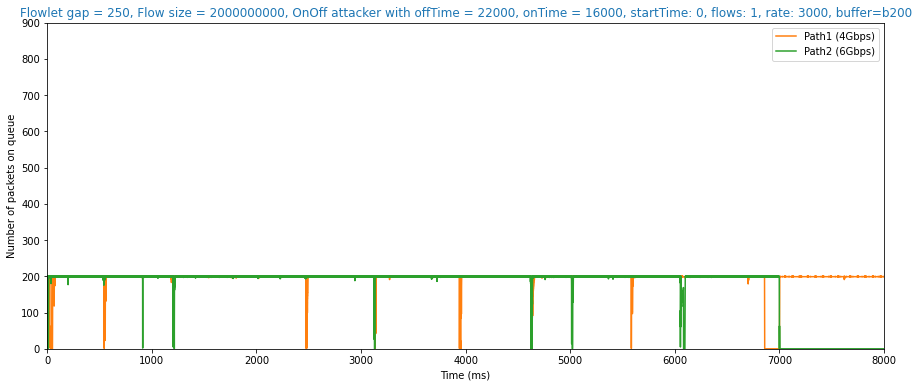

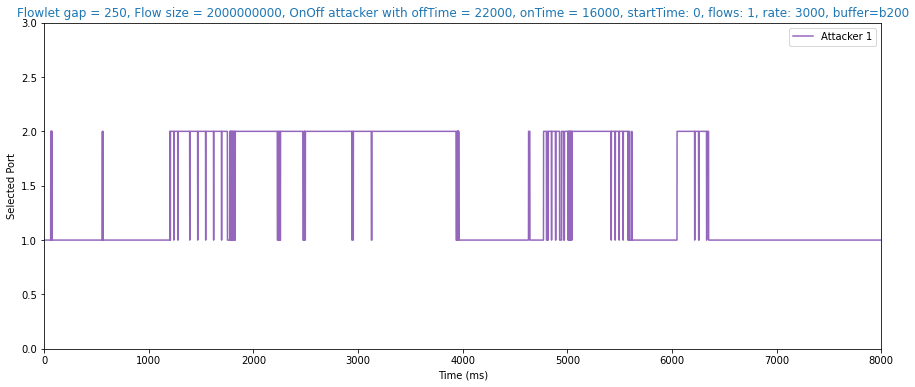

Sender Avg FCT: 7.3534
Avg FCT: 7.1276
Large Flows Avg FCT: 7.1276
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 5.3279


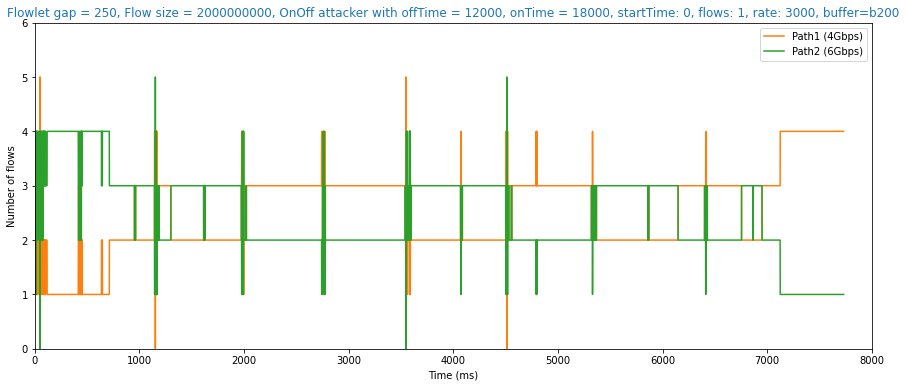

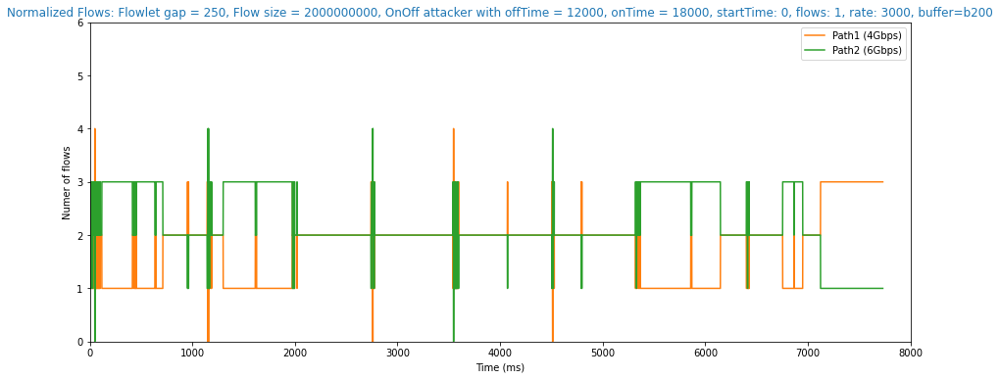

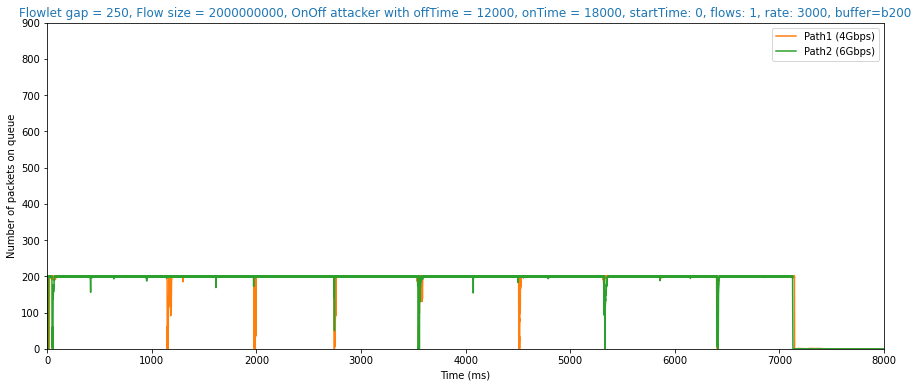

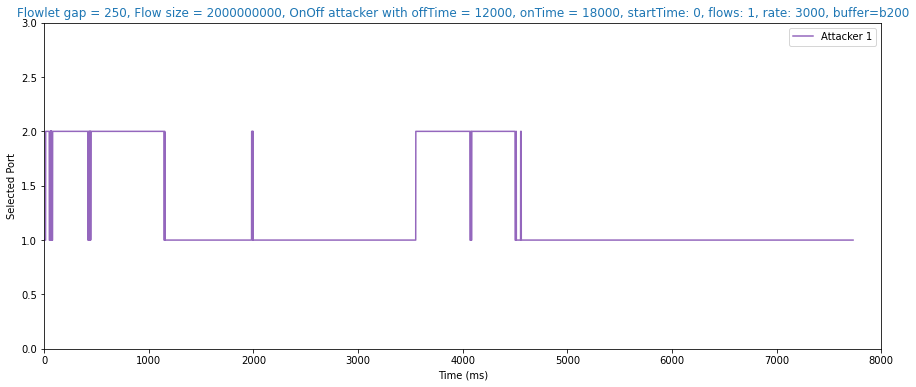

Sender Avg FCT: 7.2850
Avg FCT: 7.1395
Large Flows Avg FCT: 7.1395
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 5.9805


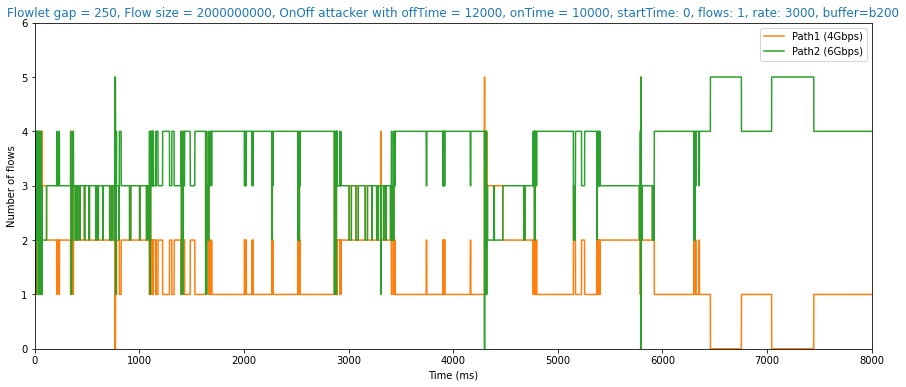

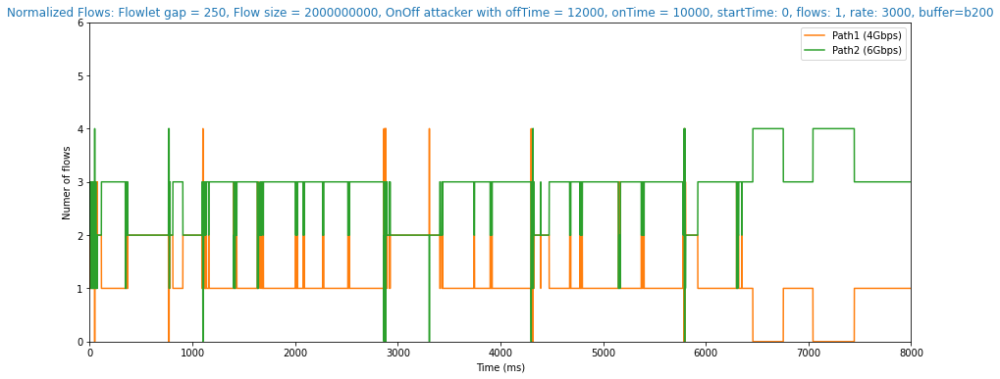

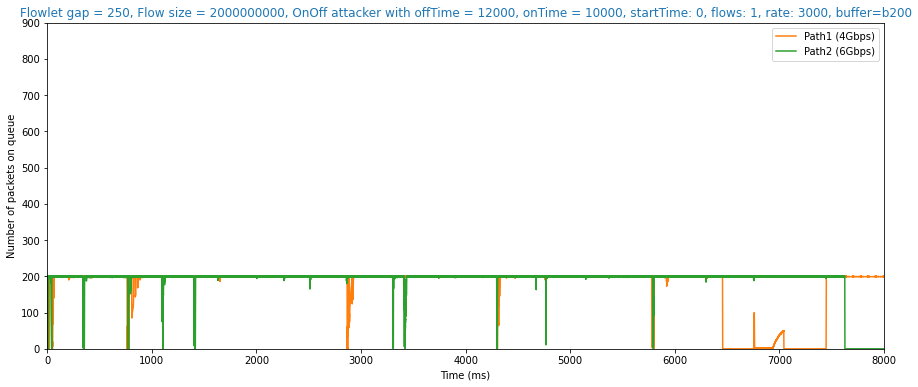

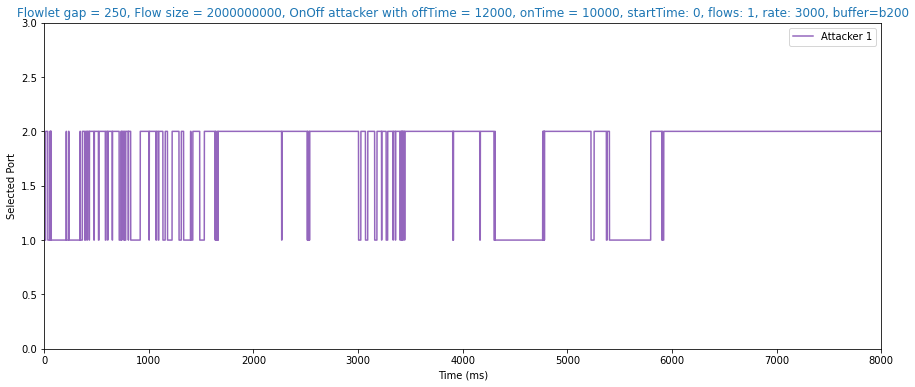

Sender Avg FCT: 7.1739
Avg FCT: 6.8615
Large Flows Avg FCT: 6.8615
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 4.3687


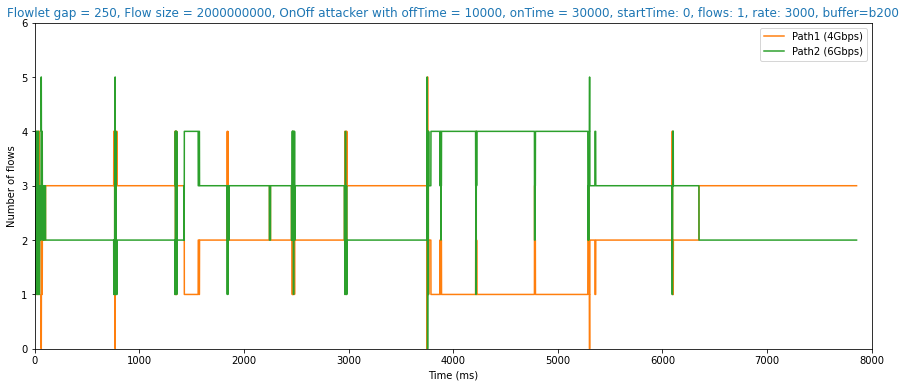

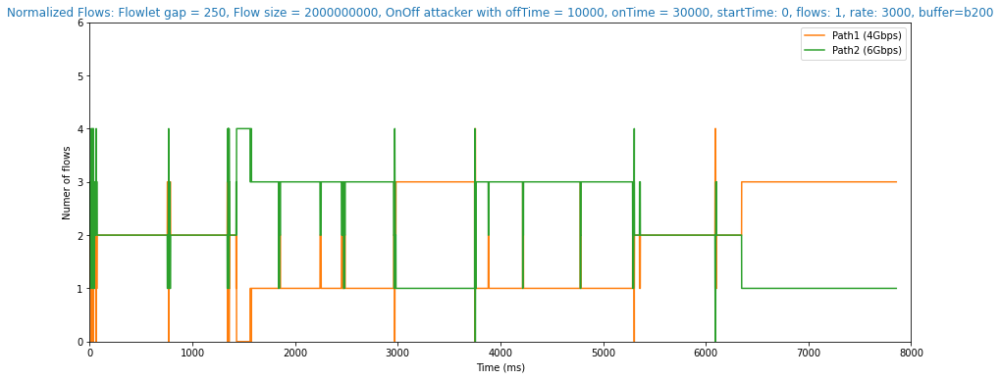

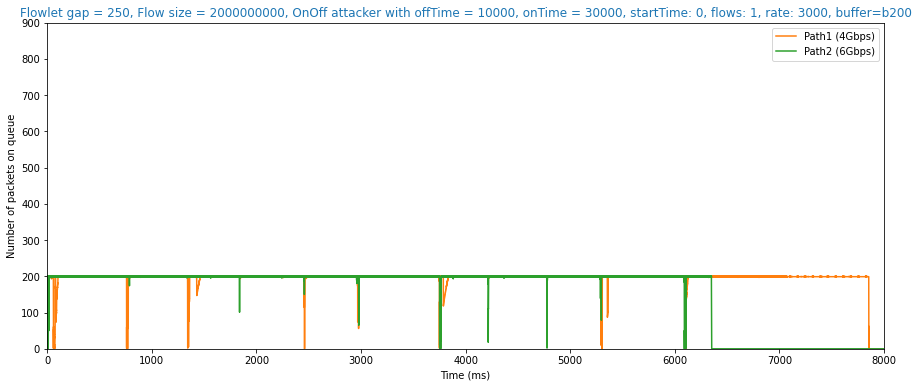

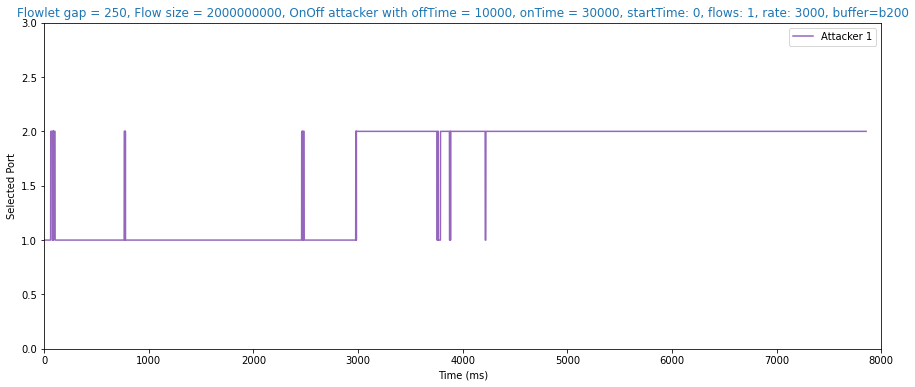

Sender Avg FCT: 7.0061
Avg FCT: 6.5959
Large Flows Avg FCT: 6.5959
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 3.3224


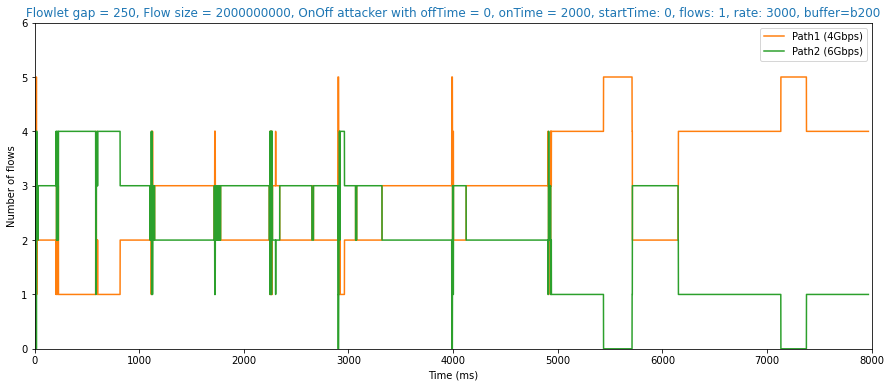

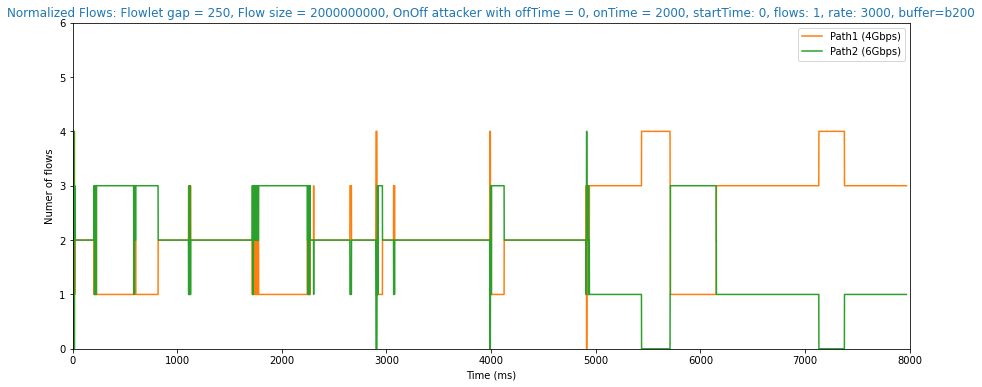

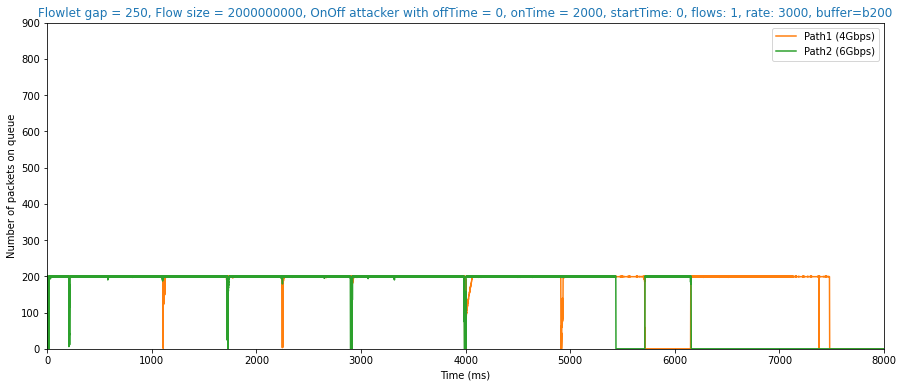

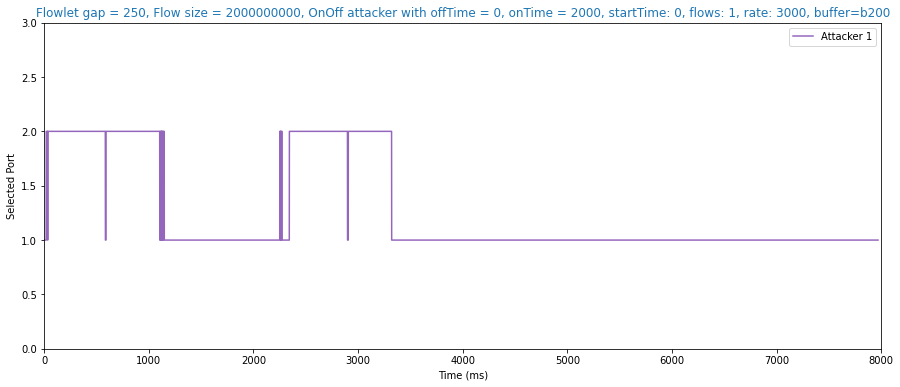

Sender Avg FCT: 6.9723
Avg FCT: 6.8651
Large Flows Avg FCT: 6.8651
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 6.0126


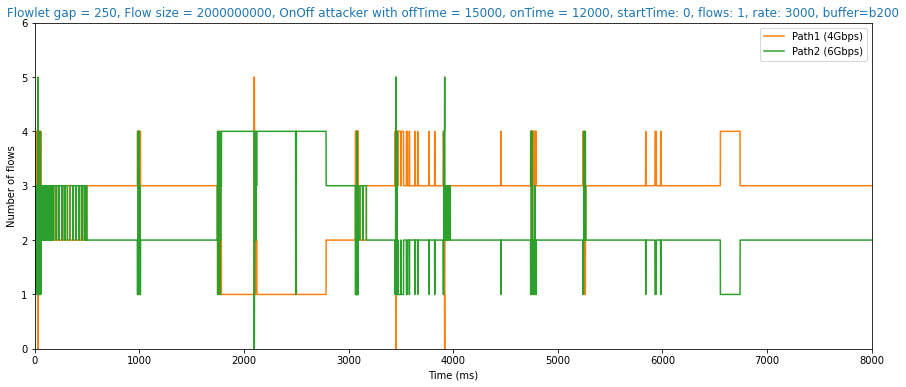

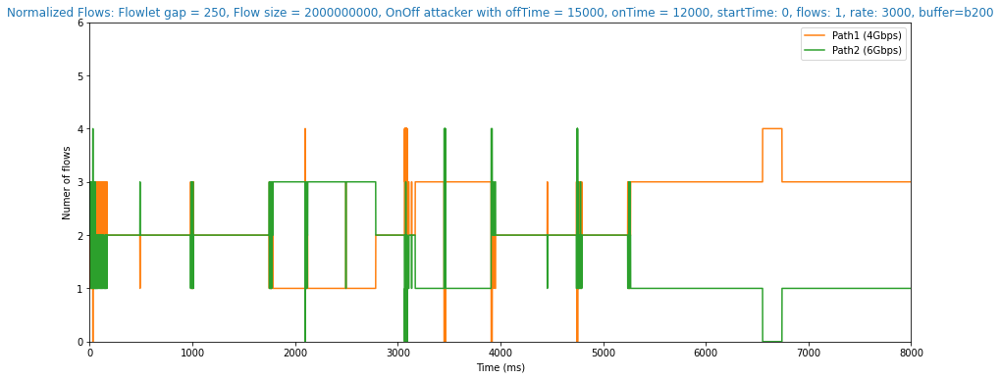

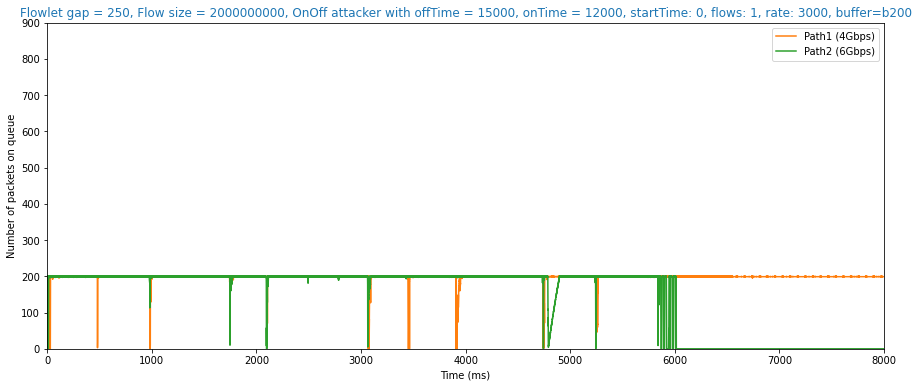

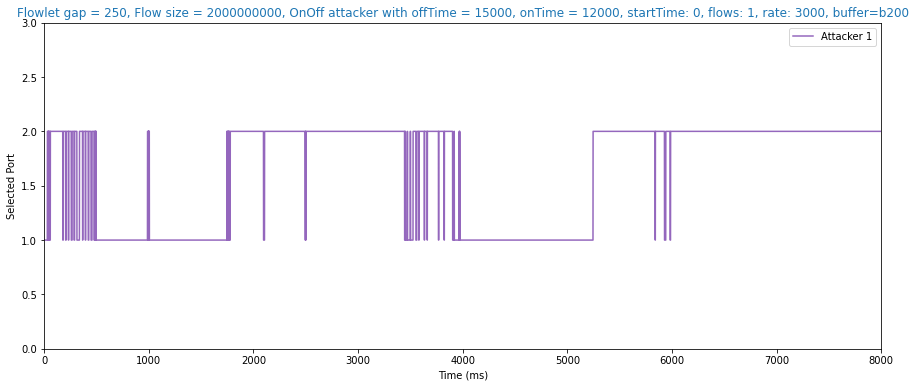

In [318]:
for i in files:
    plotSimulationRange(i,(0,8000))

In [94]:
#Increased initial cwnd for attacker
import os 

directory = "/Users/gian/Documents/Madison/simulations/sim22"
os.chdir(directory)
sim22 = []
for filename in os.listdir(directory):
    if filename.endswith(".flow"):
        sim22.append(parseSimulationFiles(filename.split('.')[0]))
sim22.sort(key=worstSenderAvgFct)

Sender Avg FCT: 5.6460
Avg FCT: 5.0818
Large Flows Avg FCT: 5.0818
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 3.9535


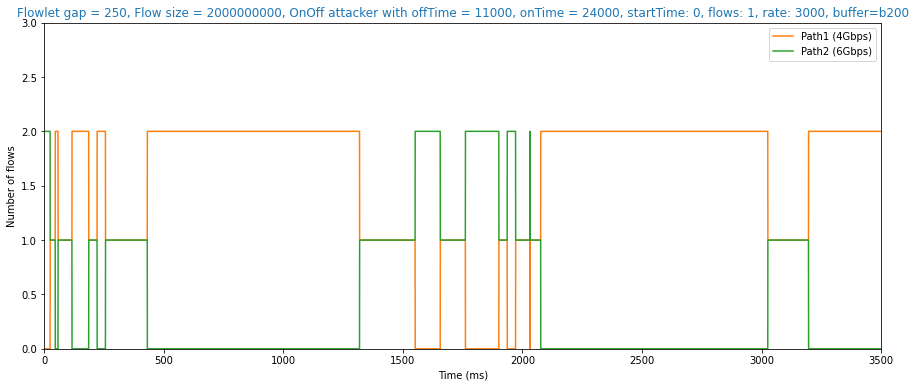

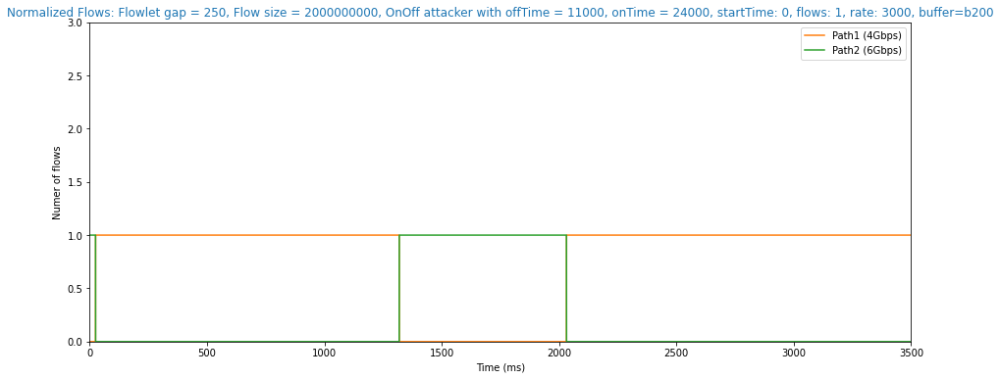

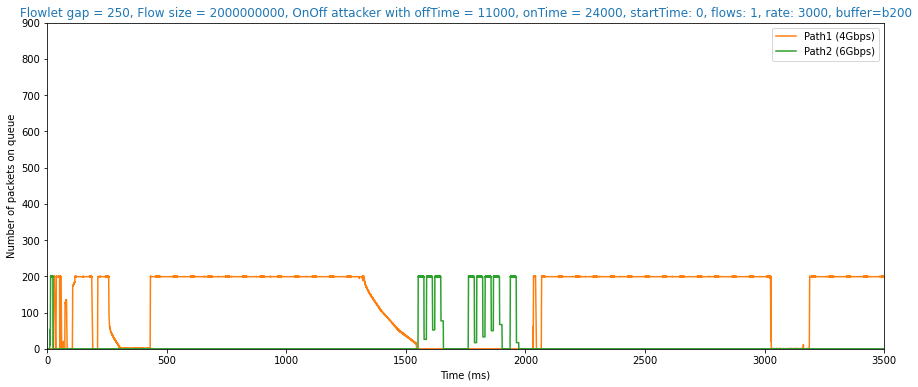

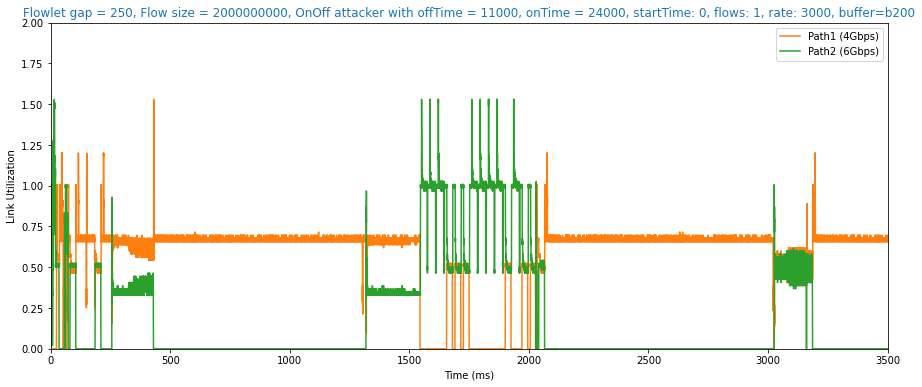

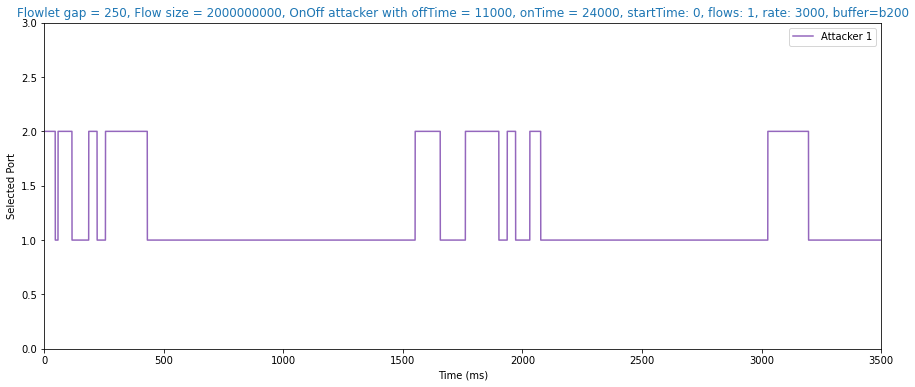

Sender Avg FCT: 5.3191
Avg FCT: 4.8323
Large Flows Avg FCT: 4.8323
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 3.8597


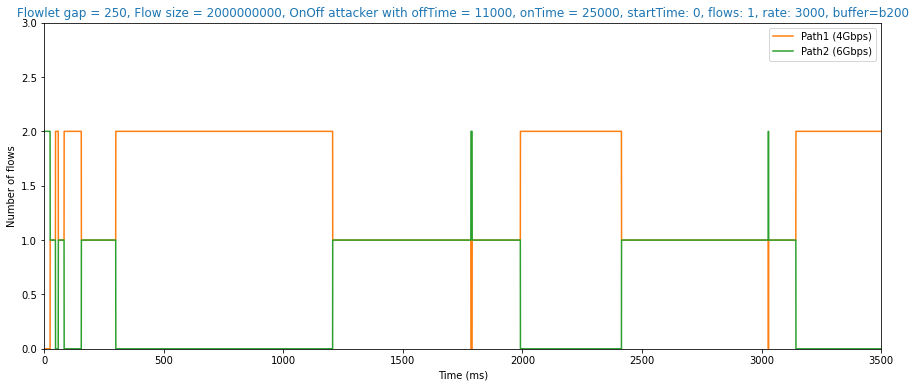

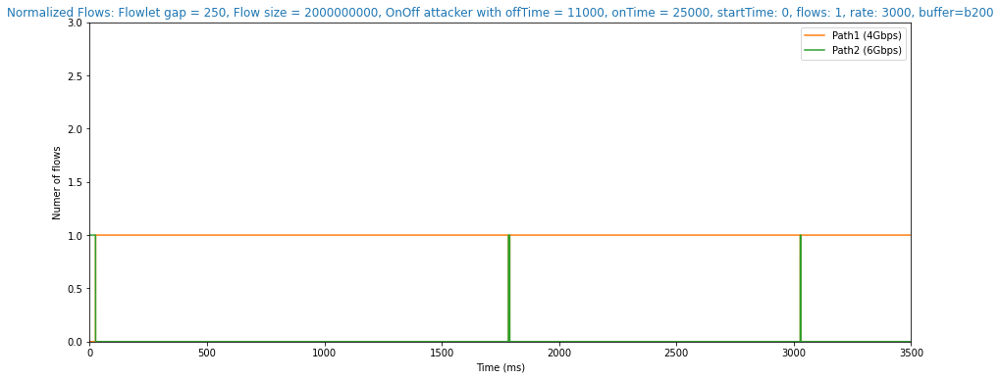

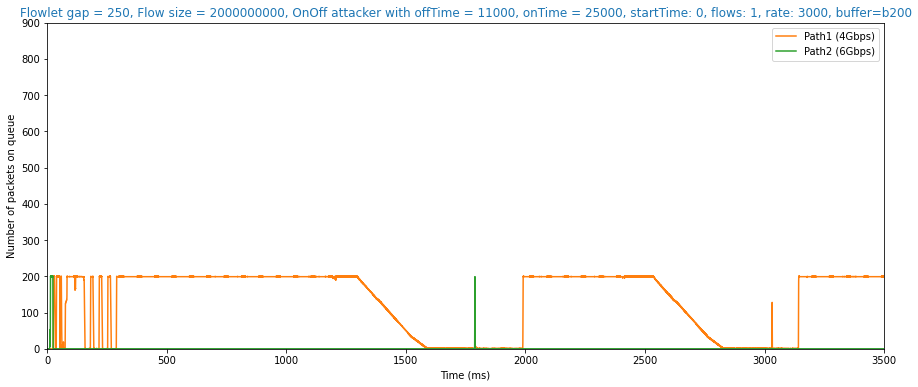

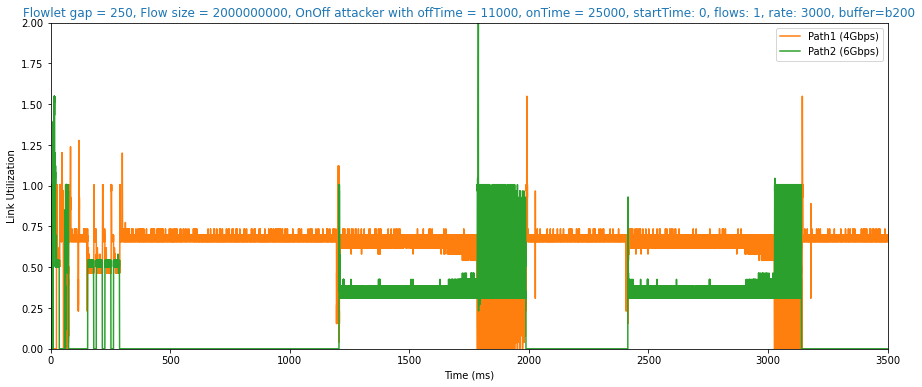

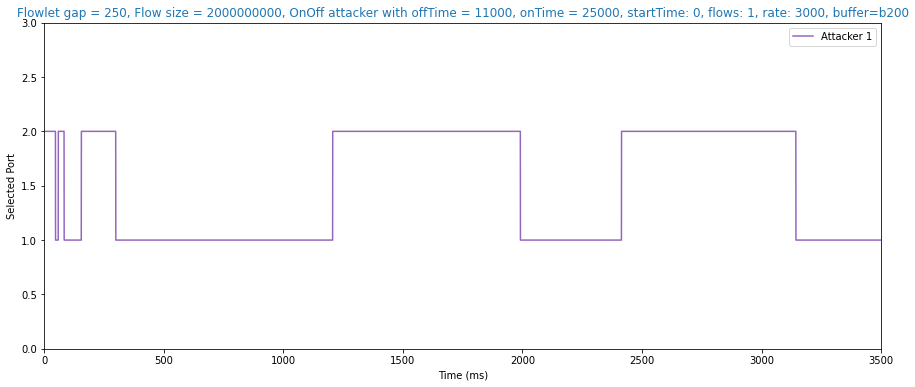

Sender Avg FCT: 5.0492
Avg FCT: 4.7343
Large Flows Avg FCT: 4.7343
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 4.1047


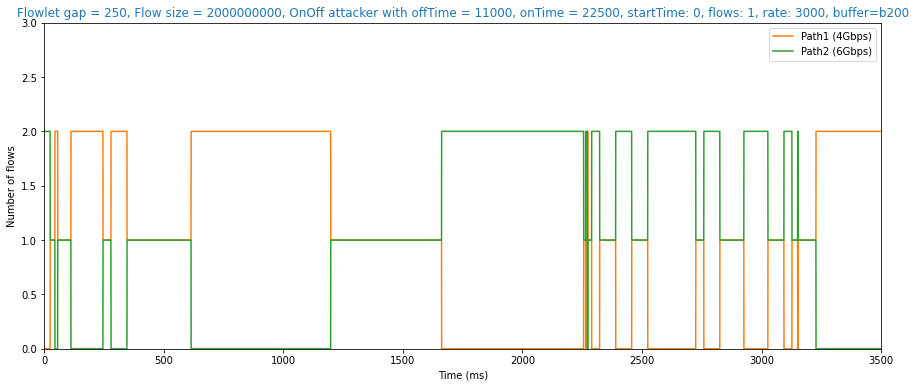

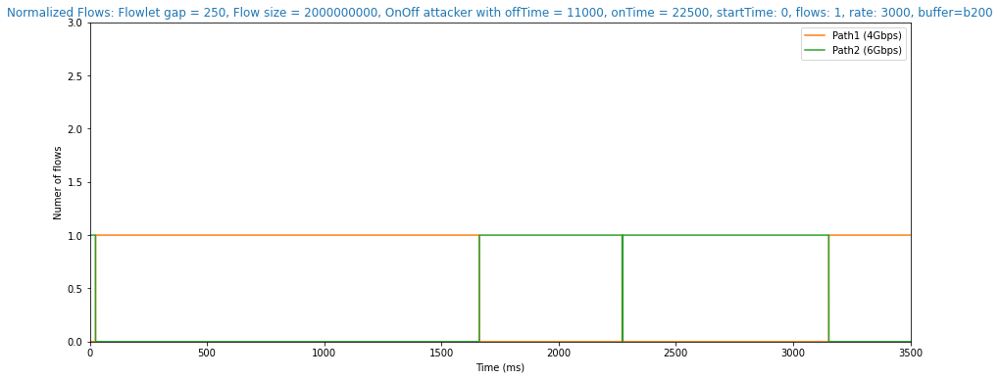

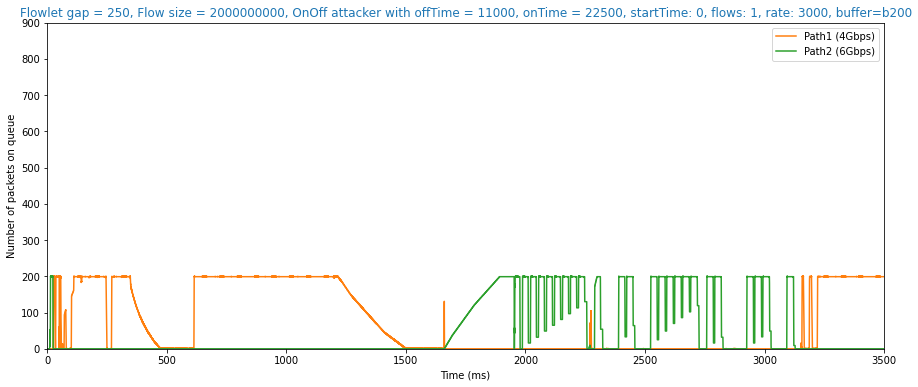

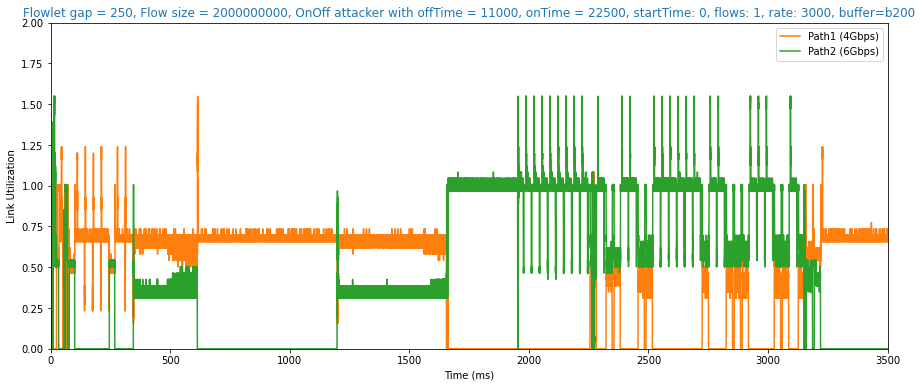

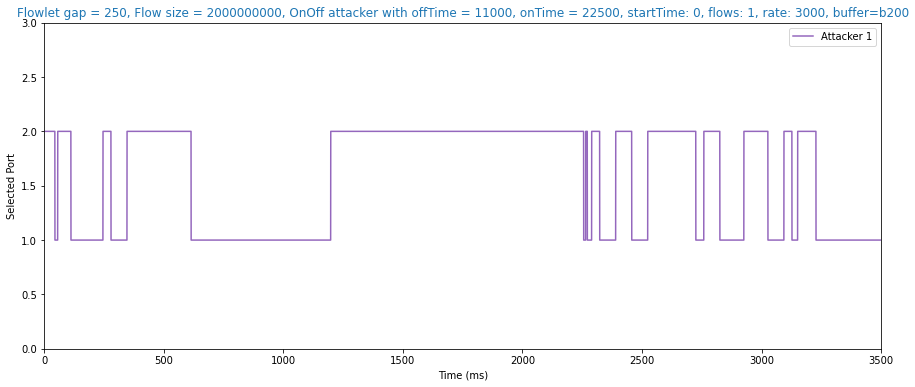

Sender Avg FCT: 5.0200
Avg FCT: 4.6977
Large Flows Avg FCT: 4.6977
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 4.0548


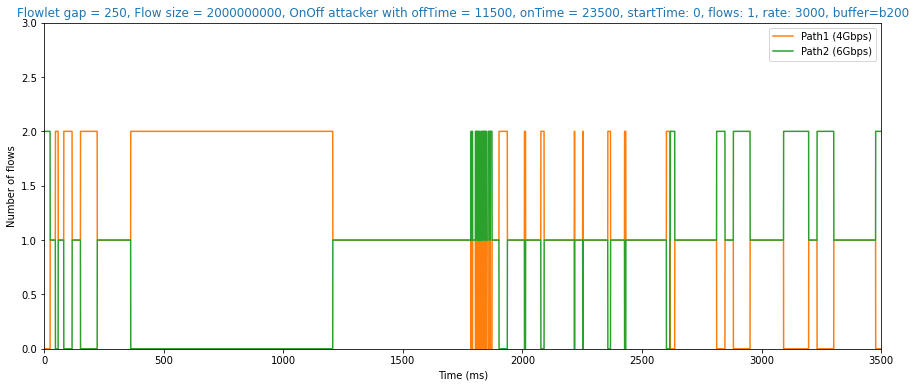

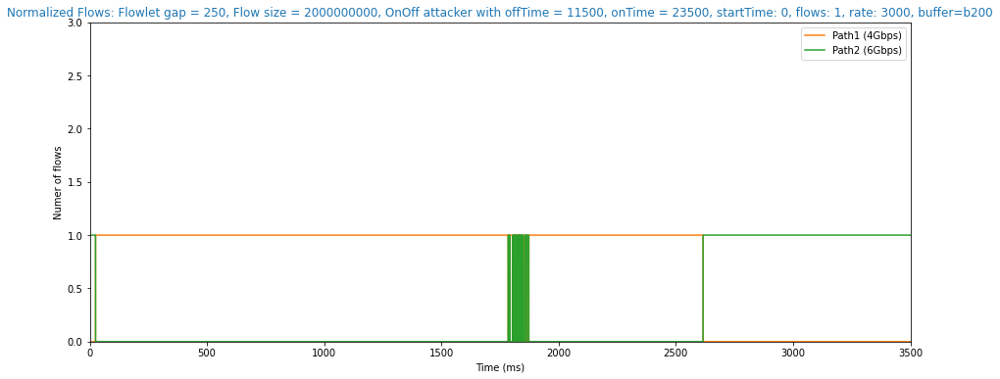

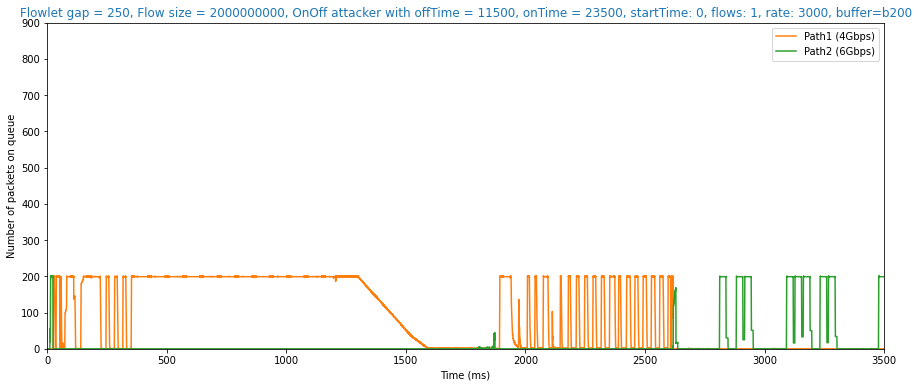

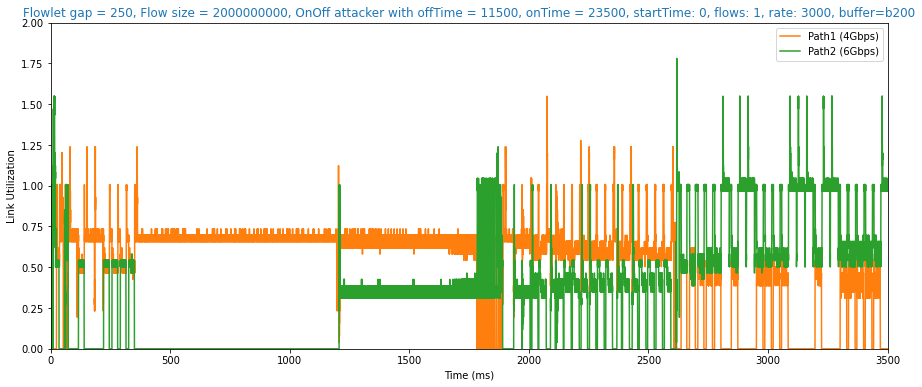

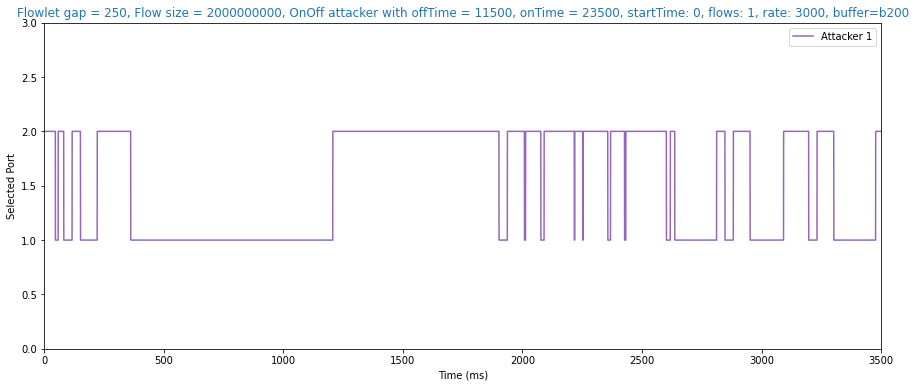

Sender Avg FCT: 4.9825
Avg FCT: 4.5886
Large Flows Avg FCT: 4.5886
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 3.8023


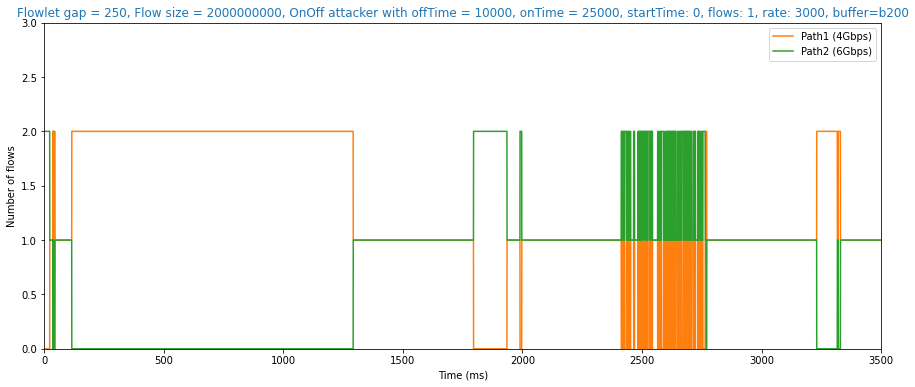

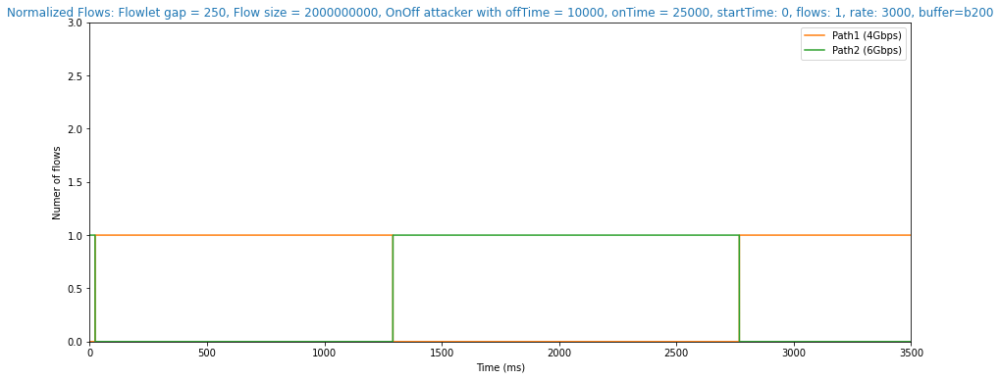

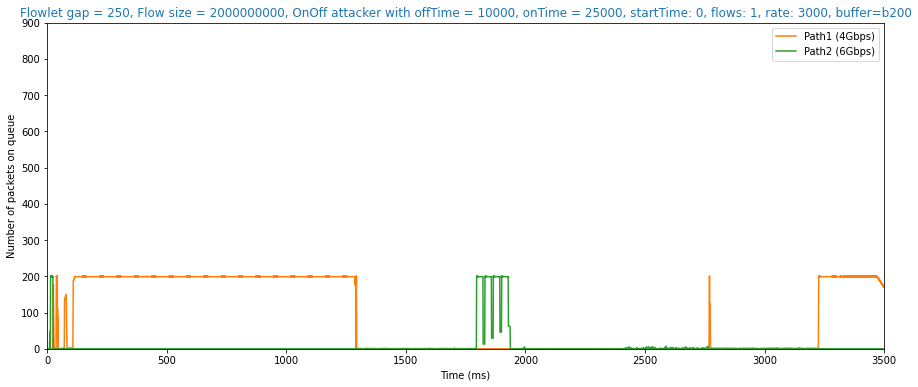

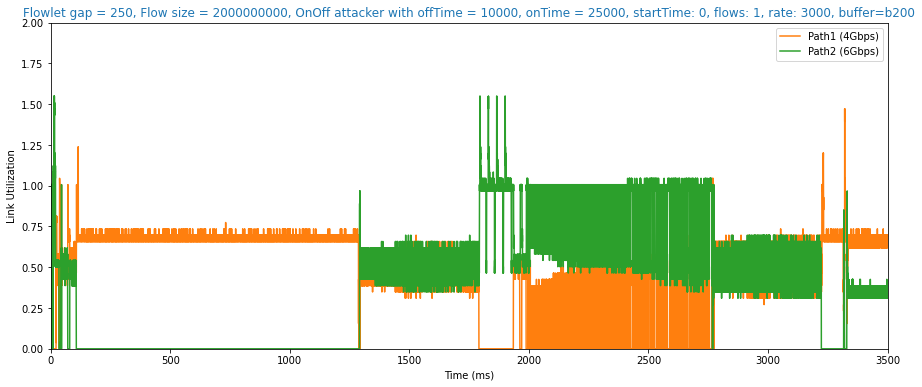

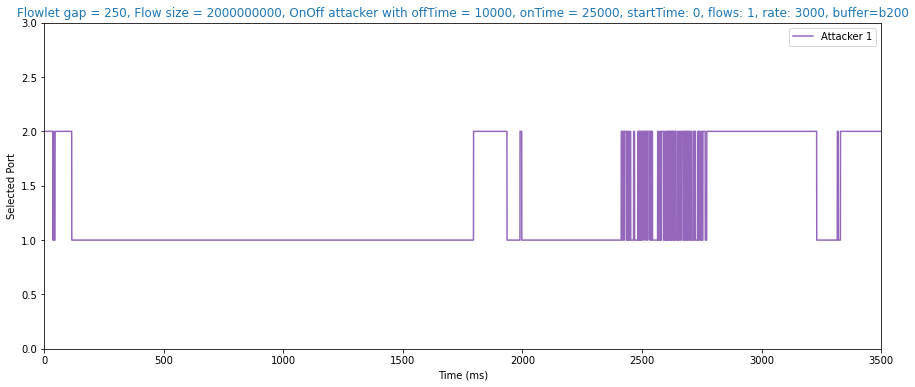

Sender Avg FCT: 4.8760
Avg FCT: 4.4467
Large Flows Avg FCT: 4.4467
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 3.5882


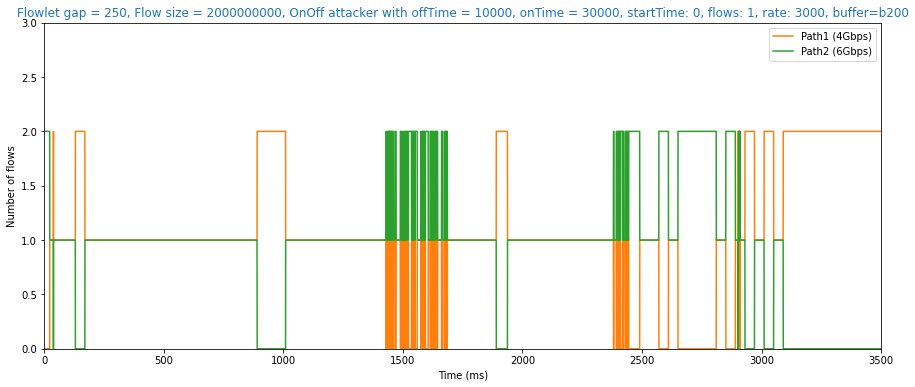

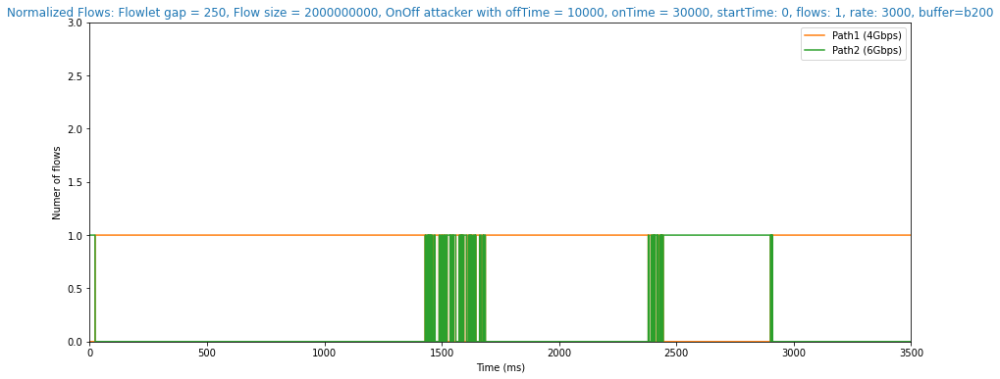

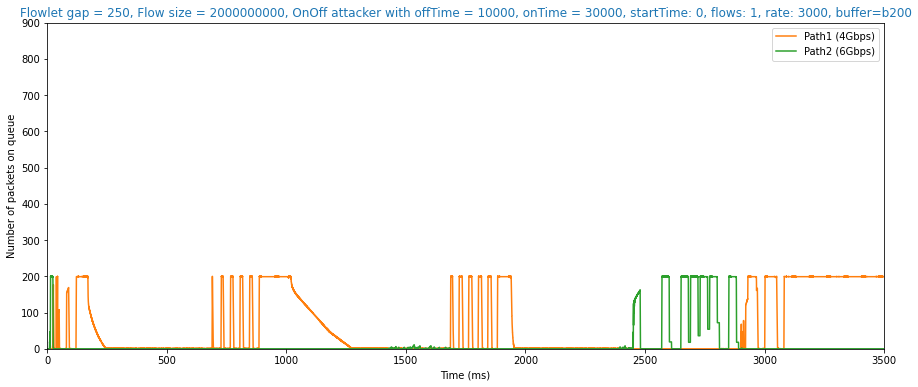

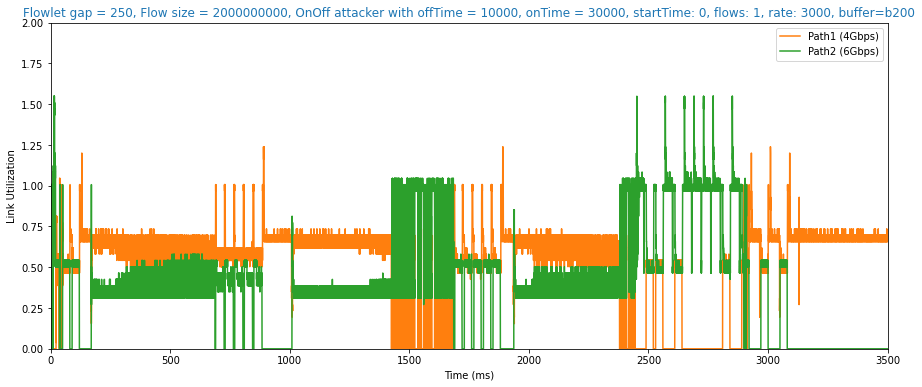

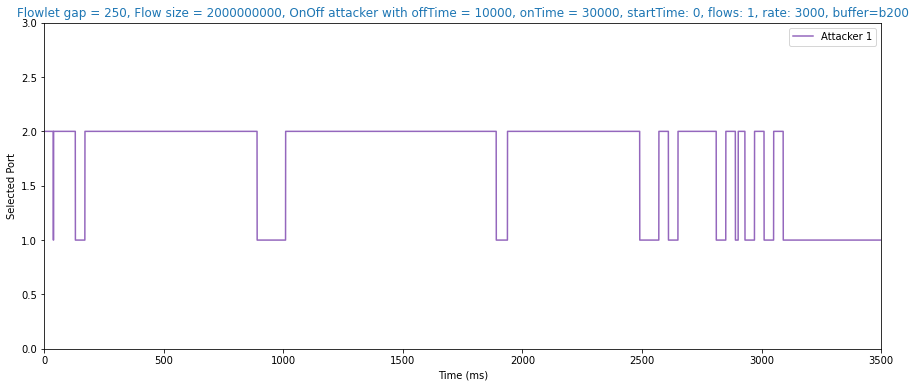

Sender Avg FCT: 4.7991
Avg FCT: 4.5150
Large Flows Avg FCT: 4.5150
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 3.9476


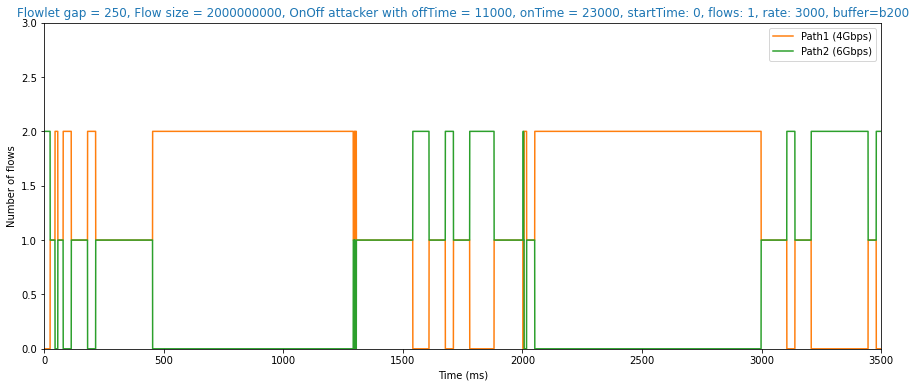

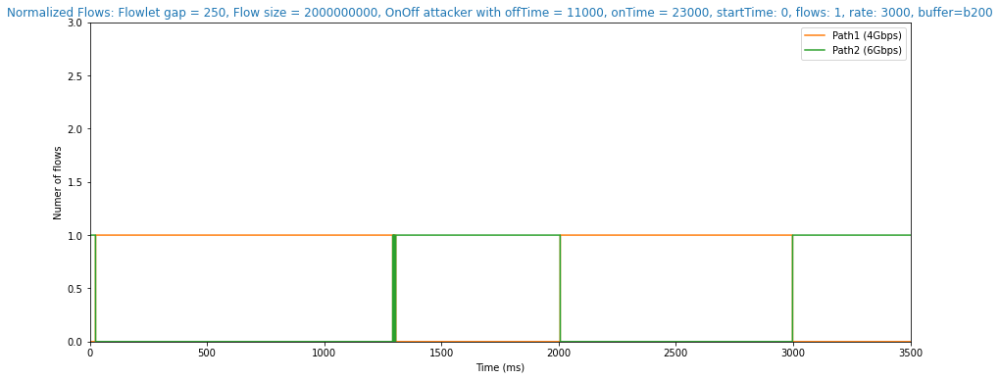

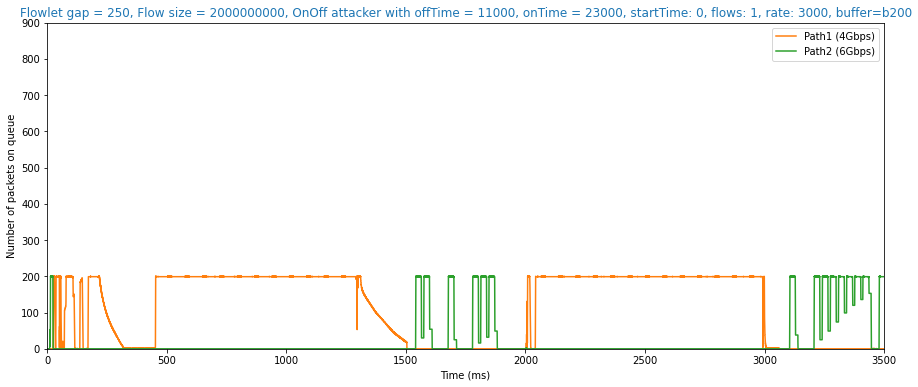

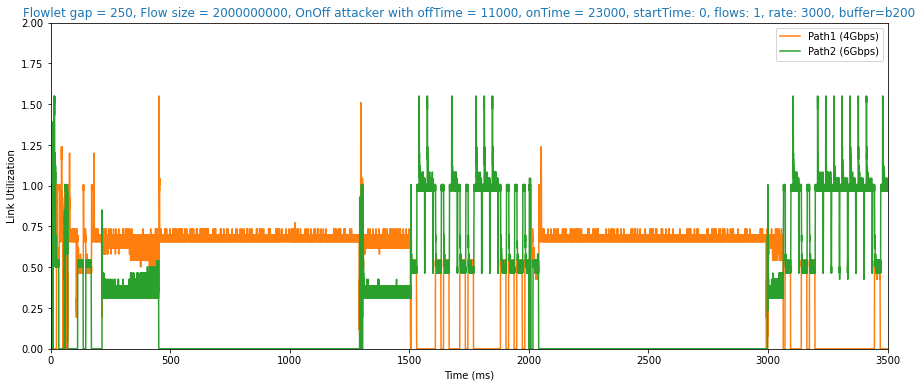

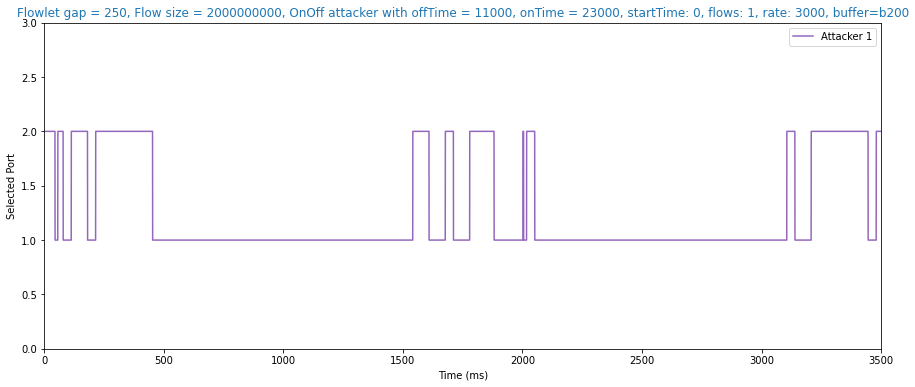

Sender Avg FCT: 4.7543
Avg FCT: 4.5379
Large Flows Avg FCT: 4.5379
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 4.1068


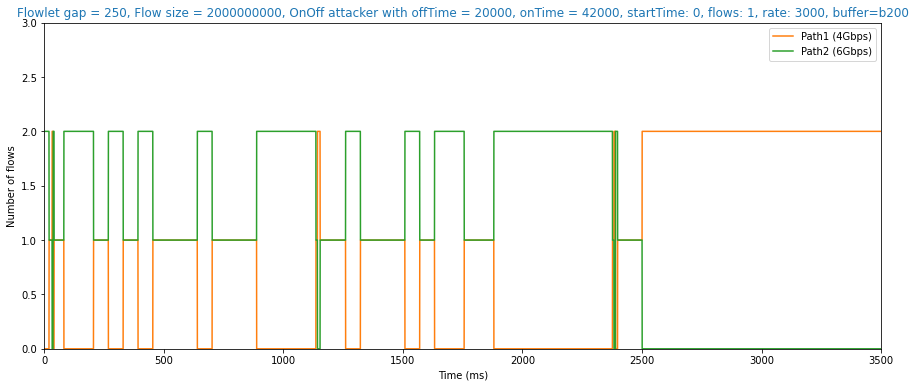

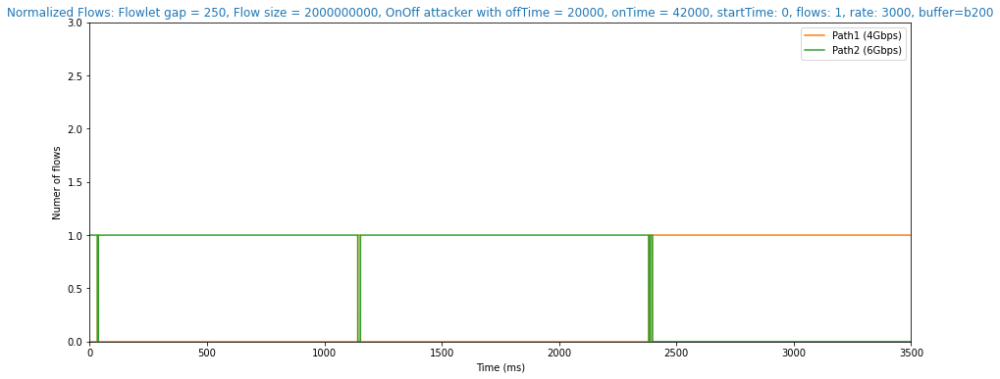

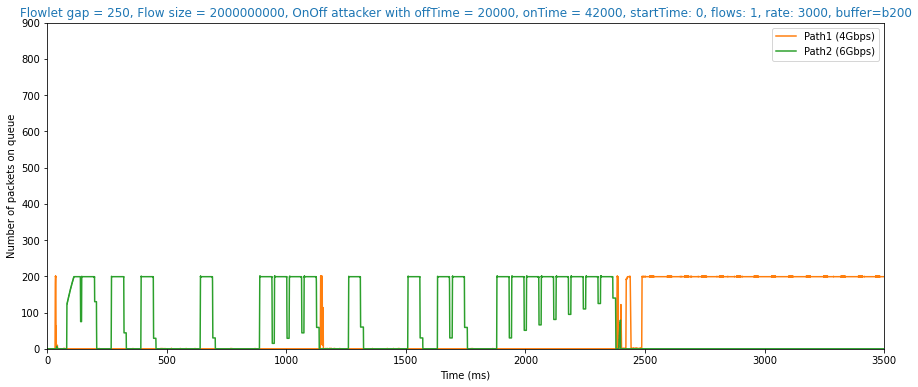

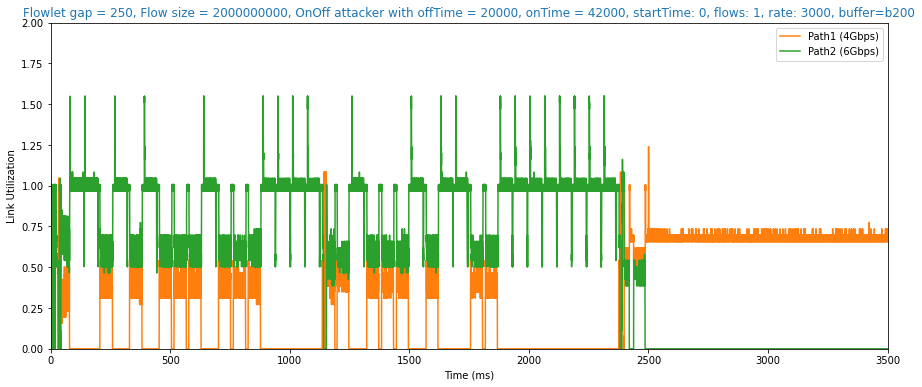

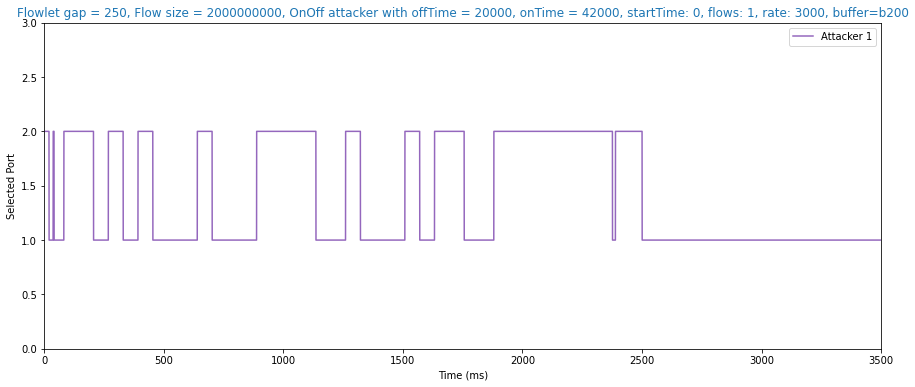

Sender Avg FCT: 4.5990
Avg FCT: 4.3847
Large Flows Avg FCT: 4.3847
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 3.9575


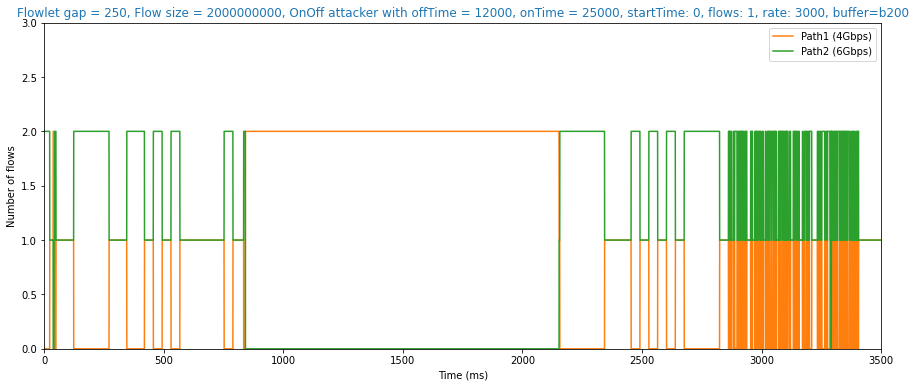

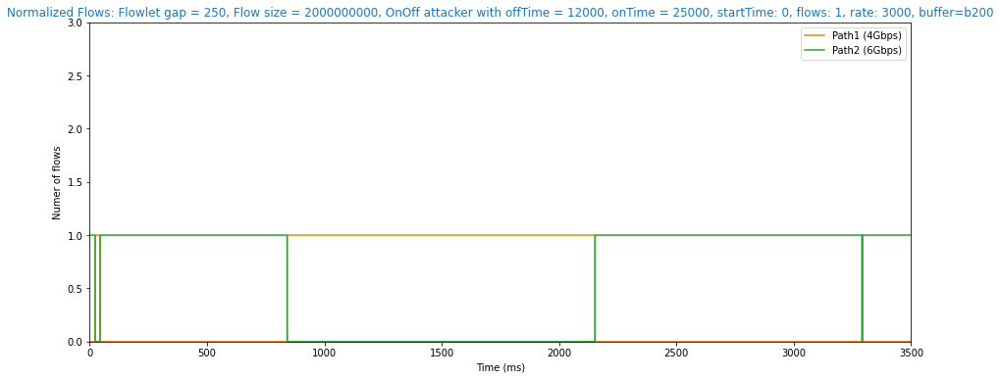

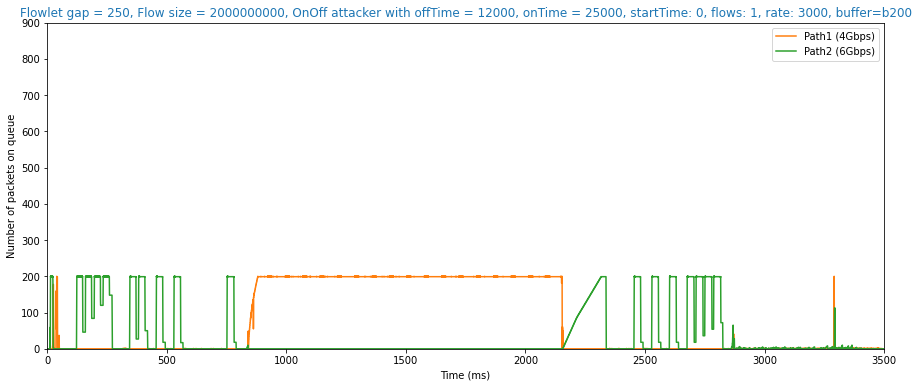

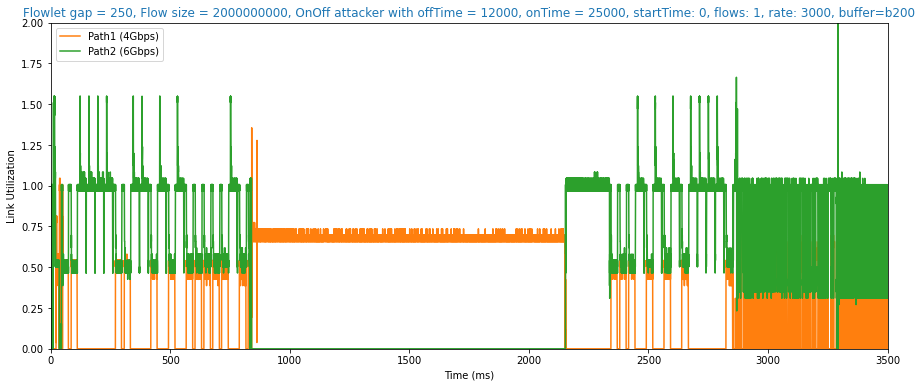

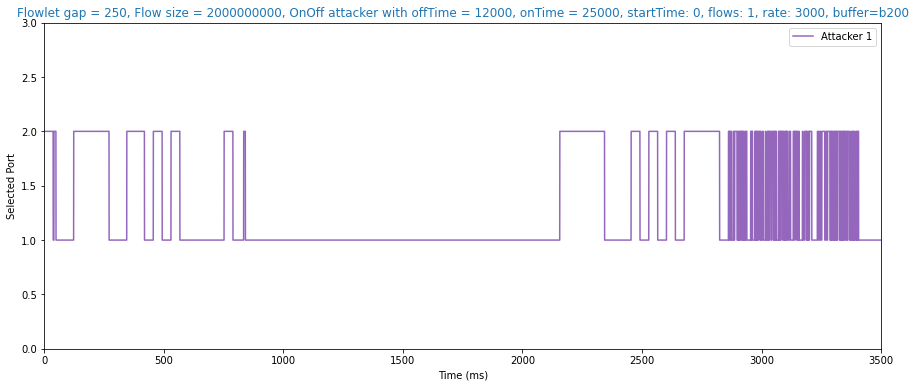

Sender Avg FCT: 4.2546
Avg FCT: 4.8401
Large Flows Avg FCT: 4.8401
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 6.0116


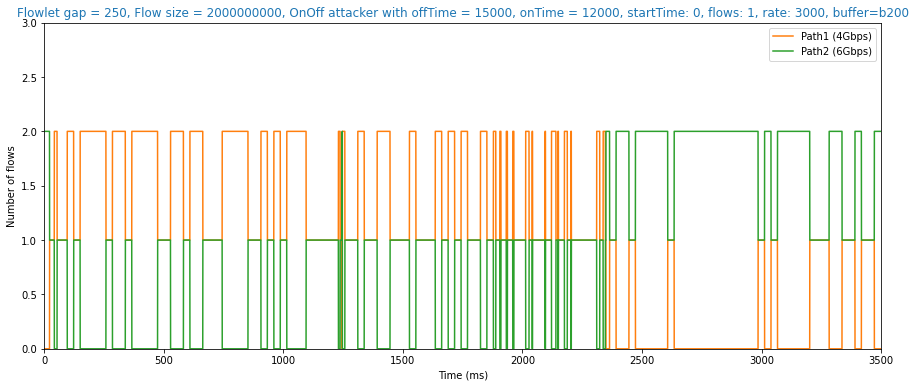

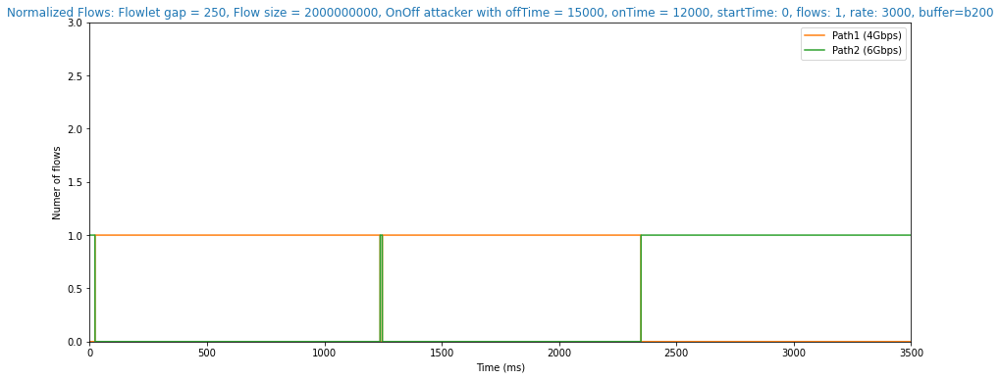

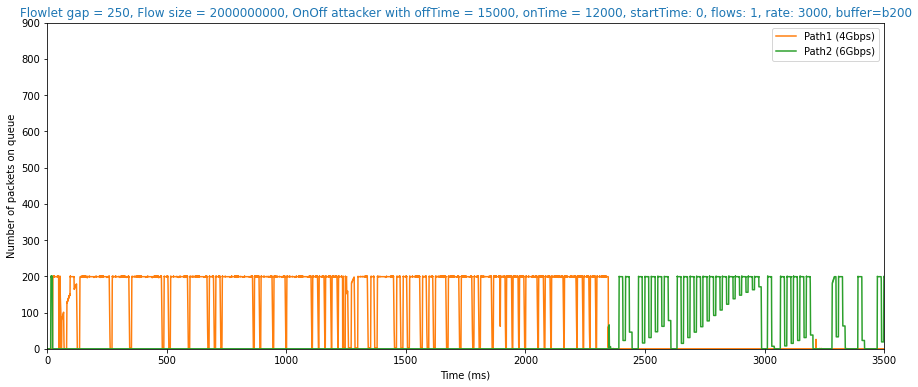

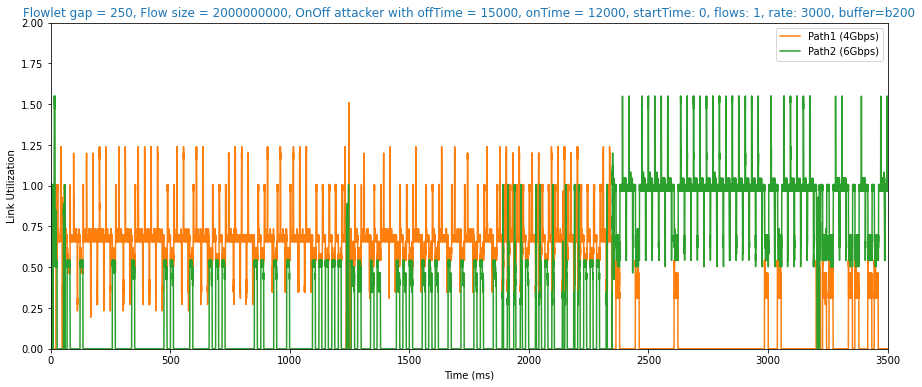

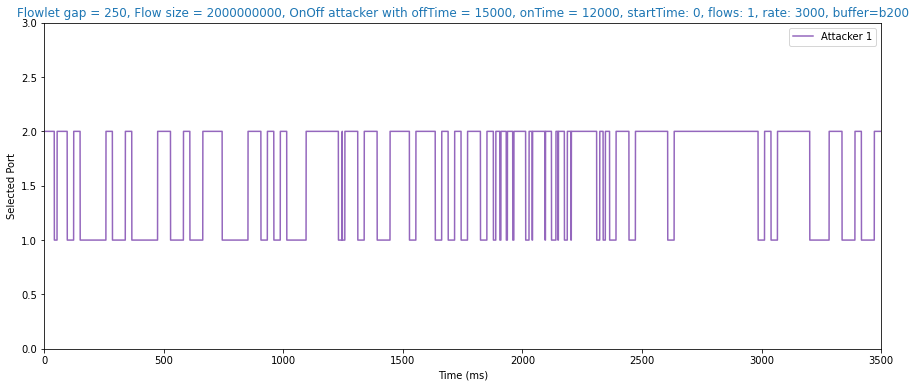

Sender Avg FCT: 4.2007
Avg FCT: 4.3562
Large Flows Avg FCT: 4.3562
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 4.6676


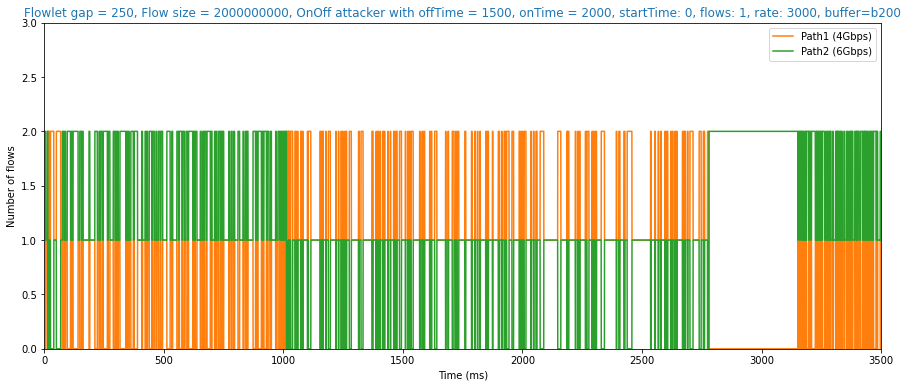

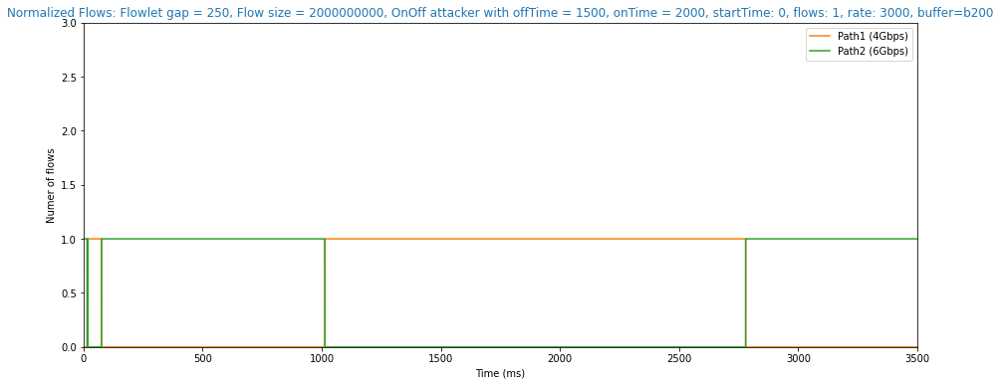

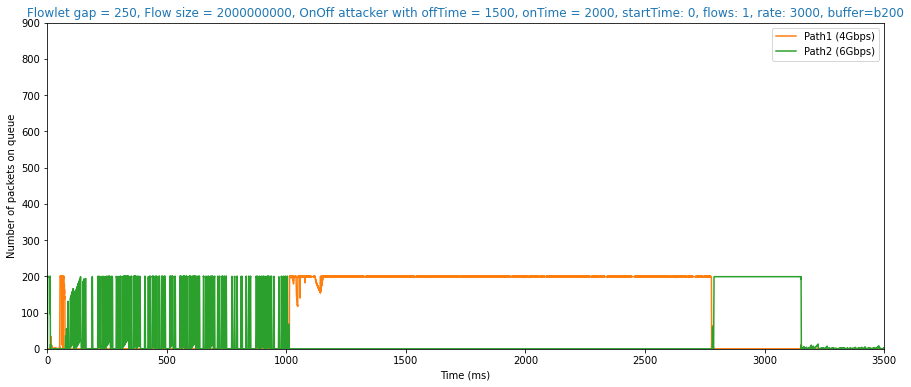

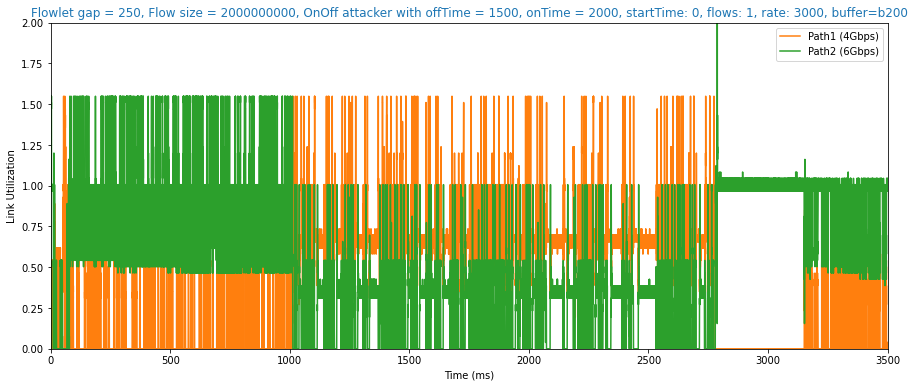

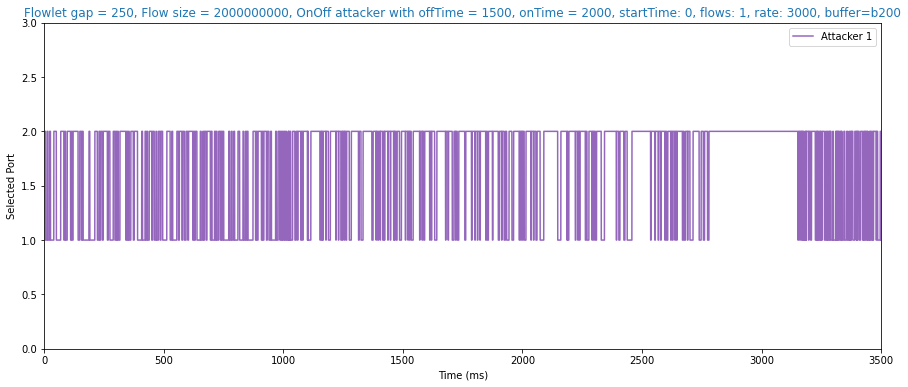

Sender Avg FCT: 4.1565
Avg FCT: 3.6609
Large Flows Avg FCT: 3.6609
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 2.6712


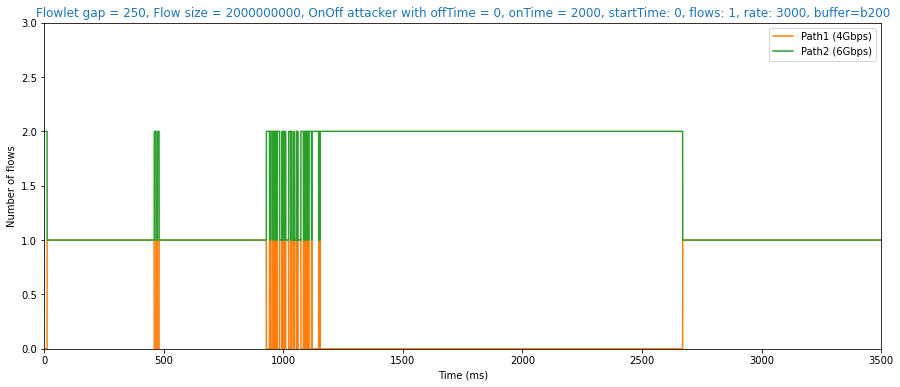

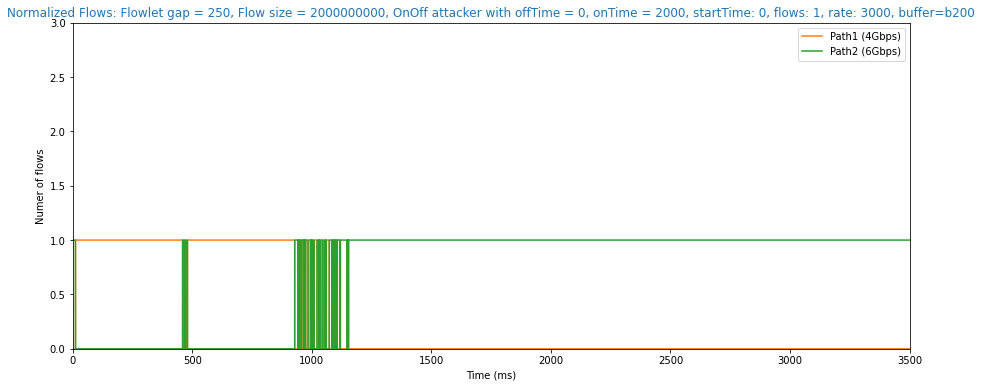

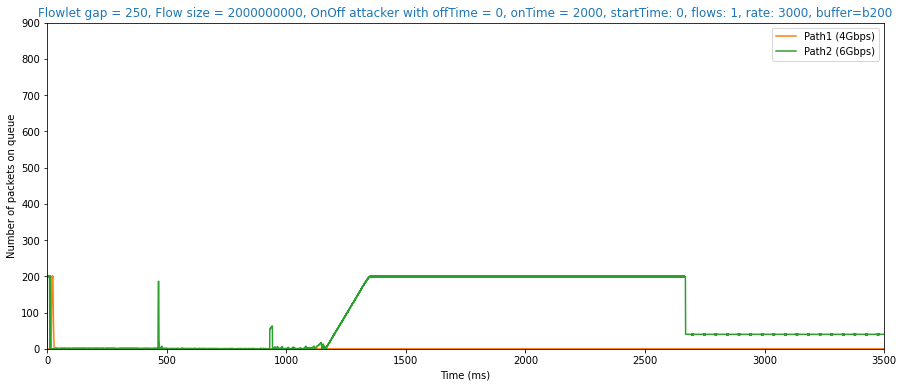

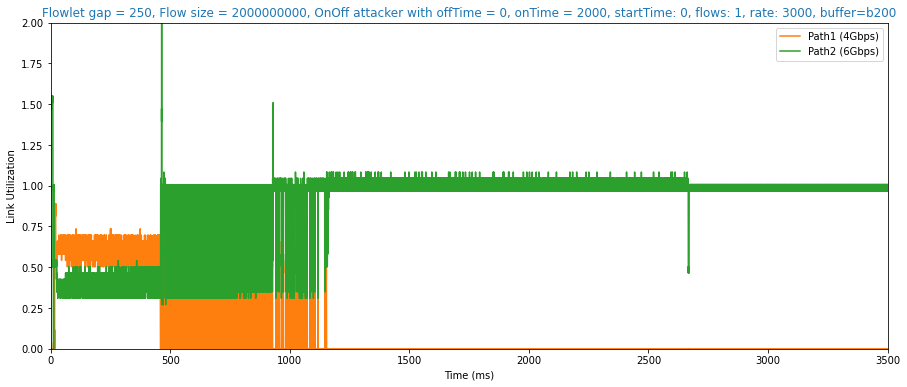

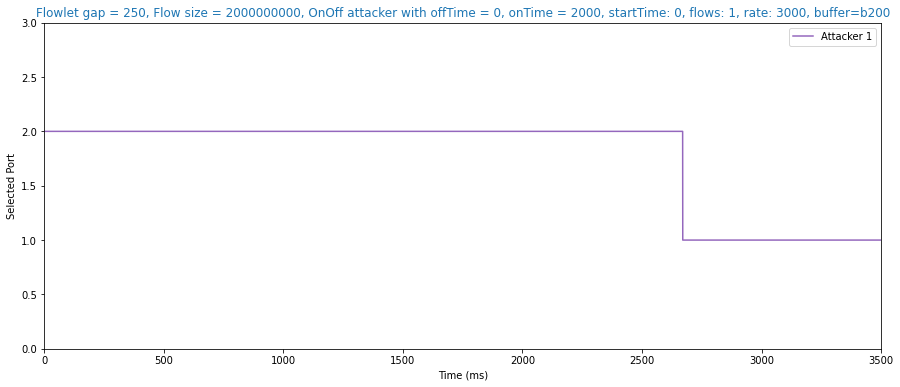

Sender Avg FCT: 4.0440
Avg FCT: 4.1805
Large Flows Avg FCT: 4.1805
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 4.4546


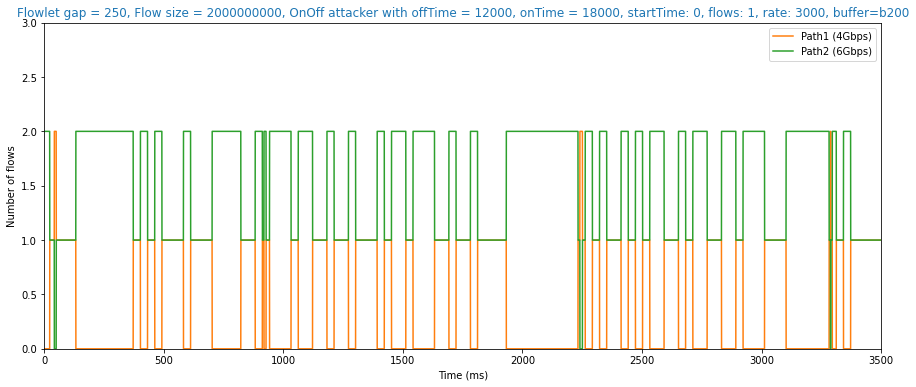

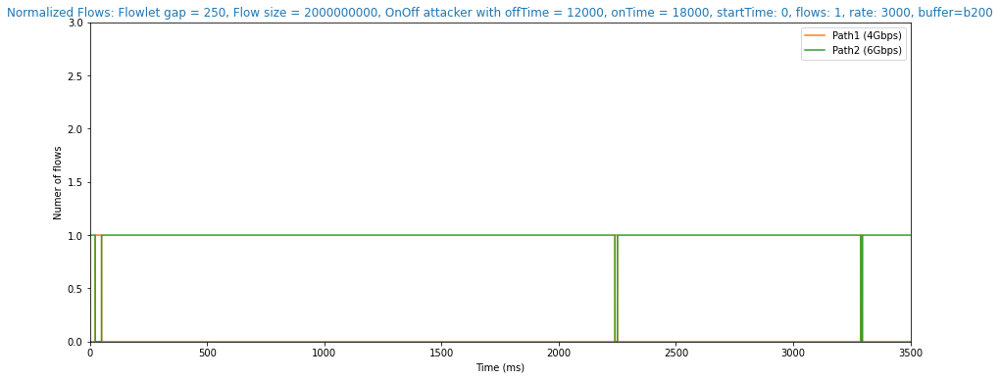

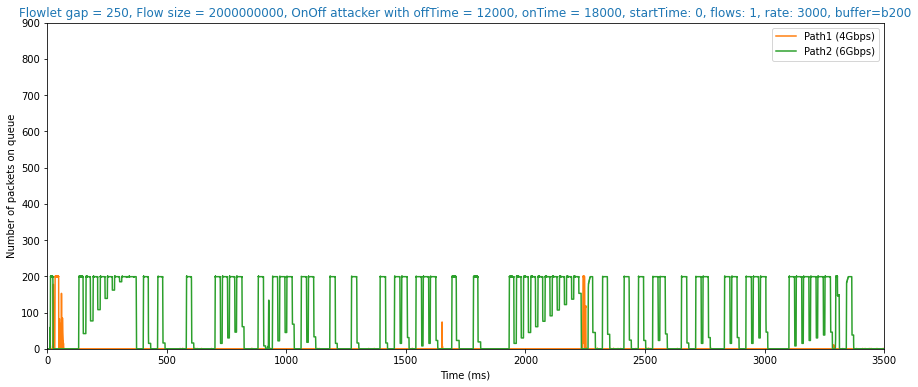

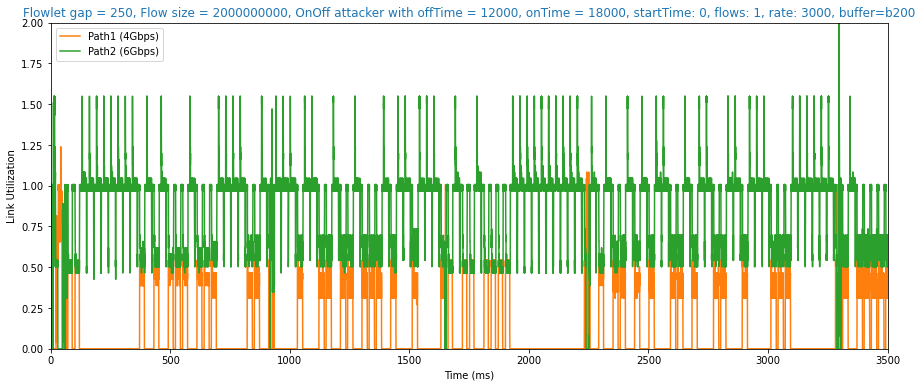

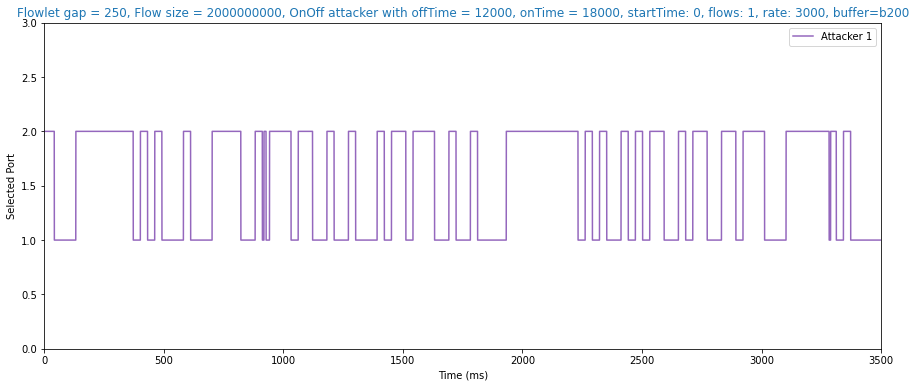

Sender Avg FCT: 3.8426
Avg FCT: 4.5183
Large Flows Avg FCT: 4.5183
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 5.8706


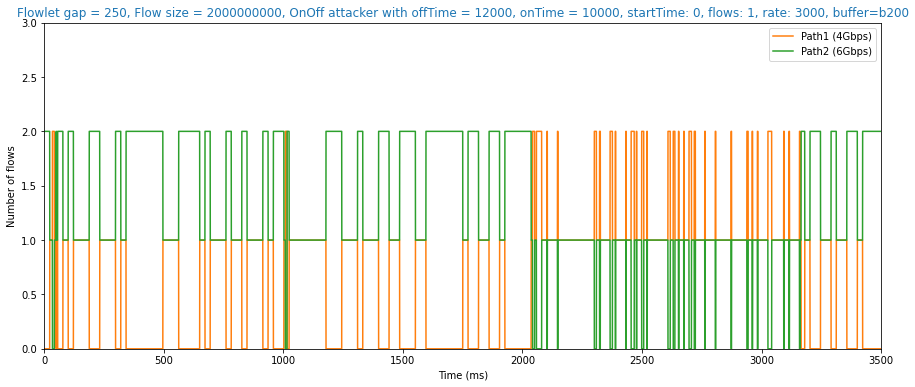

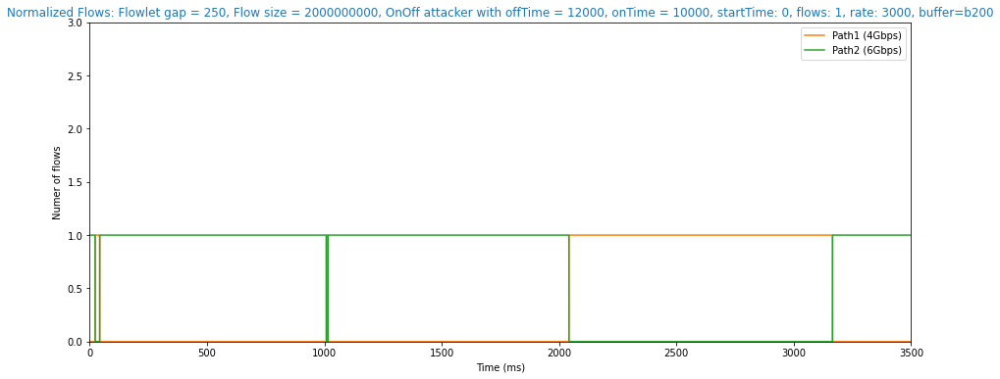

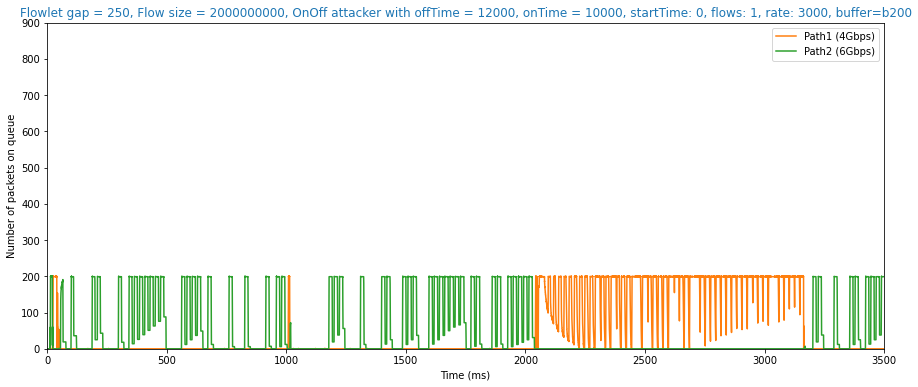

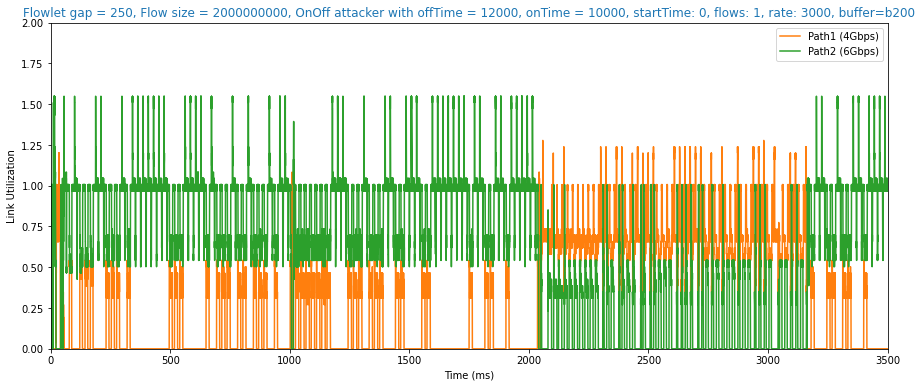

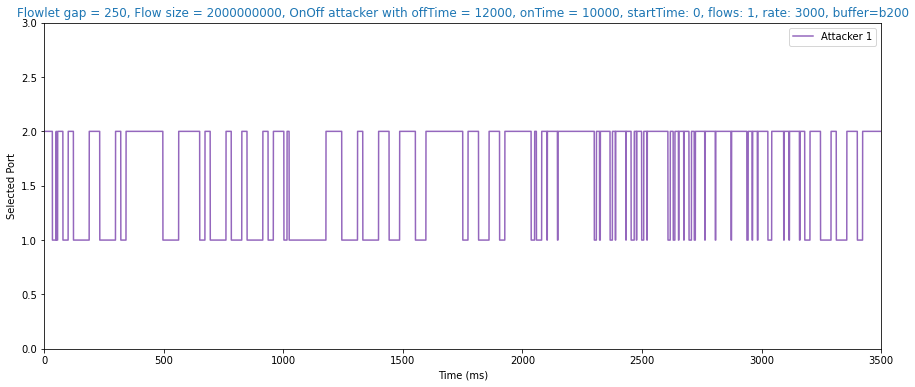

Sender Avg FCT: 2.9138
Avg FCT: 5.2755
Large Flows Avg FCT: 5.2755
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 9.9990


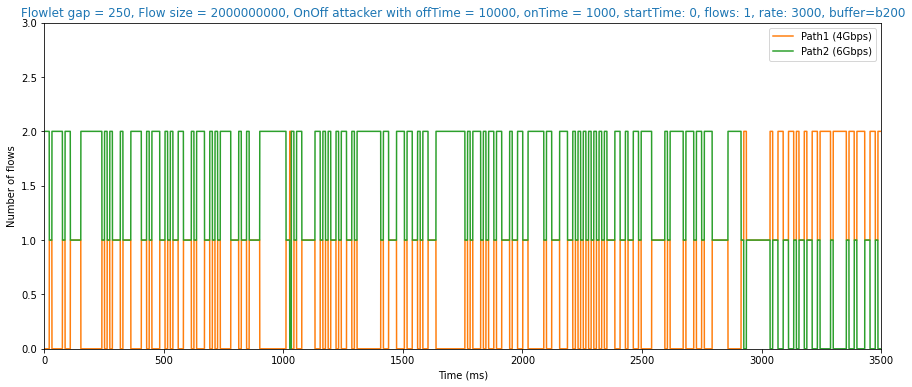

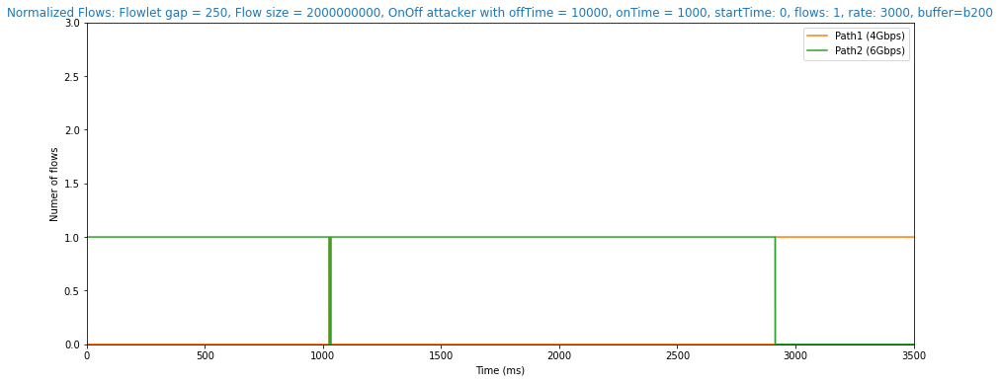

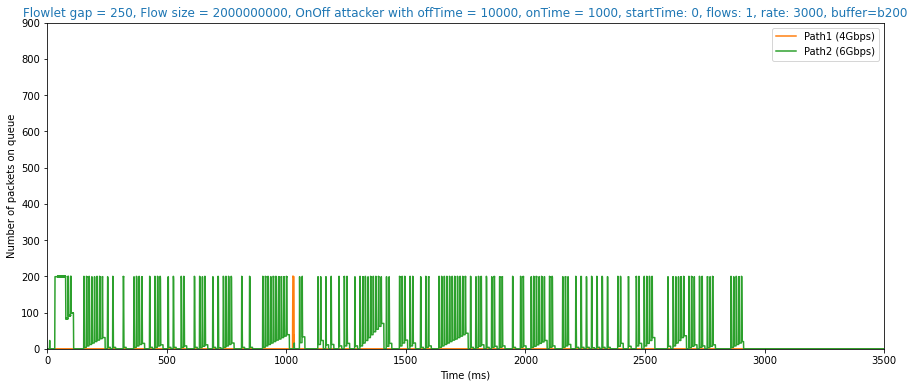

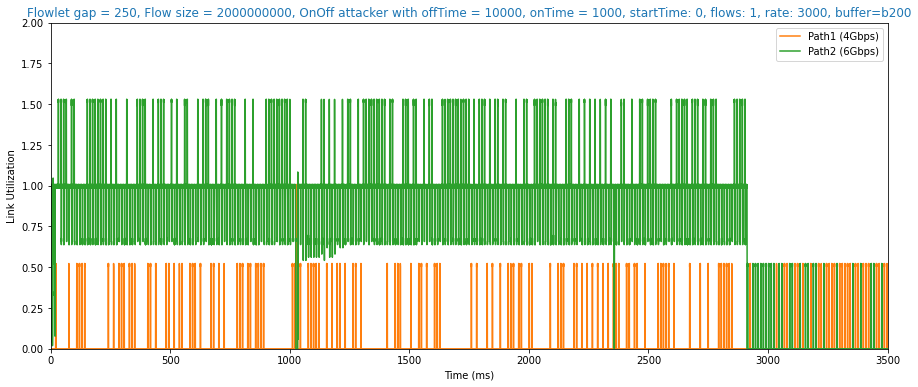

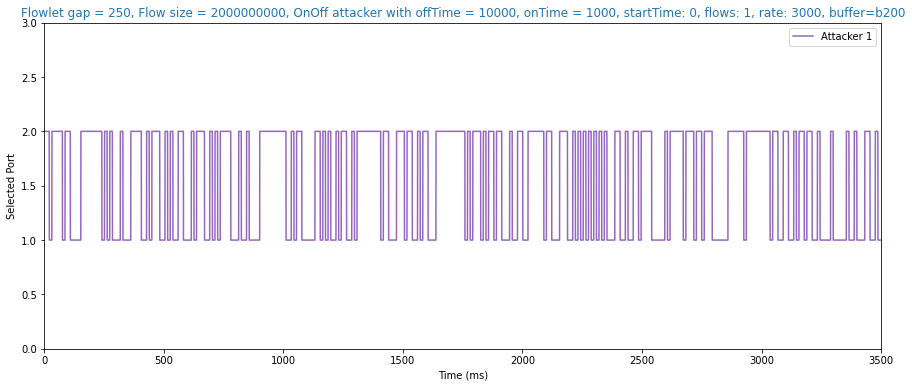

In [75]:
for i in sim22:
    plotSimulationRange(i,(0,5000))

In [314]:
#Increased initial cwnd for attacker
import os 

directory = "/Users/gian/Documents/Madison/simulations/sim21"
os.chdir(directory)
files = []
for filename in os.listdir(directory):
    if filename.endswith(".xml"):
        files.append(parseSimulationFiles(filename.split('.')[0]))
files.sort(key=worstSenderAvgFct)

Sender Avg FCT: 4.8007
Avg FCT: 5.2040
Large Flows Avg FCT: 5.2040
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 6.0116


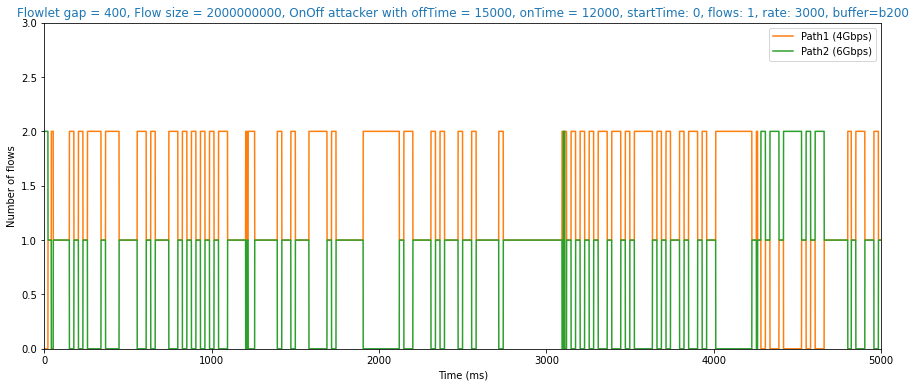

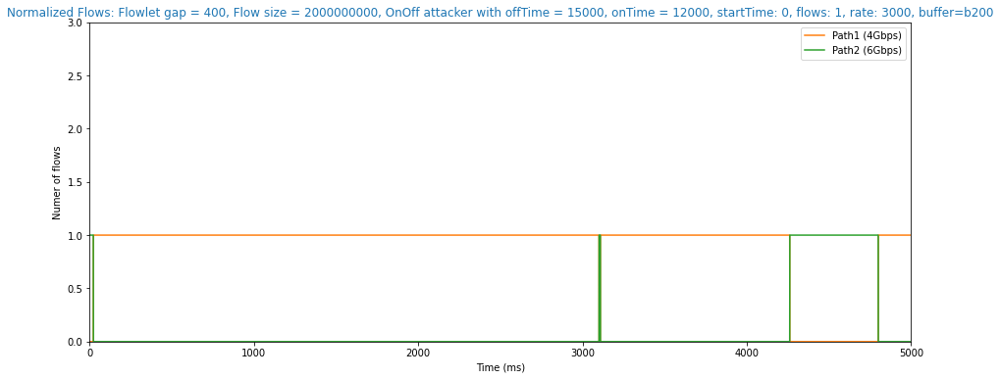

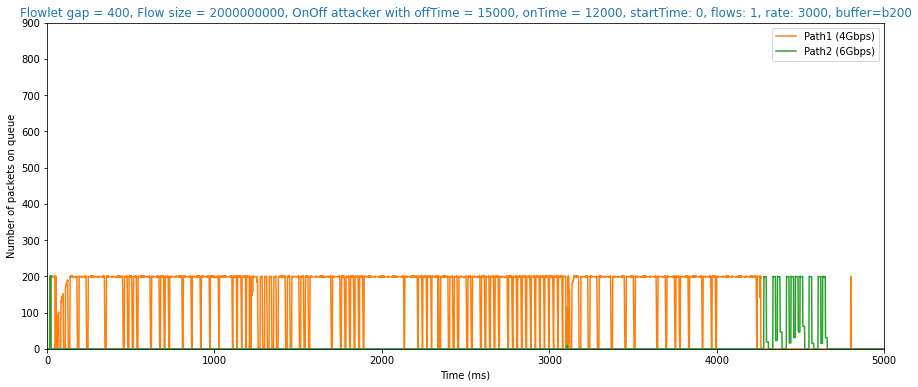

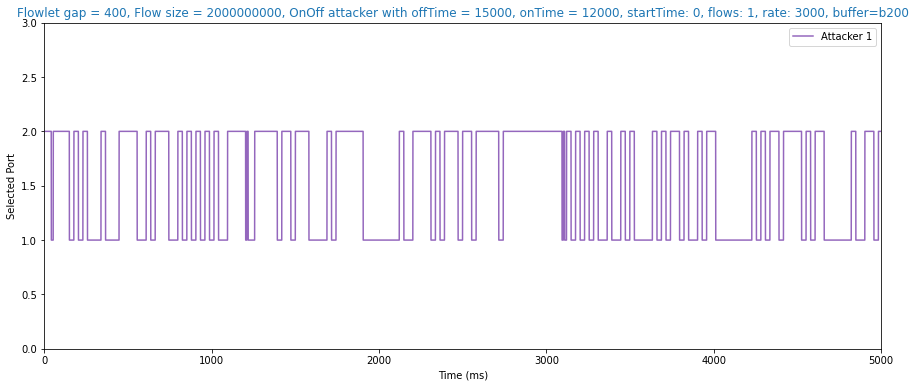

Sender Avg FCT: 4.4240
Avg FCT: 5.1738
Large Flows Avg FCT: 5.1738
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 6.6746


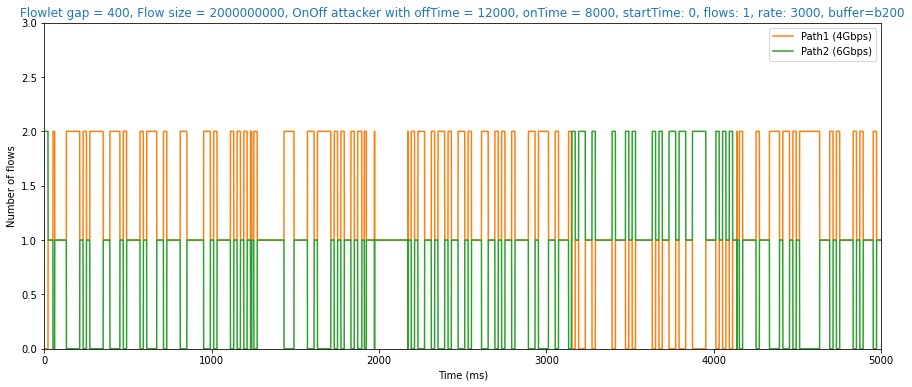

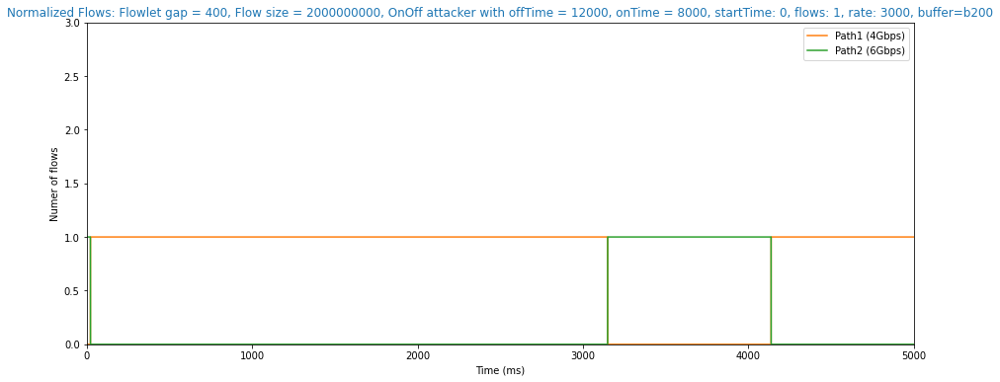

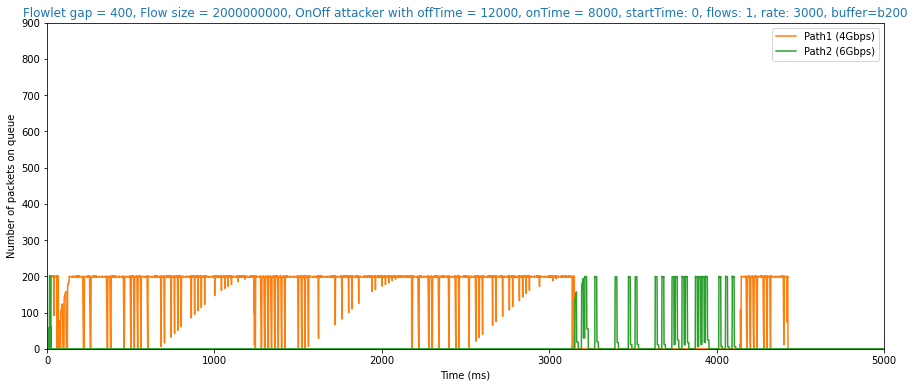

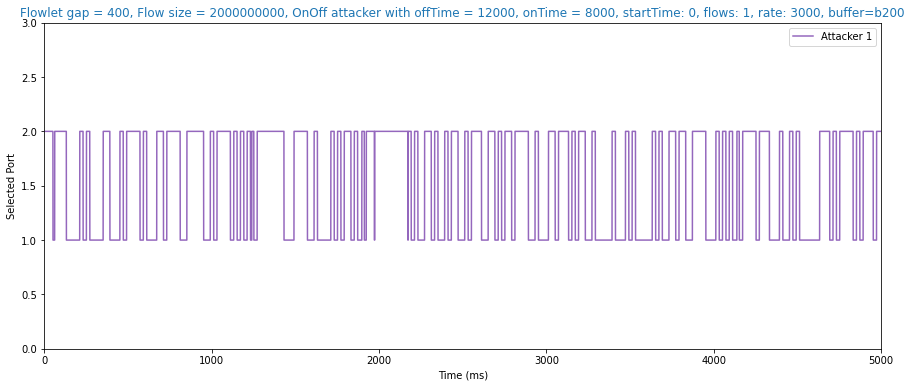

Sender Avg FCT: 4.4206
Avg FCT: 5.0605
Large Flows Avg FCT: 5.0605
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 6.3406


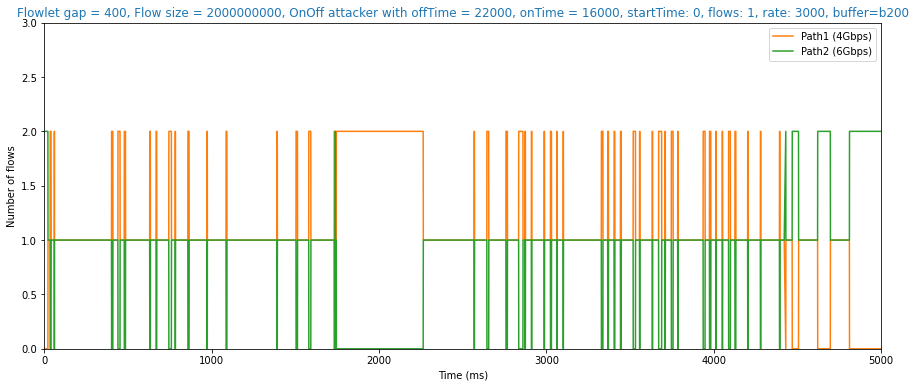

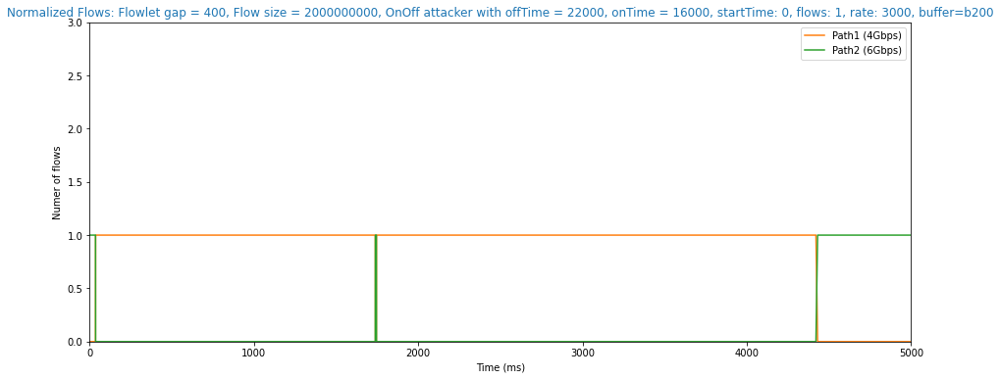

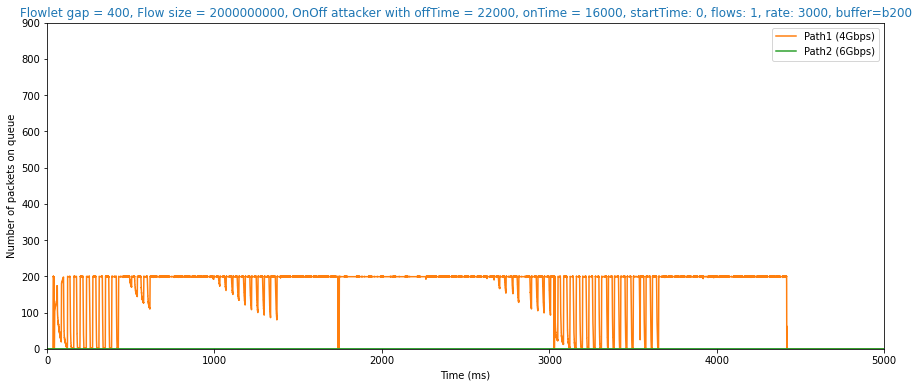

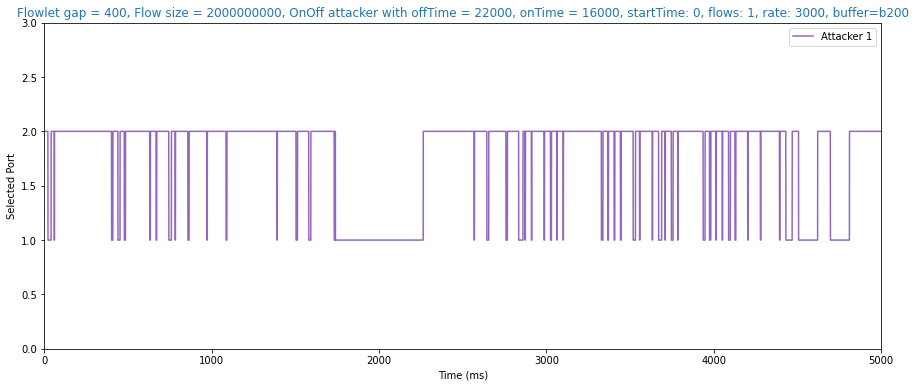

Sender Avg FCT: 4.3343
Avg FCT: 4.0908
Large Flows Avg FCT: 4.0908
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 3.6052


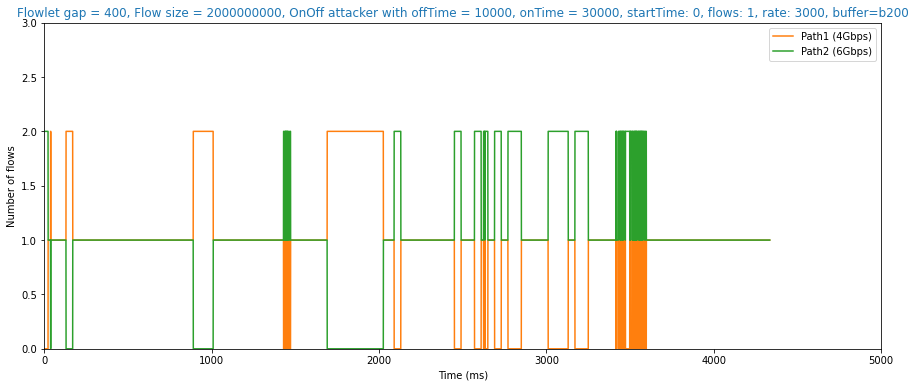

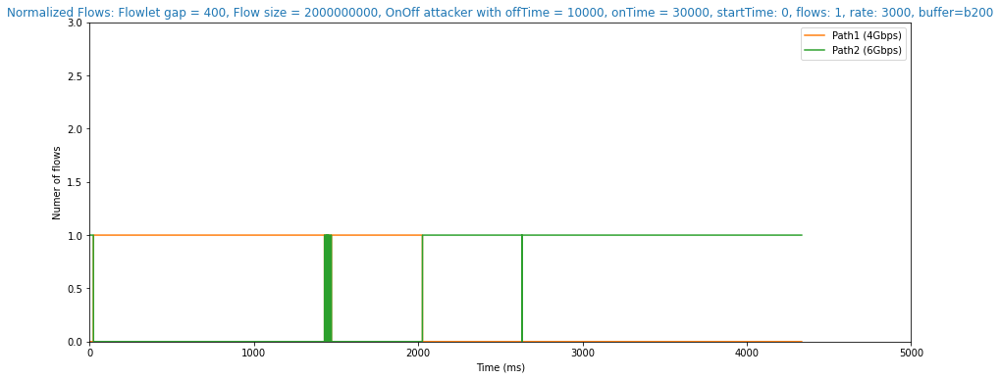

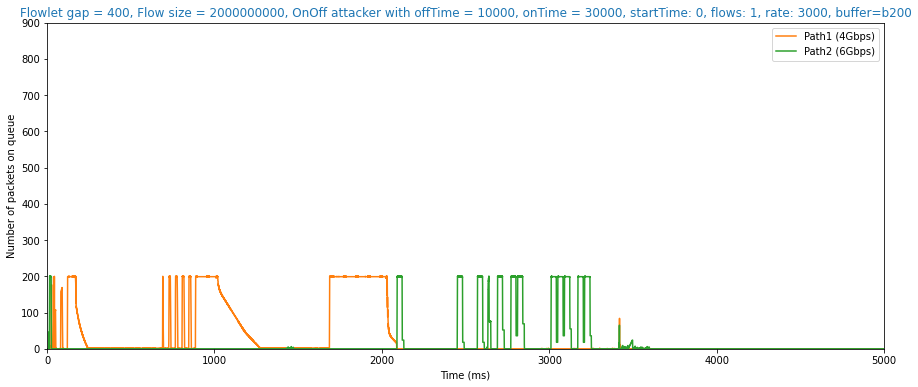

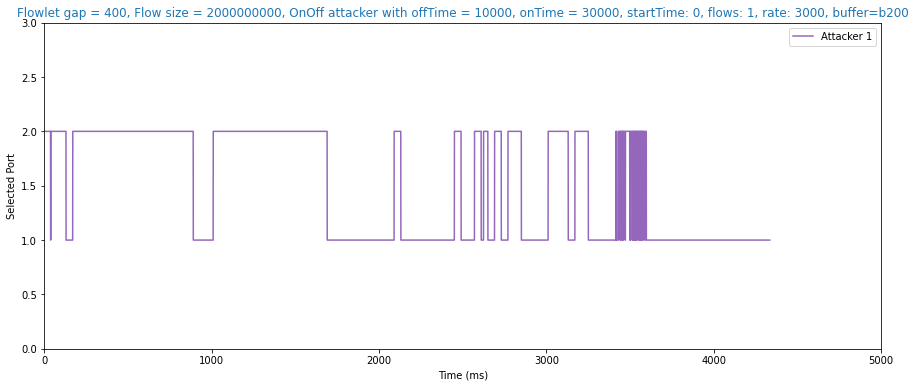

Sender Avg FCT: 4.1565
Avg FCT: 3.6609
Large Flows Avg FCT: 3.6609
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 2.6713


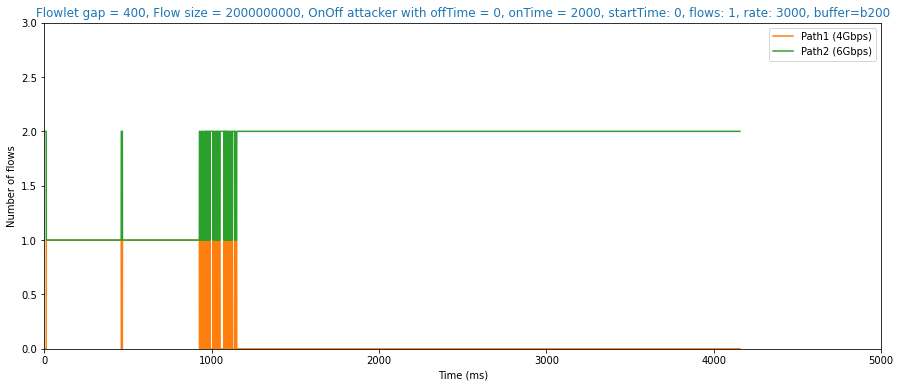

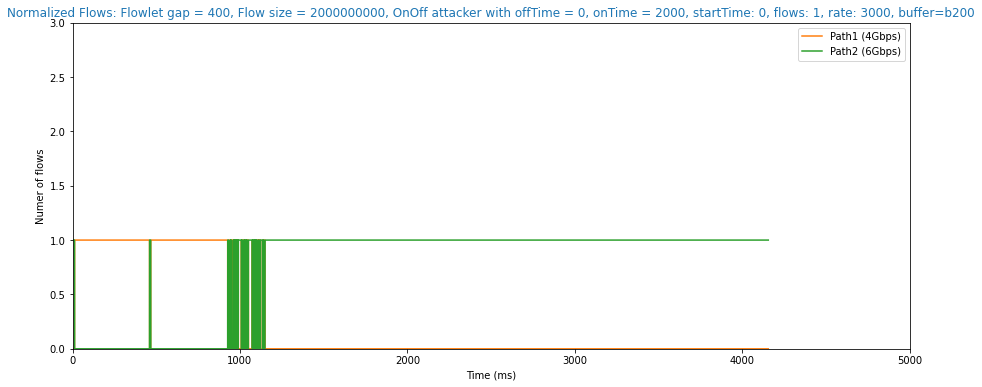

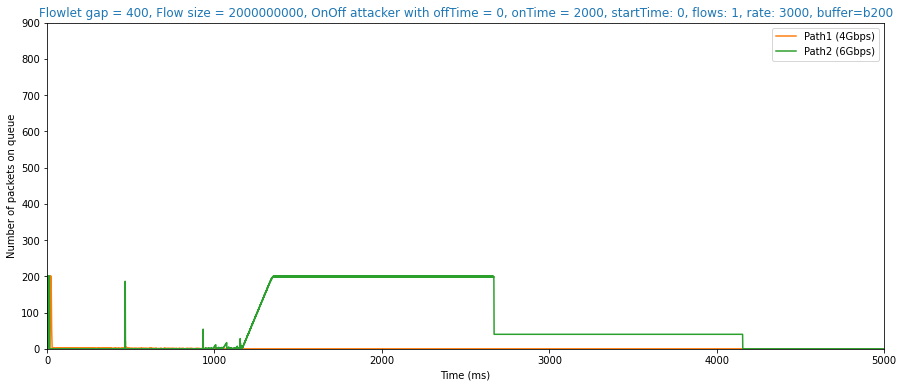

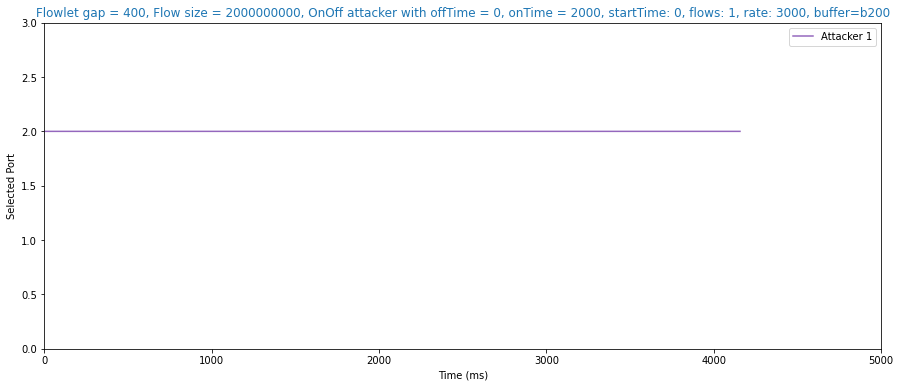

Sender Avg FCT: 4.1326
Avg FCT: 4.3118
Large Flows Avg FCT: 4.3118
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 4.6706


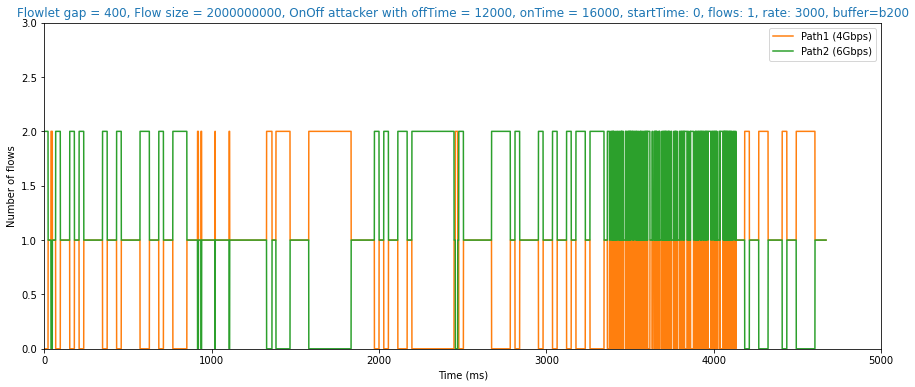

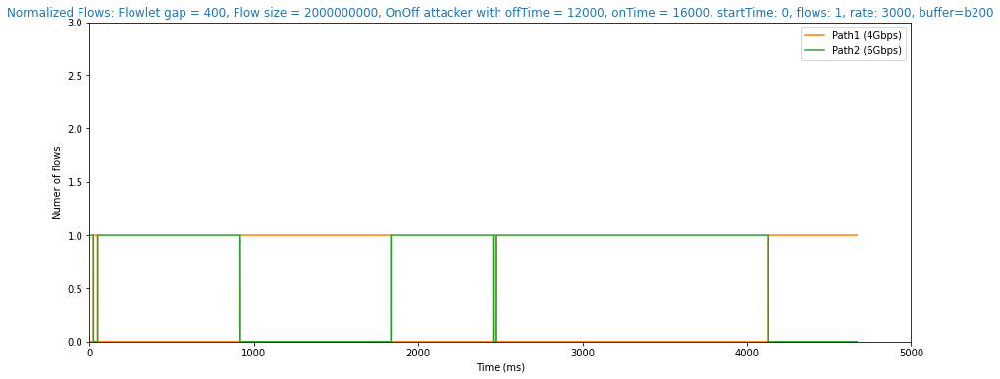

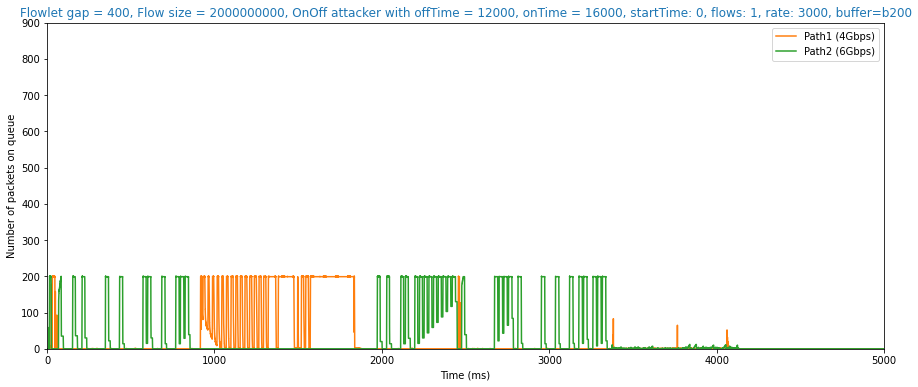

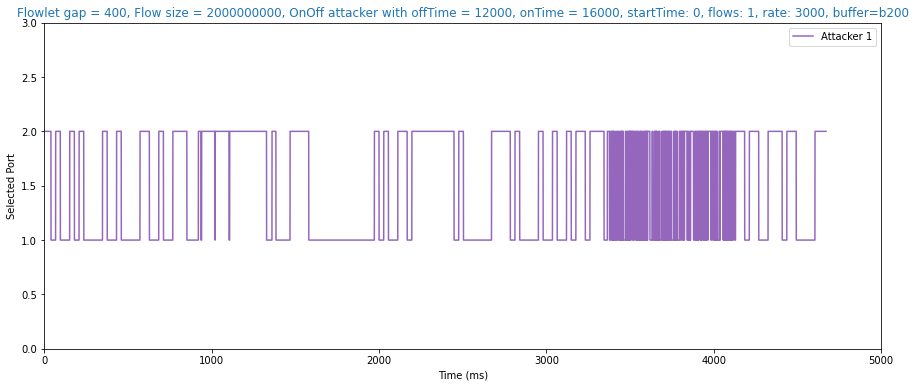

Sender Avg FCT: 4.0969
Avg FCT: 5.1032
Large Flows Avg FCT: 5.1032
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 7.1166


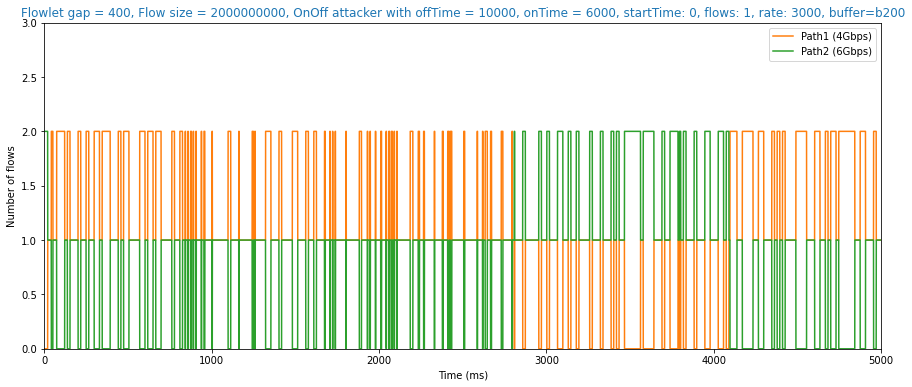

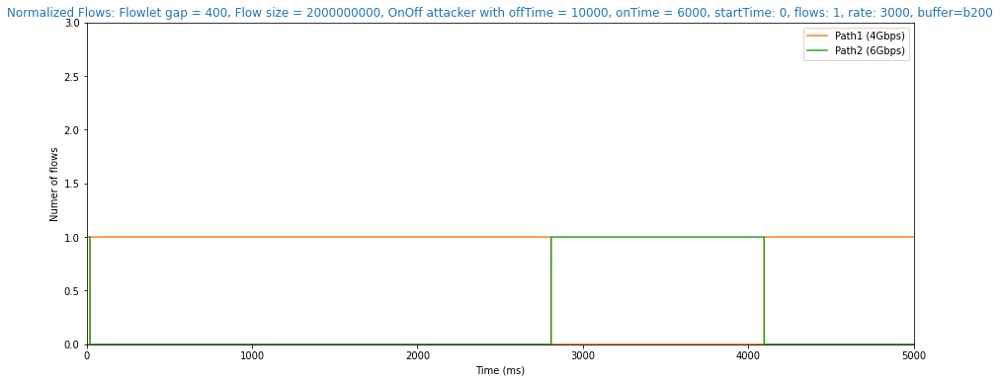

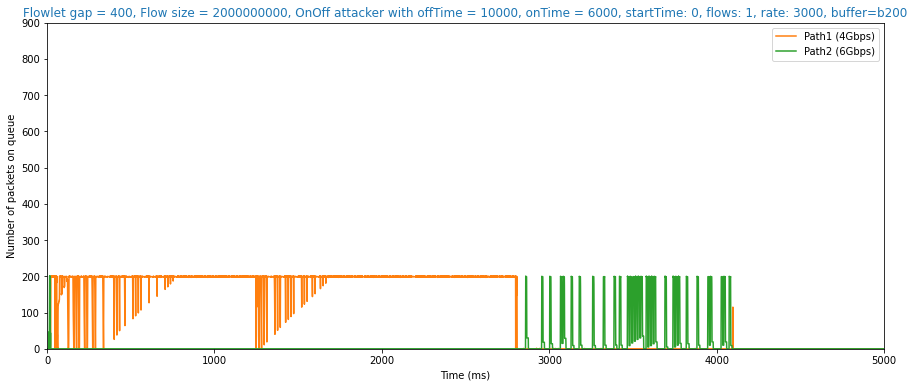

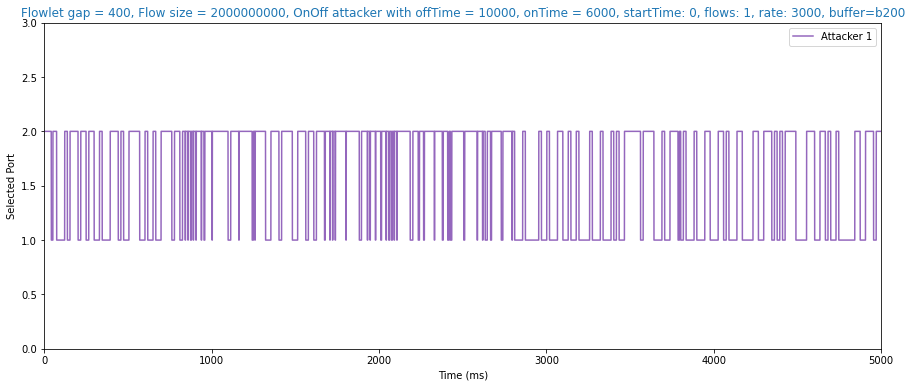

Sender Avg FCT: 3.8679
Avg FCT: 4.5352
Large Flows Avg FCT: 4.5352
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 5.8706


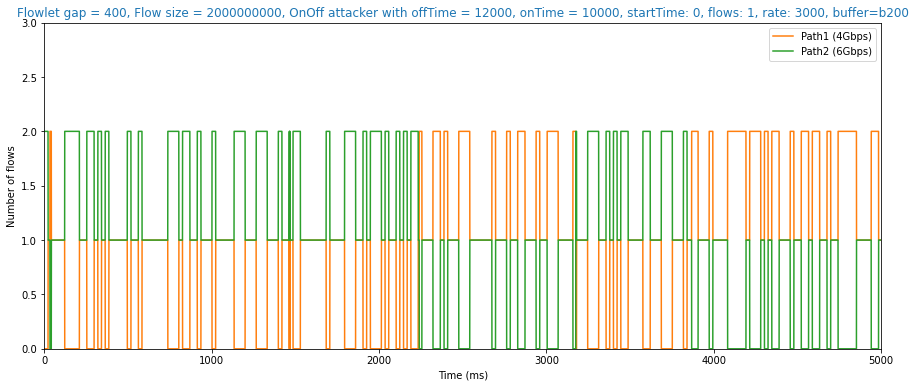

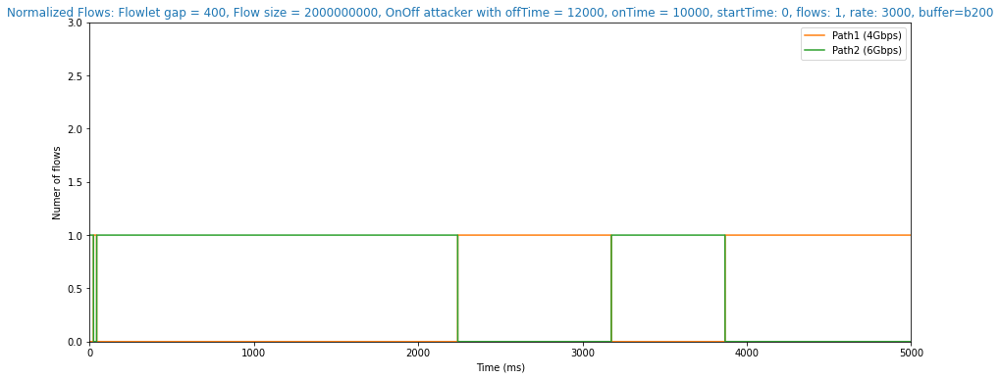

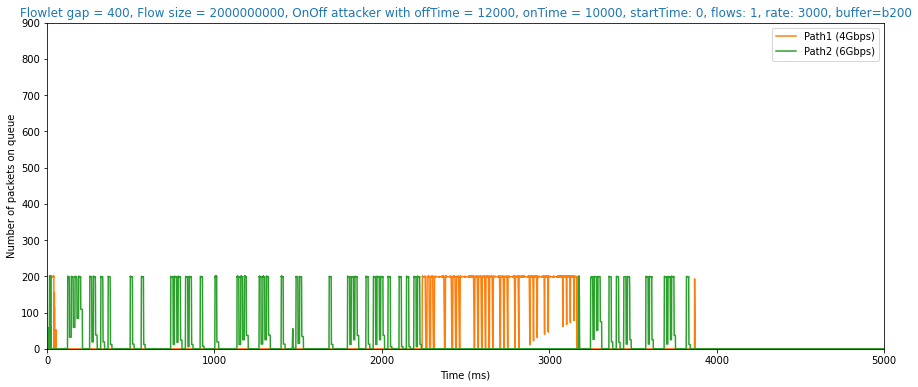

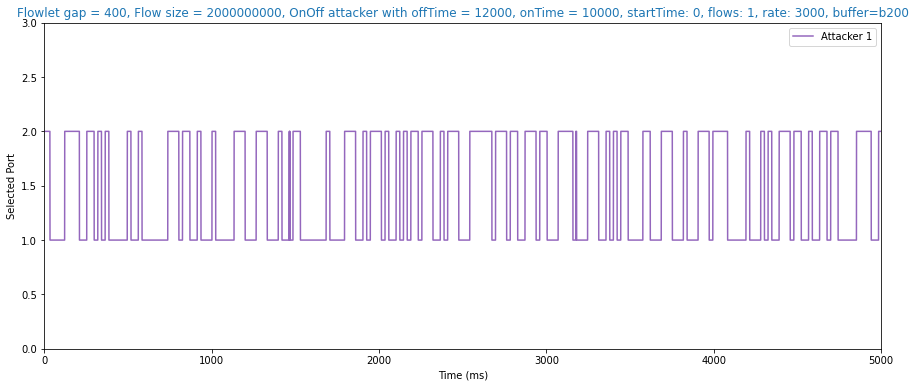

In [315]:
for i in files:
    plotSimulationRange(i,(0,5000))

In [299]:
#Increased initial cwnd for attacker
import os 

directory = "/Users/gian/Documents/Madison/simulations/sim20"
os.chdir(directory)
files = []
for filename in os.listdir(directory):
    if filename.endswith(".xml"):
        files.append(parseSimulationFiles(filename.split('.')[0]))
files.sort(key=worstSenderAvgFct)

Sender Avg FCT: 6.2413
Avg FCT: 6.1200
Large Flows Avg FCT: 6.1200
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 5.8796


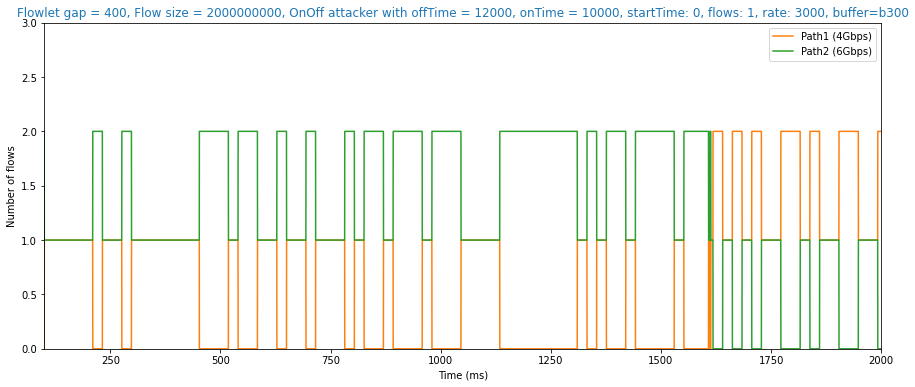

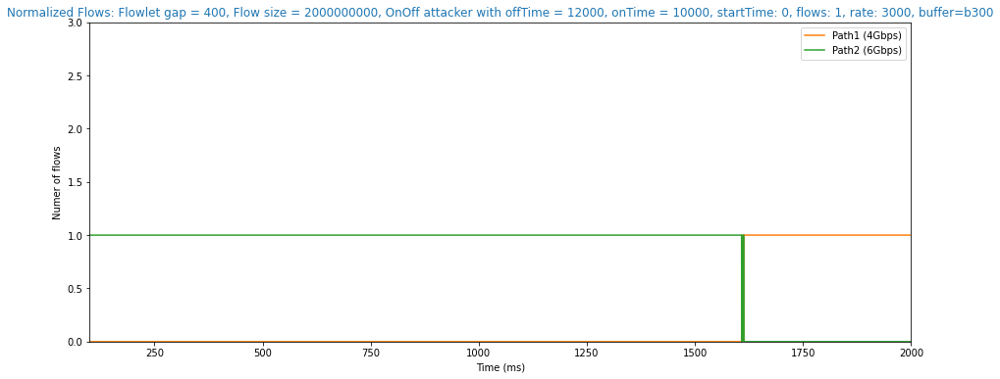

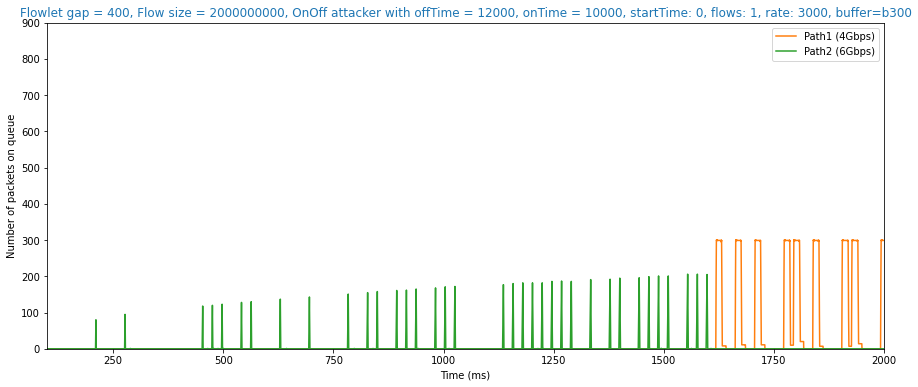

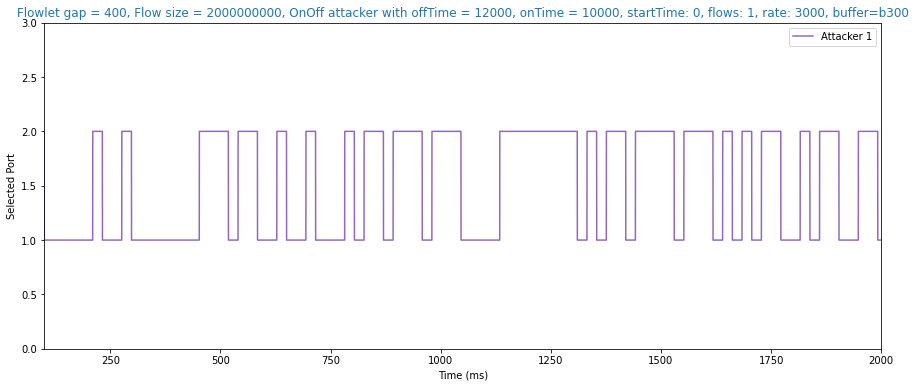

Sender Avg FCT: 6.2392
Avg FCT: 6.1863
Large Flows Avg FCT: 6.1863
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 6.0820


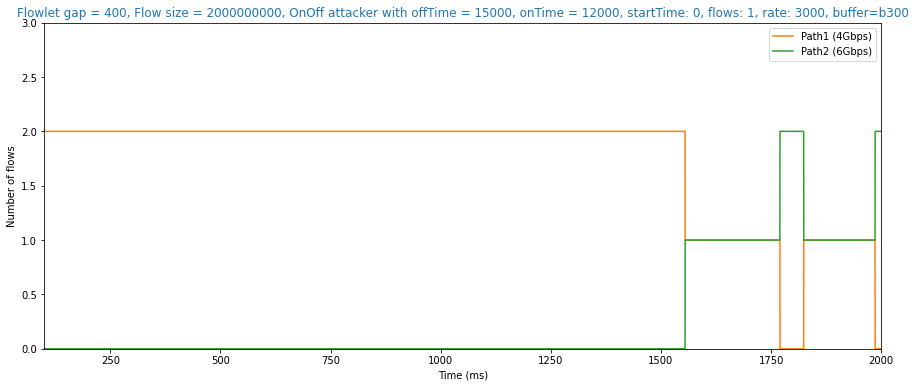

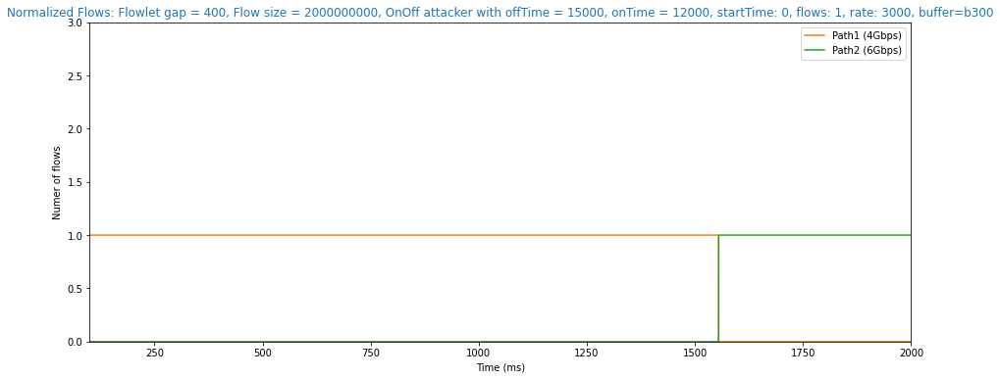

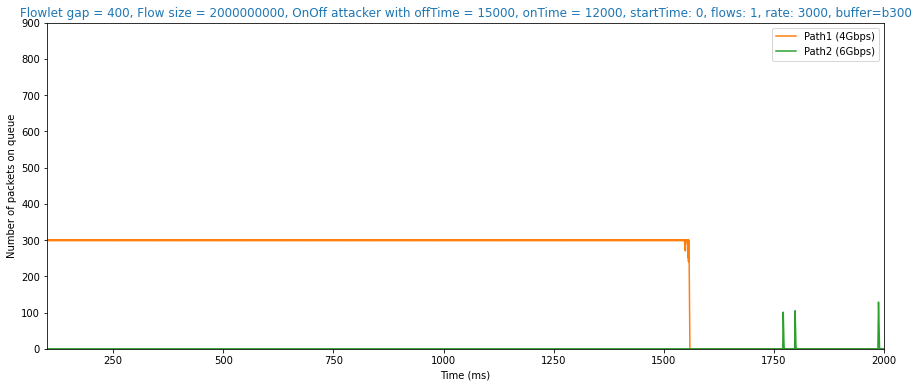

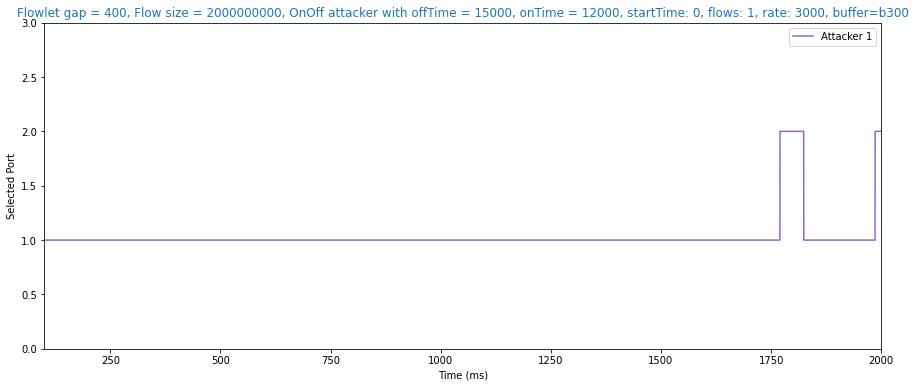

Sender Avg FCT: 6.2385
Avg FCT: 5.7203
Large Flows Avg FCT: 5.7203
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 4.6858


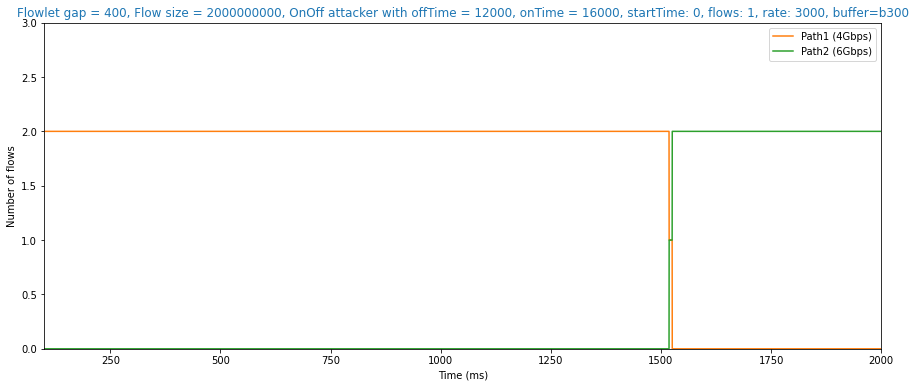

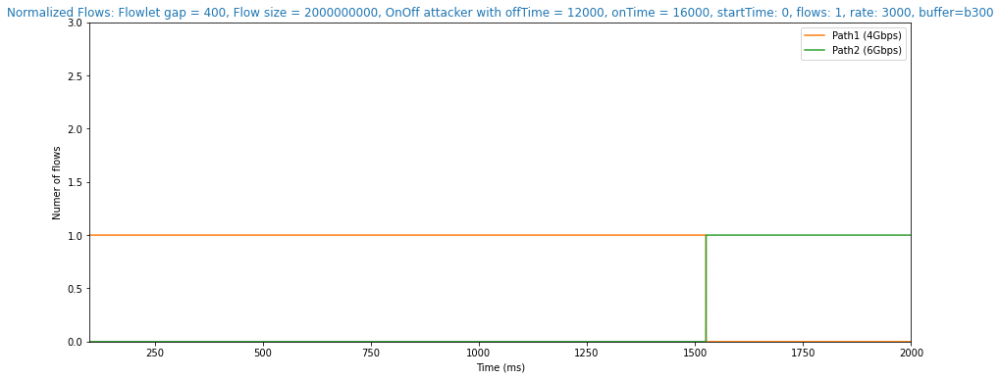

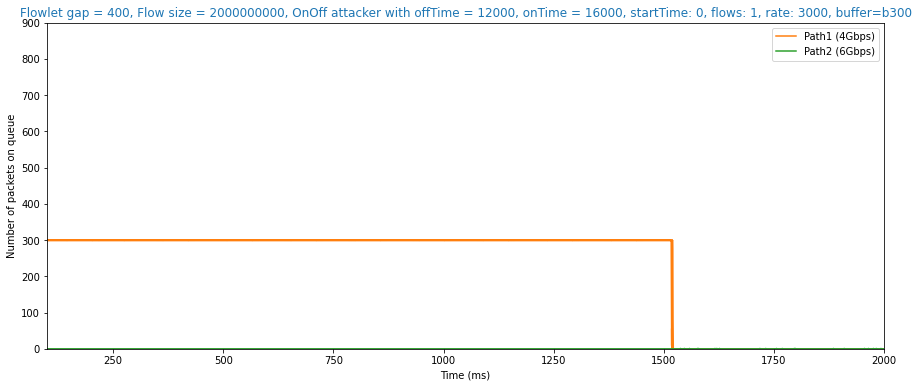

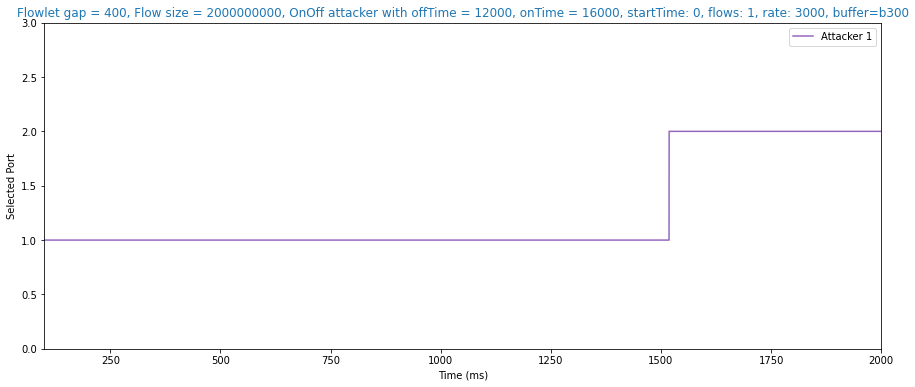

Sender Avg FCT: 6.1908
Avg FCT: 6.2402
Large Flows Avg FCT: 6.2402
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 6.3406


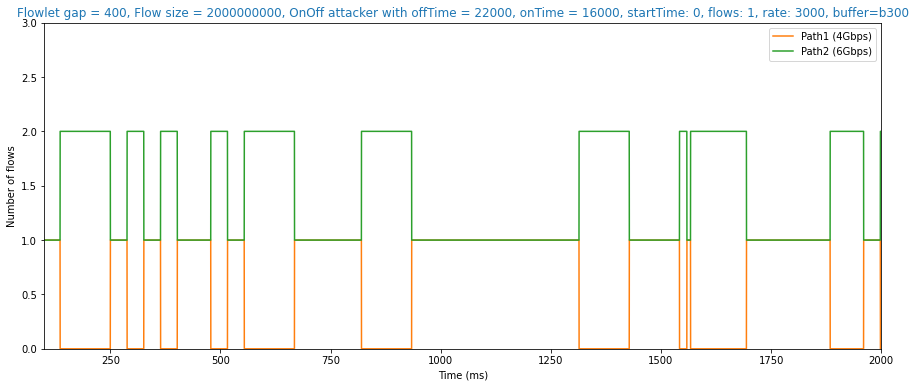

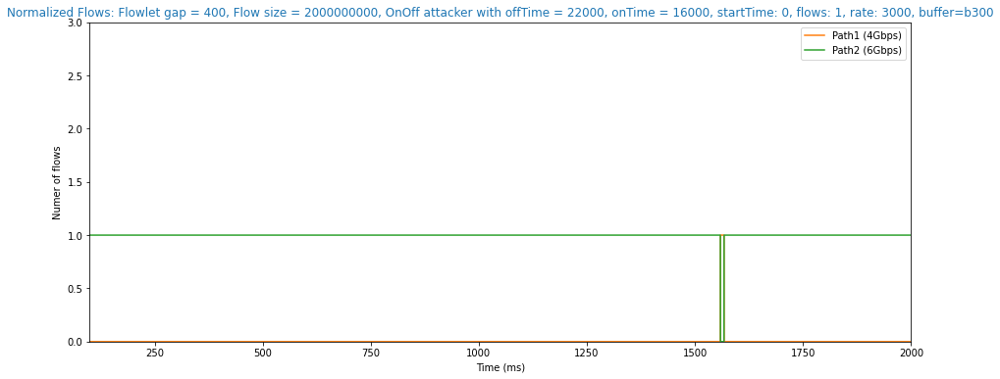

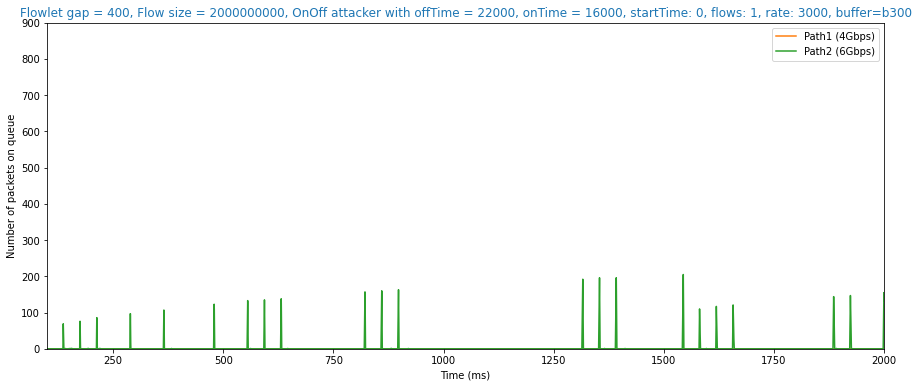

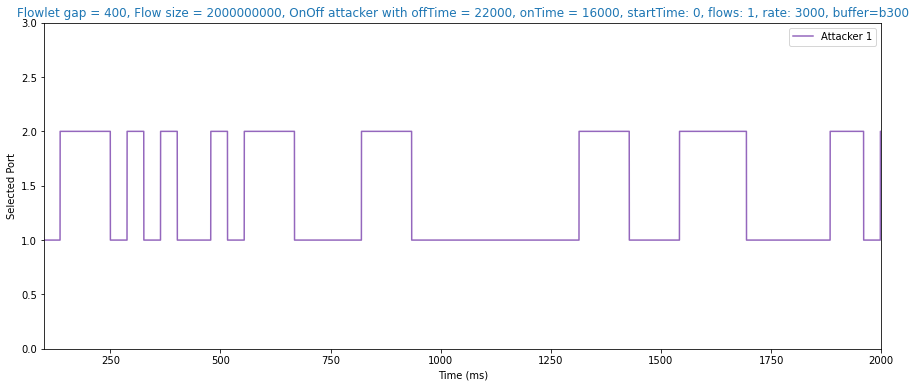

Sender Avg FCT: 5.8709
Avg FCT: 6.2857
Large Flows Avg FCT: 6.2857
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 7.1166


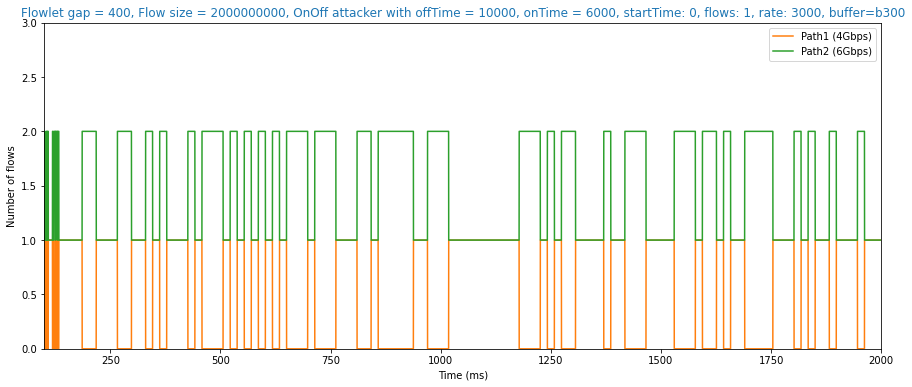

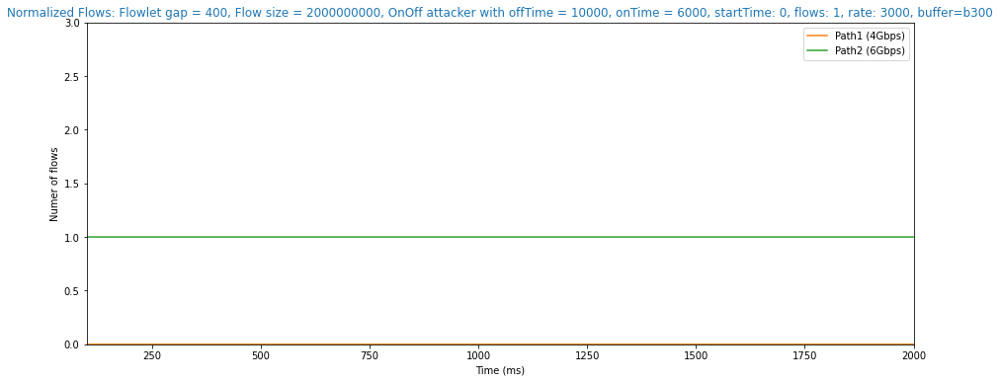

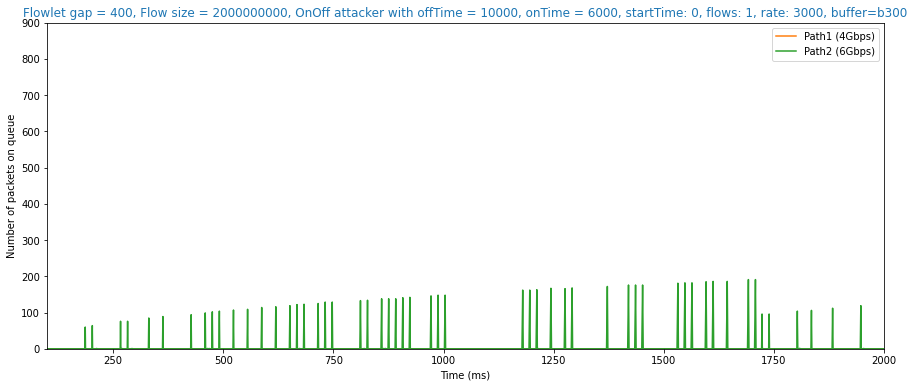

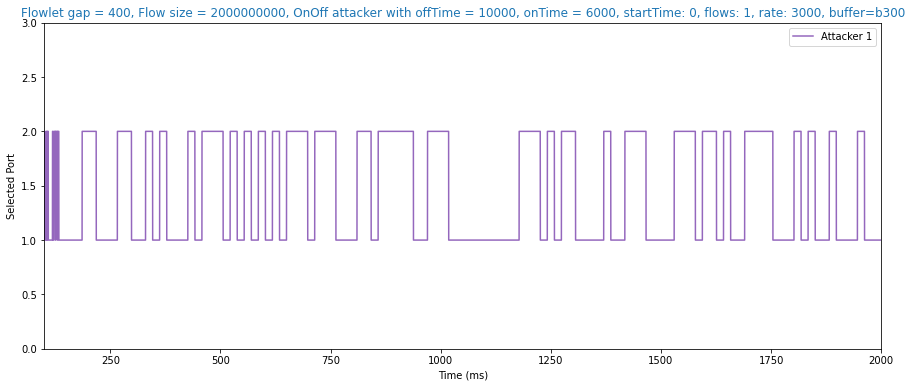

Sender Avg FCT: 5.8638
Avg FCT: 6.1338
Large Flows Avg FCT: 6.1338
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 6.6746


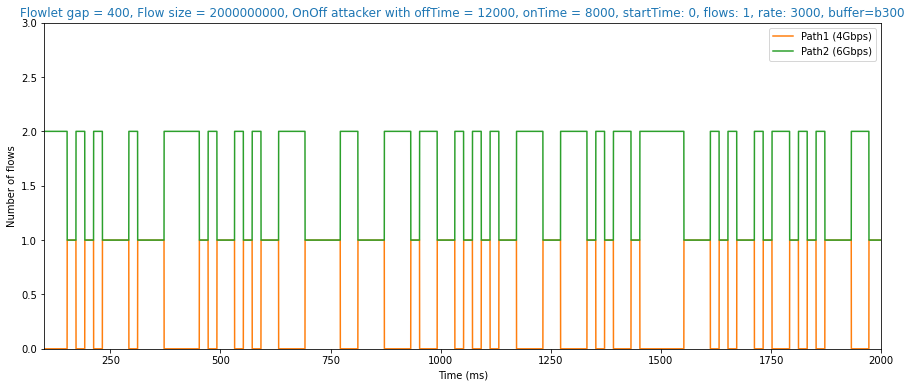

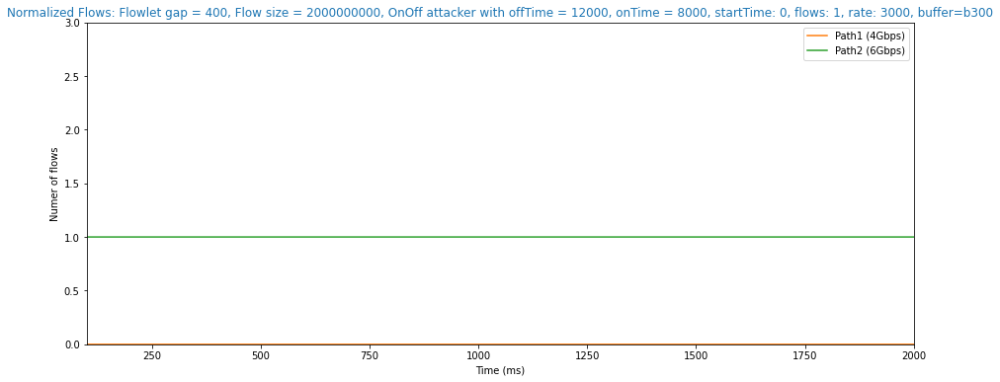

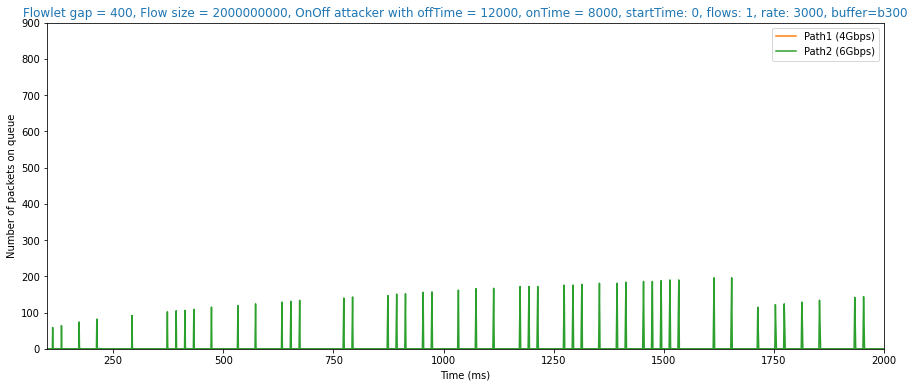

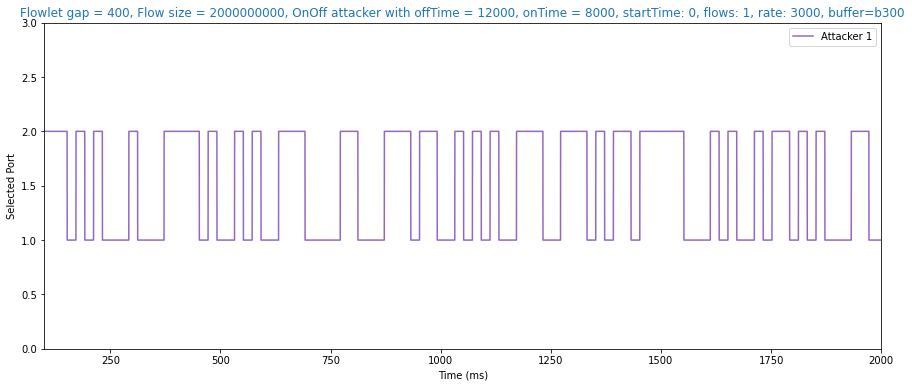

Sender Avg FCT: 5.8363
Avg FCT: 5.4047
Large Flows Avg FCT: 5.4047
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 4.5440


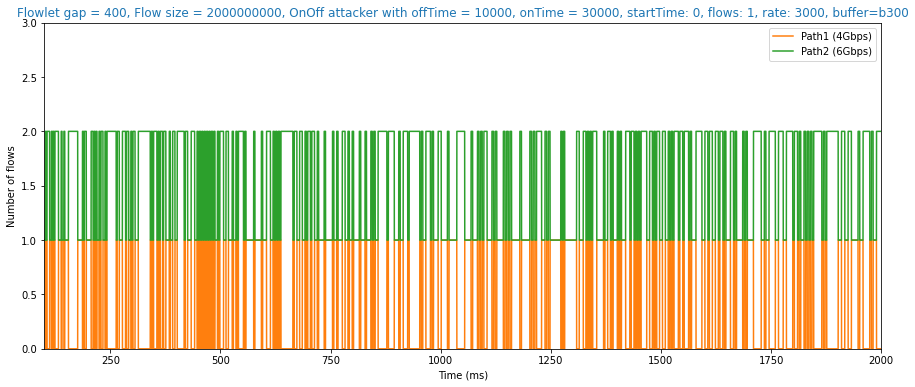

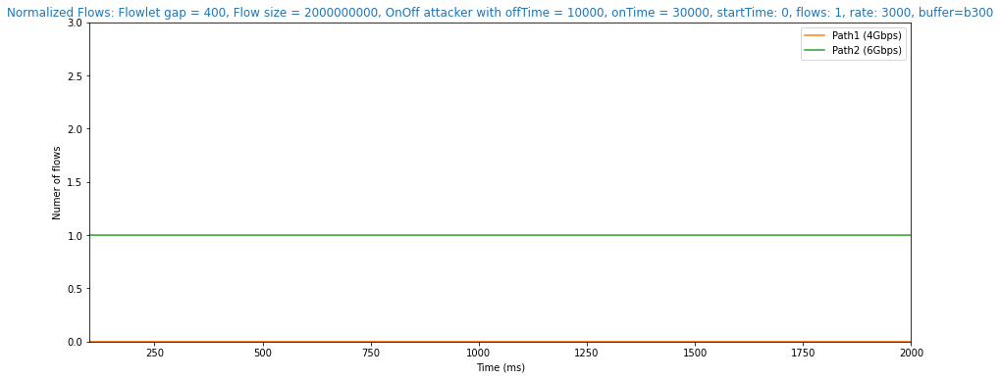

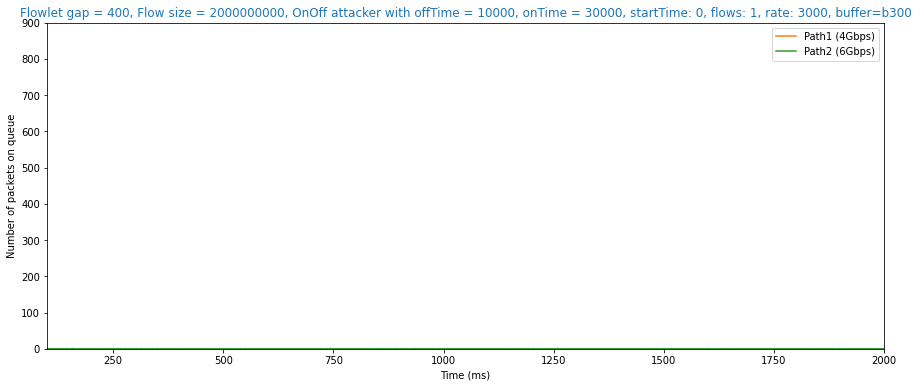

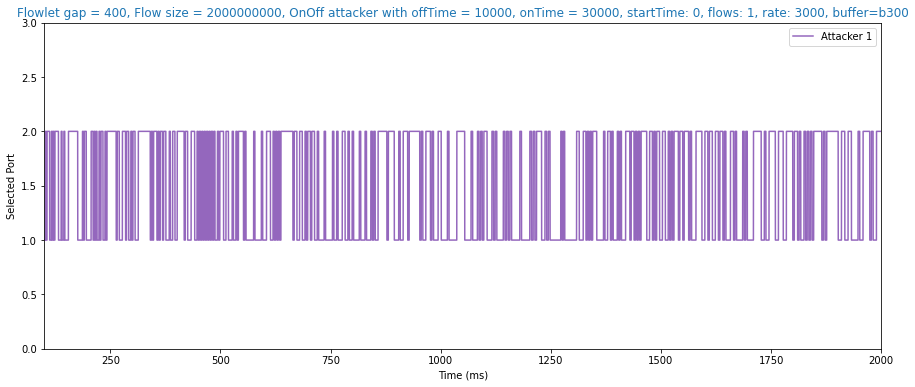

Sender Avg FCT: 5.6310
Avg FCT: 5.0211
Large Flows Avg FCT: 5.0211
Small Flows Avg FCT: -1.0000
Attacker Avg FCT: 3.8023


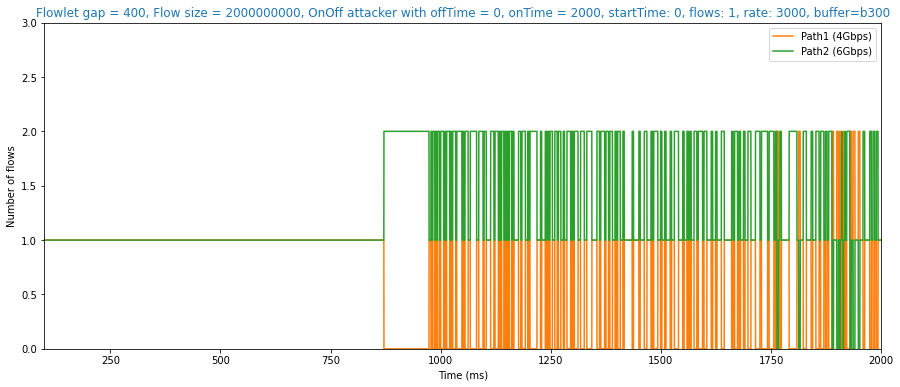

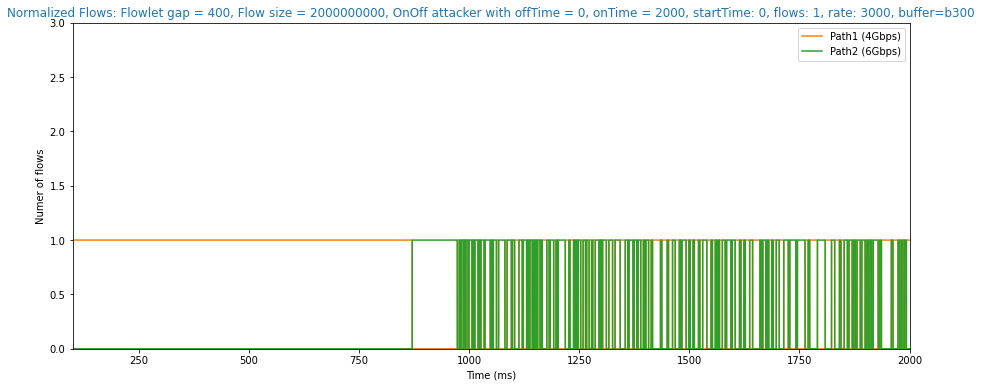

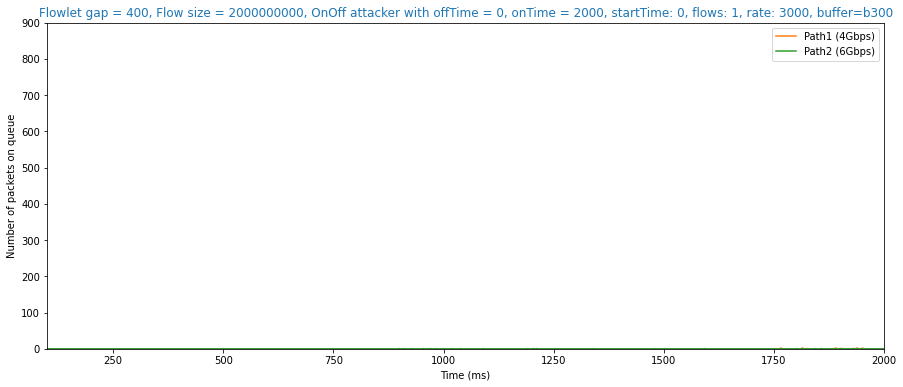

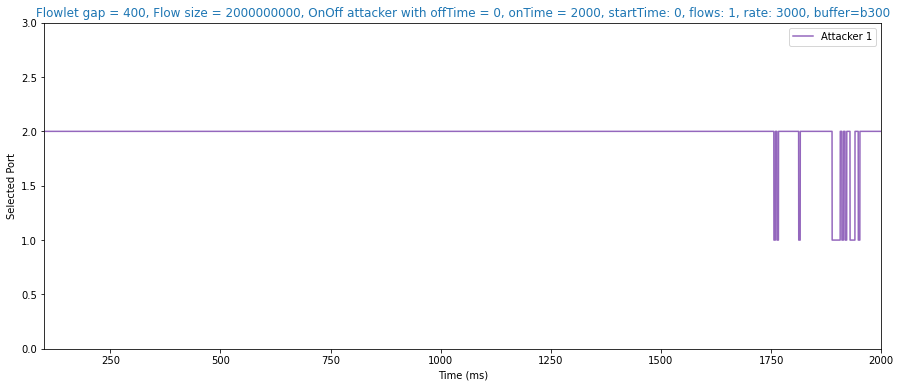

In [302]:
for i in files:
    plotSimulationRange(i,(100,2000))